## Projet 7 : Mettre en œuvre un outil de “scoring crédit” pour calculer la probabilité qu’un client rembourse son crédit, puis classifie la demande en crédit accordé ou refusé.

### Partie-1 : Analyse exploratoire des données

  - [Chargement, formats et structures des données](#Chargement,-formats-et-structures-des-données)
  - [Valeurs manquantes](#Valeurs-manquantes)
  - [Analyse exploratoire](#Analyse-exploratoire)
     * [1 - application_train](#1---application_train)
     * [2 - bureau](#2---bureau)
     * [4 - bureau_balance](#4---bureau_balance)
     * [5 - credit_card_balance](#5---credit_card_balance)
     * [6 - installments_payments](#6---installments_payments)
     * [7 - POS_CASH_balance](#7---POS_CASH_balance) 
     * [8 - previous_application](#8---previous_application)
     
  - [Conclusions de l'EDA](#Conclusions-de-l'EDA)


### Importer les modules nécéssaires 

In [1]:
import numpy as np
import pandas as pd

In [4]:
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
plt.style.use('ggplot')

In [ ]:
import gc
import time
import warnings

In [7]:
import fonctionsUtiles as fctUtiles

In [8]:
pd.set_option("display.max_colwidth", 150)
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.filterwarnings('ignore')

### Chargement, formats et structures des données

##### Chargement des données

In [9]:
application_train = pd.read_csv('data/application_train.csv')
application_test = pd.read_csv('data/application_test.csv')
bureau = pd.read_csv('data/bureau.csv')
bureau_balance = pd.read_csv('data/bureau_balance.csv')
credit_cb = pd.read_csv('data/credit_card_balance.csv')
ins_payments = pd.read_csv('data/installments_payments.csv')
pos_cash_balance = pd.read_csv('data/POS_CASH_balance.csv')
previous = pd.read_csv('data/previous_application.csv')
#sample_submission = pd.read_csv('data/sample_submission.csv')
#HomeCredit_columns_description = pd.read_csv('data/HomeCredit_columns_description.csv',encoding='unicode_escape')

##### Formats et structures des données

In [19]:
# dataframes
dfs_names = {
    'application_train' : application_train,
    'application_test' : application_test,
    'credit_card_balance' : credit_cb,
    'installments_payments' : ins_payments,
    'POS_CASH_balance' : pos_cash_balance,
    'previous_application' : previous,
    'bureau' : bureau,
    'bureau_balance' : bureau_balance
}
# formats et structures de données
for name,df in dfs_names.items():
    df1 = fctUtiles.formats(df, name)
    df2 = fctUtiles.vars_types(df)
    df3 = fctUtiles.colunmLigneDuplicated(df,'')
    del df
    gc.collect()
    dfs = {name: df1, 'Types de variables': df2, 'Colonnes/Lignes dupliquées':df3}
    fctUtiles.display_dfs(dfs, justify='flex-start')
    print('----------------------------------------------------------------------------------------------------')
    del df1, df2, df3, dfs
    gc.collect()

application_train 

 
 
 
 
 Nbre de lignes 
 Nbre de variables 
 
 
 
 
 application_train 
 307511 
 122 
 
 
 
 Types de variables 

 
 
 
 
 Objet 
 Float 
 Int 
 Bool 
 
 
 
 
 
 16 
 65 
 41 
 0 
 
 
 
 Colonnes/Lignes dupliquées 

 
 
 
 
 Colonnes dupliquées 
 Lignes dupliquées 
 
 
 
 
 
 0 
 0

----------------------------------------------------------------------------------------------------


application_test 

 
 
 
 
 Nbre de lignes 
 Nbre de variables 
 
 
 
 
 application_test 
 48744 
 121 
 
 
 
 Types de variables 

 
 
 
 
 Objet 
 Float 
 Int 
 Bool 
 
 
 
 
 
 16 
 65 
 40 
 0 
 
 
 
 Colonnes/Lignes dupliquées 

 
 
 
 
 Colonnes dupliquées 
 Lignes dupliquées 
 
 
 
 
 
 0 
 0

----------------------------------------------------------------------------------------------------


credit_card_balance 

 
 
 
 
 Nbre de lignes 
 Nbre de variables 
 
 
 
 
 credit_card_balance 
 3840312 
 23 
 
 
 
 Types de variables 

 
 
 
 
 Objet 
 Float 
 Int 
 Bool 
 
 
 
 
 
 1 
 15 
 7 
 0 
 
 
 
 Colonnes/Lignes dupliquées 

 
 
 
 
 Colonnes dupliquées 
 Lignes dupliquées 
 
 
 
 
 
 0 
 0

----------------------------------------------------------------------------------------------------


installments_payments 

 
 
 
 
 Nbre de lignes 
 Nbre de variables 
 
 
 
 
 installments_payments 
 13605401 
 8 
 
 
 
 Types de variables 

 
 
 
 
 Objet 
 Float 
 Int 
 Bool 
 
 
 
 
 
 0 
 5 
 3 
 0 
 
 
 
 Colonnes/Lignes dupliquées 

 
 
 
 
 Colonnes dupliquées 
 Lignes dupliquées 
 
 
 
 
 
 0 
 0

----------------------------------------------------------------------------------------------------


POS_CASH_balance 

 
 
 
 
 Nbre de lignes 
 Nbre de variables 
 
 
 
 
 POS_CASH_balance 
 10001358 
 8 
 
 
 
 Types de variables 

 
 
 
 
 Objet 
 Float 
 Int 
 Bool 
 
 
 
 
 
 1 
 2 
 5 
 0 
 
 
 
 Colonnes/Lignes dupliquées 

 
 
 
 
 Colonnes dupliquées 
 Lignes dupliquées 
 
 
 
 
 
 0 
 0

----------------------------------------------------------------------------------------------------


previous_application 

 
 
 
 
 Nbre de lignes 
 Nbre de variables 
 
 
 
 
 previous_application 
 1670214 
 37 
 
 
 
 Types de variables 

 
 
 
 
 Objet 
 Float 
 Int 
 Bool 
 
 
 
 
 
 16 
 15 
 6 
 0 
 
 
 
 Colonnes/Lignes dupliquées 

 
 
 
 
 Colonnes dupliquées 
 Lignes dupliquées 
 
 
 
 
 
 0 
 0

----------------------------------------------------------------------------------------------------


bureau 

 
 
 
 
 Nbre de lignes 
 Nbre de variables 
 
 
 
 
 bureau 
 1716428 
 17 
 
 
 
 Types de variables 

 
 
 
 
 Objet 
 Float 
 Int 
 Bool 
 
 
 
 
 
 3 
 8 
 6 
 0 
 
 
 
 Colonnes/Lignes dupliquées 

 
 
 
 
 Colonnes dupliquées 
 Lignes dupliquées 
 
 
 
 
 
 0 
 0

----------------------------------------------------------------------------------------------------


bureau_balance 

 
 
 
 
 Nbre de lignes 
 Nbre de variables 
 
 
 
 
 bureau_balance 
 27299925 
 3 
 
 
 
 Types de variables 

 
 
 
 
 Objet 
 Float 
 Int 
 Bool 
 
 
 
 
 
 1 
 0 
 2 
 0 
 
 
 
 Colonnes/Lignes dupliquées 

 
 
 
 
 Colonnes dupliquées 
 Lignes dupliquées 
 
 
 
 
 
 0 
 0

----------------------------------------------------------------------------------------------------


- Le dataset d'entrainement comporte 307511 observations avec 122 variables dont 16 catégorielles et 106 numériques
- Aucune ligne ni colonne dupliquées dans tous les datasets
- Aucune variable de type boolean

##### Valeurs manquantes

In [20]:
application_train = pd.read_csv('data/application_train.csv')
application_test = pd.read_csv('data/application_test.csv')
bureau = pd.read_csv('data/bureau.csv')
bureau_balance = pd.read_csv('data/bureau_balance.csv')
credit_cb = pd.read_csv('data/credit_card_balance.csv')
ins_payments = pd.read_csv('data/installments_payments.csv')
pos_cash_balance = pd.read_csv('data/POS_CASH_balance.csv')
previous = pd.read_csv('data/previous_application.csv')

In [21]:
application_train_nan = fctUtiles.data_count_percent(application_train)
del application_train
gc.collect()
application_test_nan = fctUtiles.data_count_percent(application_test)
del application_test
gc.collect()
bureau_nan = fctUtiles.data_count_percent(bureau)
del bureau
gc.collect()
bureau_balance_nan = fctUtiles.data_count_percent(bureau_balance)
del bureau_balance
gc.collect()
credit_card_balance_nan = fctUtiles.data_count_percent(credit_cb)
del credit_cb
gc.collect()
installments_payments_nan = fctUtiles.data_count_percent(ins_payments)
del ins_payments
gc.collect()
POS_CASH_balance_nan = fctUtiles.data_count_percent(pos_cash_balance)
del pos_cash_balance
gc.collect()
previous_application_nan = fctUtiles.data_count_percent(previous)
del previous
gc.collect()
#sample_submission_nan = fctUtiles.data_count_percent(sample_submission)
#HomeCredit_columns_description_nan = fctUtiles.data_count_percent(HomeCredit_columns_description)

0

In [22]:
dfs_1 = {'application_train':application_train_nan, 'application_test':application_test_nan}
del application_train_nan, application_test_nan
gc.collect()

0

In [23]:
dfs_2 = {'bureau':bureau_nan, 'bureau_balance':bureau_balance_nan,'credit_card_balance':credit_card_balance_nan}
del bureau_nan, bureau_balance_nan, credit_card_balance_nan
gc.collect()

0

In [24]:
dfs_3 = {'installments_payments':installments_payments_nan, 'POS_CASH_balance':POS_CASH_balance_nan, 'previous_application':previous_application_nan}
del installments_payments_nan, POS_CASH_balance_nan, previous_application_nan
gc.collect()

0

In [25]:
fctUtiles.display_dfs(dfs_1, justify='flex-start')
fctUtiles.display_dfs(dfs_2, justify='flex-start')
fctUtiles.display_dfs(dfs_3, justify='flex-start')
del dfs_1, dfs_2, dfs_3
gc.collect()

,count,percent
SK_ID_CURR,0,0.000000
HOUR_APPR_PROCESS_START,0,0.000000
REG_REGION_NOT_WORK_REGION,0,0.000000
LIVE_REGION_NOT_WORK_REGION,0,0.000000
REG_CITY_NOT_LIVE_CITY,0,0.000000
...,...,...
NONLIVINGAPARTMENTS_MEDI,213514,69.432963
NONLIVINGAPARTMENTS_MODE,213514,69.432963
COMMONAREA_MODE,214865,69.872297
COMMONAREA_AVG,214865,69.872297


,count,percent
SK_ID_CURR,0,0.000000
SK_ID_BUREAU,0,0.000000
CREDIT_ACTIVE,0,0.000000
CREDIT_CURRENCY,0,0.000000
DAYS_CREDIT,0,0.000000
CREDIT_DAY_OVERDUE,0,0.000000
DAYS_CREDIT_UPDATE,0,0.000000
CNT_CREDIT_PROLONG,0,0.000000
AMT_CREDIT_SUM_OVERDUE,0,0.000000
CREDIT_TYPE,0,0.000000


,count,percent
SK_ID_PREV,0,0.000000
SK_ID_CURR,0,0.000000
NUM_INSTALMENT_VERSION,0,0.000000
NUM_INSTALMENT_NUMBER,0,0.000000
DAYS_INSTALMENT,0,0.000000
AMT_INSTALMENT,0,0.000000
DAYS_ENTRY_PAYMENT,2905,0.021352
AMT_PAYMENT,2905,0.021352
,count,percent
SK_ID_PREV,0,0.000000


0

- On remarque que des variables des datasets train et test comportent le même % de valeurs manquantes.
- Les variables des autres datasets contiennent moins de 50% de NaN et certaines comportent trés peu de NaN

### Analyse exploratoire

##### Kernels utilisé comme base pour l'EDA
- https://www.kaggle.com/code/rishabhrao/home-credit-default-risk-extensive-eda/notebook
- https://medium.com/thecyphy/home-credit-default-risk-part-1-3bfe3c7ddd7a

In [26]:
application_train = pd.read_csv('data/application_train.csv')
application_test = pd.read_csv('data/application_test.csv')

##### Données d'entrainement et de test :  application_train - application_test

# 1 - application_train

- Chaque observation représente une demande de crédit identifiée par la variable *SK_ID_CURR (clé primaire).
- La variable cible prend 2 valeurs (0: le crédit a été remboursé; 1: le crédit n'a pas été remboursé).
- Ce jeu de données représente la source principale de données d'entraînement pour la modélisation de systèmes d'apprentissage supervisé.

In [27]:
#Séparer les variables selon leurs types
df_object, df_int, df_float,df_bool = fctUtiles.get_types_objects(application_train)

##### Déscription des variables

In [28]:
# Déscription des variables de type float
df_float.describe()

,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,OWN_CAR_AGE,CNT_FAM_MEMBERS,EXT_SOURCE_1,EXT_SOURCE_2,...,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,104582.000000,307509.000000,134133.000000,3.068510e+05,...,306490.000000,306490.000000,306490.000000,307510.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-4986.120328,12.061091,2.152665,0.502130,5.143927e-01,...,0.143421,1.405292,0.100049,-962.858788,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,3522.886321,11.944812,0.910682,0.211062,1.910602e-01,...,0.446698,2.379803,0.362291,826.808487,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-24672.000000,0.000000,1.000000,0.014568,8.173617e-08,...,0.000000,0.000000,0.000000,-4292.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-7479.500000,5.000000,2.000000,0.334007,3.924574e-01,...,0.000000,0.000000,0.000000,-1570.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-4504.000000,9.000000,2.000000,0.505998,5.659614e-01,...,0.000000,0.000000,0.000000,-757.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-2010.000000,15.000000,3.000000,0.675053,6.636171e-01,...,0.000000,2.000000,0.000000,-274.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,0.000000,91.000000,20.000000,0.962693,8.549997e-01,...,34.000000,344.000000,24.000000,0.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


In [29]:
# Déscription des variables de type int
df_int.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,...,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21
count,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.00000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000
mean,278180.518577,0.080729,0.417052,-16036.995067,63815.045904,-2994.202373,0.999997,0.819889,0.199368,0.998133,...,0.000007,0.003525,0.002936,0.00121,0.009928,0.000267,0.008130,0.000595,0.000507,0.000335
std,102790.175348,0.272419,0.722121,4363.988632,141275.766519,1509.450419,0.001803,0.384280,0.399526,0.043164,...,0.002550,0.059268,0.054110,0.03476,0.099144,0.016327,0.089798,0.024387,0.022518,0.018299
min,100002.000000,0.000000,0.000000,-25229.000000,-17912.000000,-7197.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,0.000000,-19682.000000,-2760.000000,-4299.000000,1.000000,1.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,0.000000,-15750.000000,-1213.000000,-3254.000000,1.000000,1.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,367142.500000,0.000000,1.000000,-12413.000000,-289.000000,-1720.000000,1.000000,1.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,456255.000000,1.000000,19.000000,-7489.000000,365243.000000,0.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [30]:
df_object.describe()

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
count,307511,307511,307511,307511,306219,307511,307511,307511,307511,211120,307511,307511,97216,153214,151170,161756
unique,2,3,2,2,7,8,5,6,6,18,7,58,4,3,7,2
top,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,Laborers,TUESDAY,Business Entity Type 3,reg oper account,block of flats,Panel,No
freq,278232,202448,202924,213312,248526,158774,218391,196432,272868,55186,53901,67992,73830,150503,66040,159428


<Axes: >

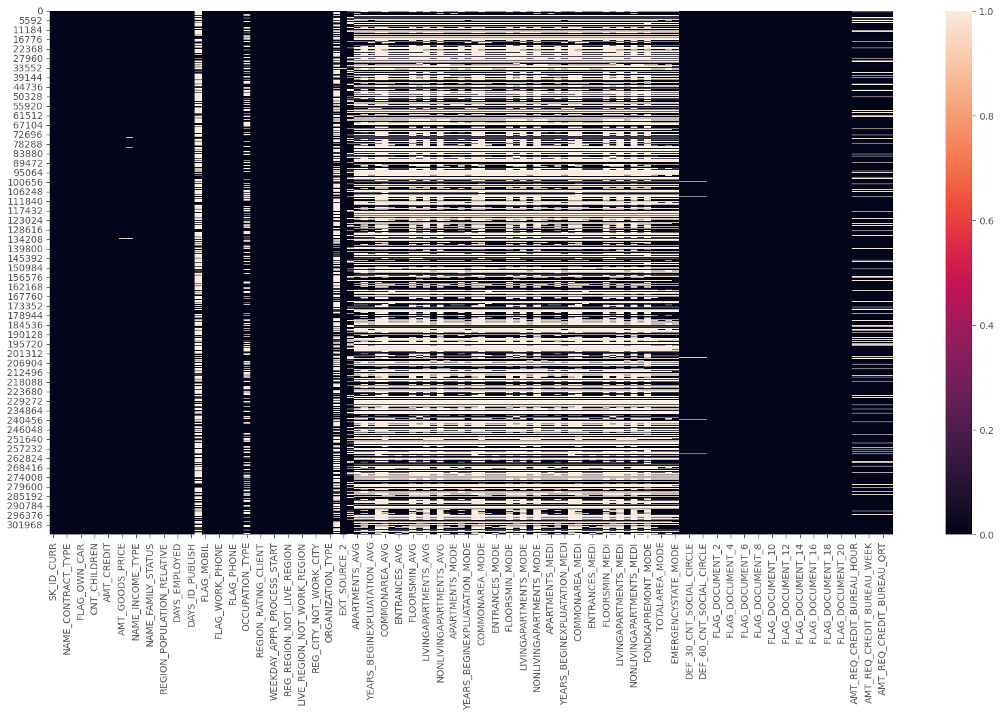

In [31]:
#Visualison des Nan dans une Heatmap
plt.figure(figsize=(20,10))
sns.heatmap(application_train.isna(), cbar=True)

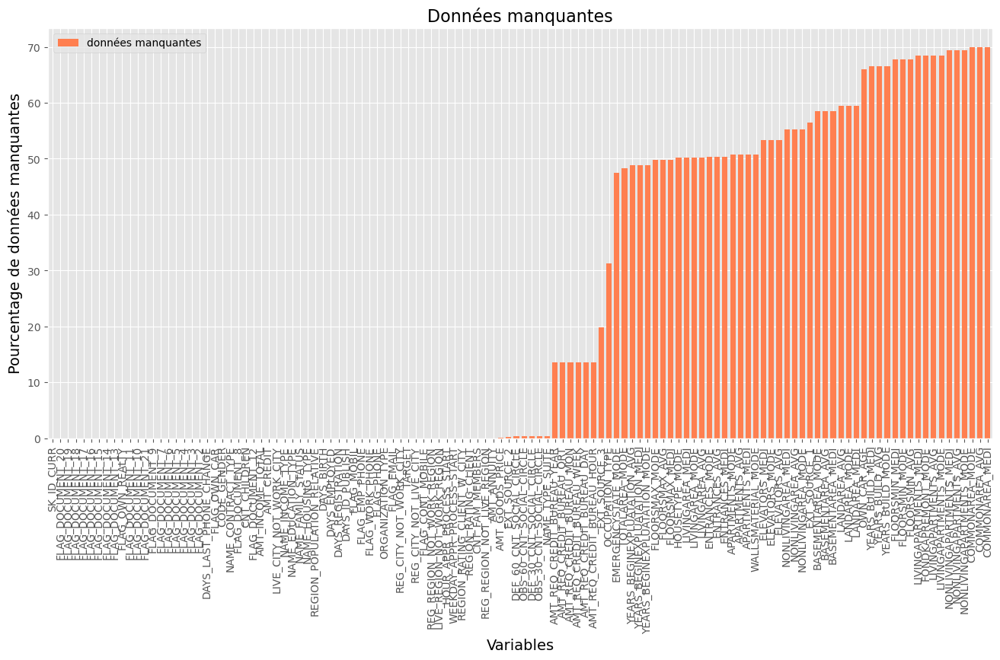

In [10]:
#Visualisation graphique
fctUtiles.visuliser_nan(application_train)

In [33]:
fctUtiles.calculModalites(df_int, 'TARGET')

,Nbre Modalité
Modalités,
0,282686
1,24825


In [34]:
fctUtiles.calculModalites(df_object, 'CODE_GENDER')

,Nbre Modalité
Modalités,
F,202448
M,105059
XNA,4


### application_test


Le jeu de données de test contient les mêmes variables que le jeu de données d'entraînement excepté la variable cible.

In [35]:
#Séparer les variables selon leurs types
df_object, df_int, df_float,df_bool = fctUtiles.get_types_objects(application_test)

In [36]:
# Déscription des variables de type float
df_float.describe()

,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,OWN_CAR_AGE,CNT_FAM_MEMBERS,EXT_SOURCE_1,EXT_SOURCE_2,...,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,4.874400e+04,4.874400e+04,48720.000000,4.874400e+04,48744.000000,48744.000000,16432.000000,48744.000000,28212.000000,48736.000000,...,48715.000000,48715.000000,48715.000000,48744.000000,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000
mean,1.784318e+05,5.167404e+05,29426.240209,4.626188e+05,0.021226,-4967.652716,11.786027,2.146767,0.501180,0.518021,...,0.143652,1.435738,0.101139,-1077.766228,0.002108,0.001803,0.002787,0.009299,0.546902,1.983769
std,1.015226e+05,3.653970e+05,16016.368315,3.367102e+05,0.014428,3552.612035,11.462889,0.890423,0.205142,0.181278,...,0.514413,3.580125,0.403791,878.920740,0.046373,0.046132,0.054037,0.110924,0.693305,1.838873
min,2.694150e+04,4.500000e+04,2295.000000,4.500000e+04,0.000253,-23722.000000,0.000000,1.000000,0.013458,0.000008,...,0.000000,0.000000,0.000000,-4361.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.125000e+05,2.606400e+05,17973.000000,2.250000e+05,0.010006,-7459.250000,4.000000,2.000000,0.343695,0.408066,...,0.000000,0.000000,0.000000,-1766.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.575000e+05,4.500000e+05,26199.000000,3.960000e+05,0.018850,-4490.000000,9.000000,2.000000,0.506771,0.558758,...,0.000000,0.000000,0.000000,-863.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,2.250000e+05,6.750000e+05,37390.500000,6.300000e+05,0.028663,-1901.000000,15.000000,3.000000,0.665956,0.658497,...,0.000000,2.000000,0.000000,-363.000000,0.000000,0.000000,0.000000,0.000000,1.000000,3.000000
max,4.410000e+06,2.245500e+06,180576.000000,2.245500e+06,0.072508,0.000000,74.000000,21.000000,0.939145,0.855000,...,34.000000,351.000000,24.000000,0.000000,2.000000,2.000000,2.000000,6.000000,7.000000,17.000000


In [37]:
# Déscription des variables de type int
df_int.describe()

,SK_ID_CURR,CNT_CHILDREN,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,...,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21
count,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,...,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.000000,48744.0,48744.0,48744.0
mean,277796.676350,0.397054,-16068.084605,67485.366322,-3051.712949,0.999979,0.809720,0.204702,0.998400,0.263130,...,0.0,0.0,0.0,0.0,0.0,0.0,0.001559,0.0,0.0,0.0
std,103169.547296,0.709047,4325.900393,144348.507136,1569.276709,0.004529,0.392526,0.403488,0.039971,0.440337,...,0.0,0.0,0.0,0.0,0.0,0.0,0.039456,0.0,0.0,0.0
min,100001.000000,0.000000,-25195.000000,-17463.000000,-6348.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
25%,188557.750000,0.000000,-19637.000000,-2910.000000,-4448.000000,1.000000,1.000000,0.000000,1.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
50%,277549.000000,0.000000,-15785.000000,-1293.000000,-3234.000000,1.000000,1.000000,0.000000,1.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
75%,367555.500000,1.000000,-12496.000000,-296.000000,-1706.000000,1.000000,1.000000,0.000000,1.000000,1.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
max,456250.000000,20.000000,-7338.000000,365243.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,0.0,0.0,0.0


In [38]:
df_object.describe()

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
count,48744,48744,48744,48744,47833,48744,48744,48744,48744,33139,48744,48744,15947,25125,24851,26535
unique,2,2,2,2,7,7,5,5,6,18,7,58,4,3,7,2
top,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,Laborers,TUESDAY,Business Entity Type 3,reg oper account,block of flats,Panel,No
freq,48305,32678,32311,33658,39727,24533,33988,32283,43645,8655,9751,10840,12124,24659,11269,26179


<Axes: >

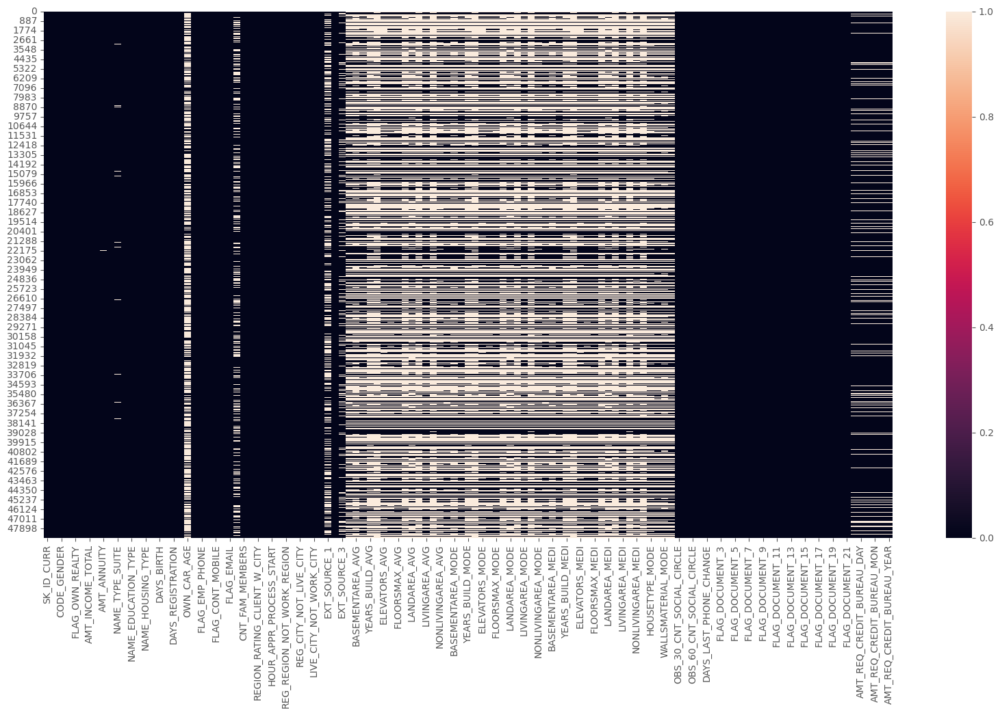

In [39]:
#Visualison des Nan dans une Heatmap
plt.figure(figsize=(20,10))
sns.heatmap(application_test.isna(), cbar=True)

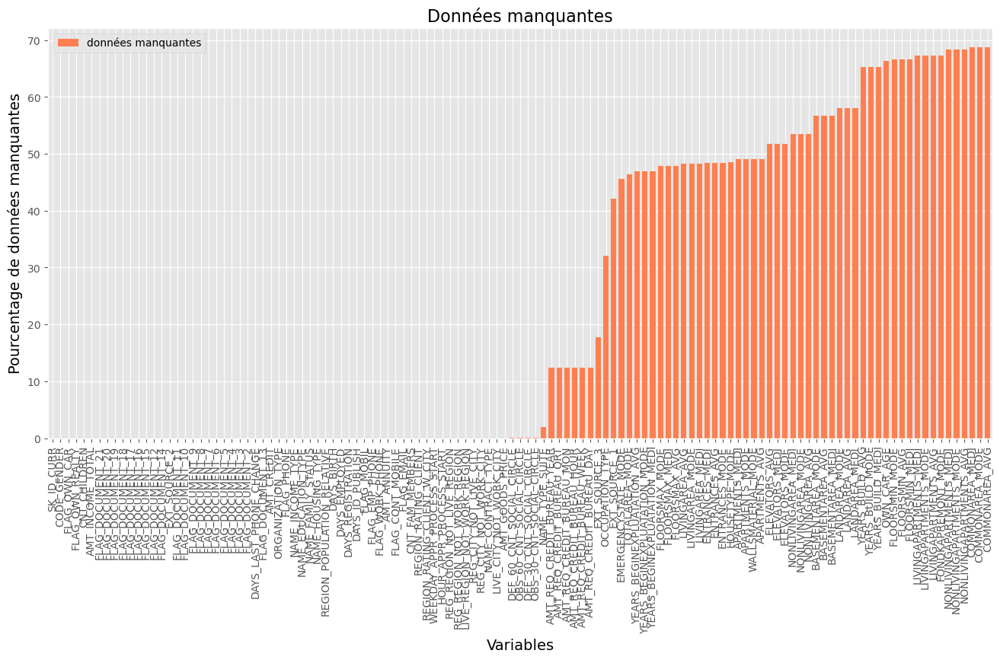

In [11]:
#Visualisation graphique
fctUtiles.visuliser_nan(application_test)

In [41]:
fctUtiles.calculModalites(df_object, 'CODE_GENDER')

,Nbre Modalité
Modalités,
F,32678
M,16066


In [42]:
# Visualisation des proportion de valeurs manquantes dans les données

#plt.style.use('seaborn-talk')
fig = plt.figure(figsize=(30, 12))
miss_train = pd.DataFrame((application_train.isnull().sum()) * 100/application_train.shape[0]).reset_index()
miss_test = pd.DataFrame((application_test.isnull().sum()) * 100/application_test.shape[0]).reset_index()
miss_train["type"] = "TRAIN"
miss_test["type"] = "TEST"
missing = pd.concat([miss_train, miss_test], axis=0)


<Figure size 3000x1200 with 0 Axes>

In [43]:
missing = missing.rename(columns={0: "y"})

Text(0.5, 0, 'Colonnes')

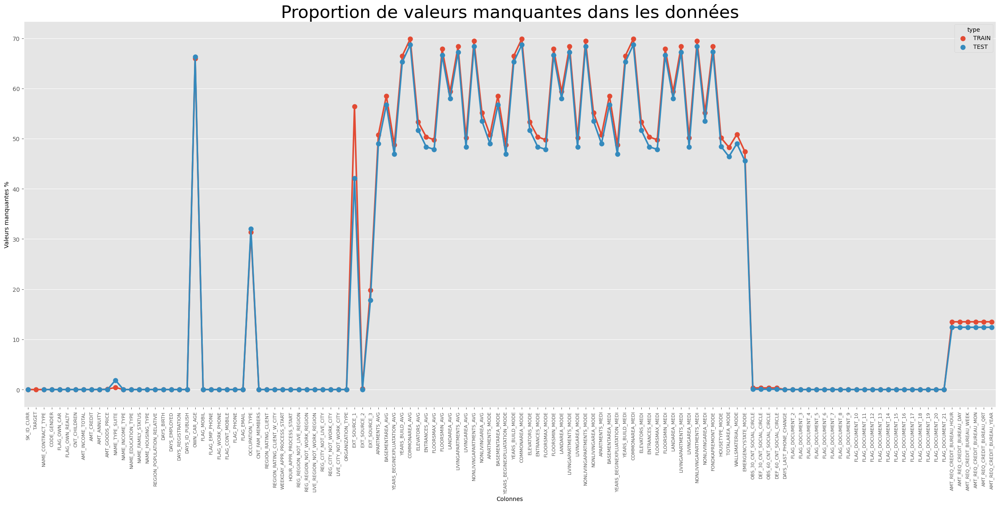

In [44]:
#plt.style.use('seaborn-talk')
fig = plt.figure(figsize=(30, 12))
ax = sns.pointplot(x="index", y="y", data=missing, hue="type", dodge=False)
plt.xticks(rotation=90, fontsize=8)
plt.title("Proportion de valeurs manquantes dans les données",fontsize=30)
plt.ylabel("Valeurs manquantes %")
plt.xlabel("Colonnes")

### Observations et conclusions :
#### - application_train.csv:
 - On remarque qu'il y a 67 colonnes sur 122 caractéristiques qui contiennent des valeurs NaN, pour un si grand nombre de colonnes, nous ne pouvons pas les supprimer telles quelles, car la perte d'informations pourrait être très importante.
- Nous voyons que certaines colonnes comme celles relatives à "COMMONAREA", "NONLIVINGAPARTMENT", etc. ont près de 70% de valeurs manquantes. Nous devrions trouver des techniques pour traiter ces nombreuses valeurs manquantes et voir ce qui fonctionnerait le mieux pour nos données.
- Il faut également noter que la plupart des colonnes qui comportent plus de 50% de valeurs manquantes sont liées aux statistiques sur les appartements de l'emprunteur. Il est très probable que ces valeurs n'aient pas été enregistrées lors de la saisie des données, et pourraient être facultatives.

#### - application_test.csv:
- Il y a un nombre de colonnes avec des valeurs NaN (64) très similaire à celui de l'application_train.
- Les pourcentages de valeurs NaN sont également assez similaires à ceux présents dans l'ensemble des données de formation. Cela signifie que les ensembles de données d'entraînement et de test ont une distribution assez similaire.

### Exploration du jeu de données principale application_train

#### - Distribution de la variable cible

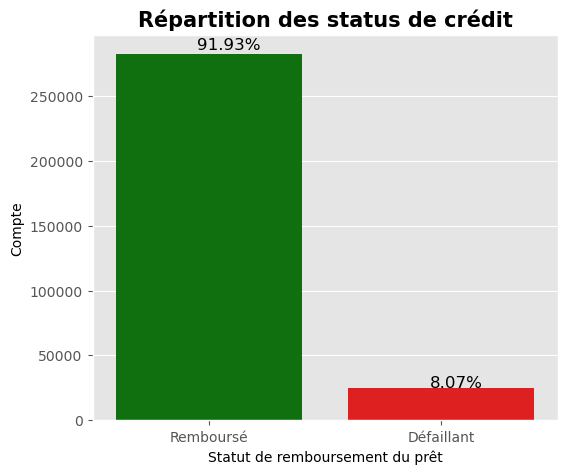

In [45]:
Imbalance = application_train["TARGET"].value_counts().reset_index()

plt.figure(figsize=(6,5))
x= ['Remboursé','Défaillant']
ax = sns.barplot(x=x,y="TARGET", data=Imbalance,palette= ['g','r'])

for p in ax.patches:
    percentage = '{:.2f}%'.format(100 * p.get_height()/len(application_train.TARGET))
    x = p.get_x() + p.get_width() / 2 - 0.05
    y = p.get_y() + p.get_height() * 1.01
    ax.annotate(percentage, (x, y), fontsize=12)

plt.xlabel("Statut de remboursement du prêt")
plt.ylabel("Compte")
plt.title("Répartition des status de crédit",fontsize=15, fontweight='bold')
plt.show()

- **Observations et conclusions :**


- De la distribution de la variable Target, une chose que nous pouvons rapidement remarquer est le déséquilibre des données. Seuls 8,07 % du total des prêts ont été effectivement défaillants. Cela signifie que les défaillants constituent la classe minoritaire. 


- Les défaillants se sont vu attribuer une variable cible de 1 et les non défaillants se sont vu attribuer la variable cible 0.


- Pour les ensembles de données déséquilibrées, lors de la construction du modèle, nous ne pouvons pas alimenter les données telles quelles pour certains algorithmes, qui sont sensibles au déséquilibre.


- C'est le cas des mesures de performance. Pour un tel ensemble de données, l'exactitude n'est généralement pas la bonne mesure car l'exactitude serait généralement biaisée en faveur de la classe majoritaire. Nous pouvons utiliser d'autres mesures telles que le score **ROC-AUC**, la perte logarithmique, **le score F1**, **la matrice de confusion** pour une meilleure évaluation du modèle.


### Matrice de corrélation

#### caractéristiques catégorielle

- Nous tracerons une carte thermique des valeurs du coefficient de corrélation **Phi-K** entre chacune des caractéristiques et l'autre. 

      - Le coefficient Phi-K est similaire au coefficient de corrélation sauf qu'il peut être utilisé avec une paire de caractéristiques catégorielles. Sa valeur maximale peut être 1, ce qui indique une association maximale entre deux variables catégorielles.

In [46]:
#['FLAG_DOCUMENT_' + str(i) for i in range(2, 22)]

In [47]:
#application_train.dtypes[application_train.dtypes == 'object'].index.tolist()

-------------------------------------------------------------------------------


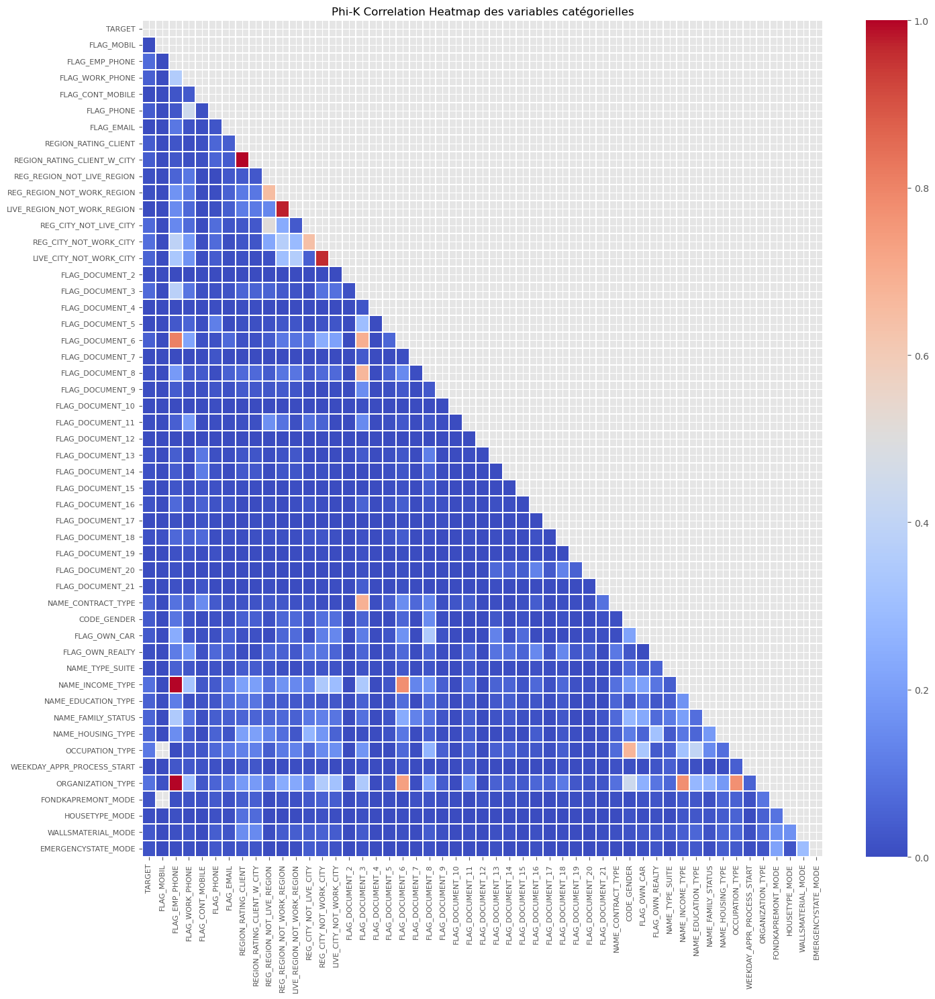

-------------------------------------------------------------------------------
Les catégories présentant les valeurs les plus élevées de la corrélation Phi-K avec la variable cible sont les suivantes :


Variable,Phik-Correlation
OCCUPATION_TYPE,0.102846
ORGANIZATION_TYPE,0.089164
NAME_INCOME_TYPE,0.084831
REG_CITY_NOT_WORK_CITY,0.079946
FLAG_EMP_PHONE,0.072087
REG_CITY_NOT_LIVE_CITY,0.069588
FLAG_DOCUMENT_3,0.069525
NAME_FAMILY_STATUS,0.056043
NAME_HOUSING_TYPE,0.051107
LIVE_CITY_NOT_WORK_CITY,0.050956


-------------------------------------------------------------------------------


In [12]:
# Matrice de corrélation
categorical_columns = ['TARGET', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE',
                       'FLAG_PHONE', 'FLAG_EMAIL', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
                       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
                       'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY',
                       'LIVE_CITY_NOT_WORK_CITY'] + ['FLAG_DOCUMENT_' + str(i) for i in range(2, 22)] + application_train.dtypes[
    application_train.dtypes == 'object'].index.tolist()
fctUtiles.plot_phik_matrix(application_train, categorical_columns,
                 figsize=(15, 15), fontsize=8, cmap='coolwarm')

- **Observations et conclusions :**

- D'après la carte thermique de la corrélation Phi-K ci-dessus, nous constatons que la plupart des caractéristiques catégorielles ne sont pas corrélées entre elles, mais que certaines d'entre elles présentent une forte corrélation tel que :


       - REGION_RATING_CLIENT_W_CITY and REGION_RATING_CLIENT
       - LIVE_REGION_NOT_WORK_REGION and REG_REGION_NOT_WORK_REGION
       - NAME_INCOME_TYPE, ORGANIZATION_TYPE and FLAG_EMP_PHONE
       
- Nous pouvons également constater une certaine corrélation entre le type d'organisation et le type de revenu d'un client. De même, nous constatons une corrélation entre le type de profession et le type d'organisation.
- Nous constatons que la catégorie OCCUPATION_TYPE, ORGANIZATION_TYPE, NAME_INCOME_TYPE, REG_CITY_NOT_WORK_CITY sont parmi les catégories les plus fortement corrélées avec la variable TARGET. Elles sont peut-être importantes pour la tâche de classification, et nécessiteraient d'autres EDA

#### caractéristiques  numérique

- Nous avons exclu la colonne **SK_ID_CURR**, car elle n'a aucune pertinence. Cette carte thermique nous aidera à identifier les caractéristiques numériques fortement corrélées et nous aidera également à identifier les variables qui sont fortement corrélées avec la variable cible.

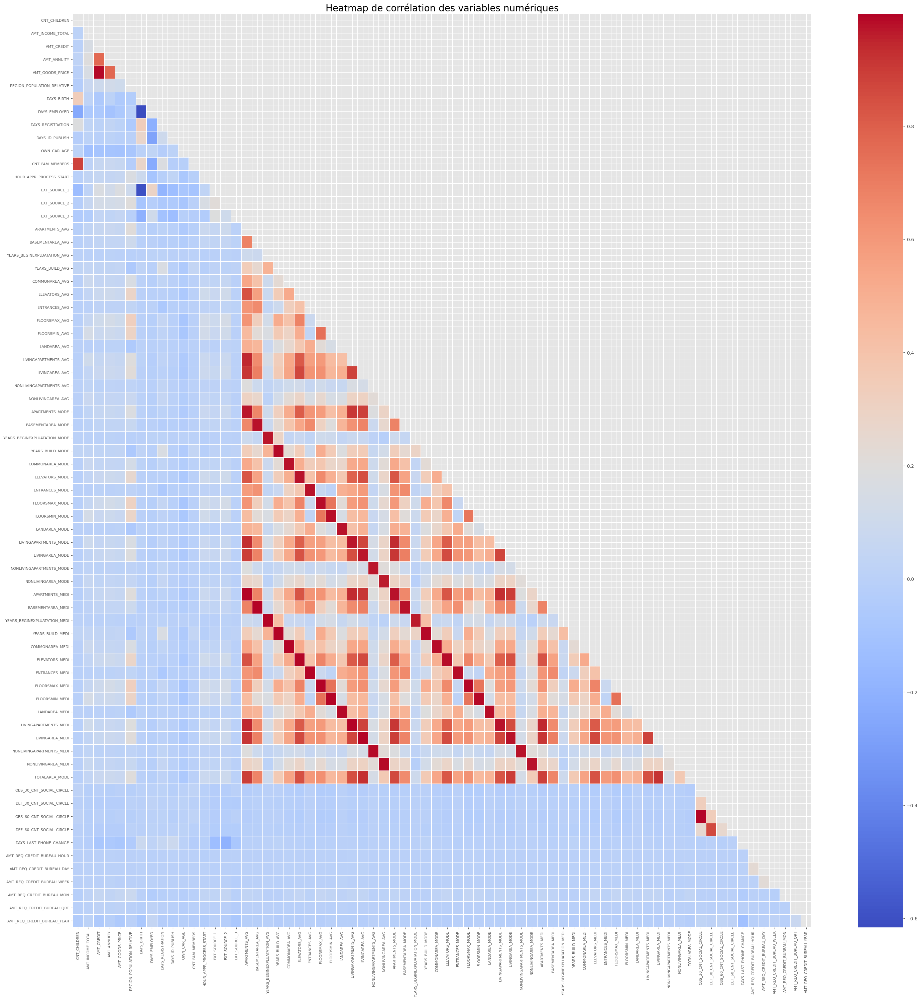

In [13]:
columns_to_drop = ['SK_ID_CURR'] + list(set(categorical_columns) - set(['TARGET']))
corr_mat = fctUtiles.correlation_matrix(application_train, columns_to_drop, figsize=(30, 30), fontsize=8, cmap='coolwarm')
corr_mat.plot_correlation_matrix()

In [50]:
# Voir les colonnes supérieures avec la plus haute corrélation phik avec
# la variable cible dans la table application_train
top_corr_target_df = corr_mat.target_top_corr()
print("-" * 79)
titre1 = 'Les variables ayant les valeurs les plus élevées de Phik'
print(titre1 + '-corrélation avec la variable cible sont les suivantes :')
display(top_corr_target_df.style.hide_index())
print("-"*79)

interval columns not set, guessing: ['TARGET', 'CNT_CHILDREN']
interval columns not set, guessing: ['TARGET', 'AMT_INCOME_TOTAL']
interval columns not set, guessing: ['TARGET', 'AMT_CREDIT']
interval columns not set, guessing: ['TARGET', 'AMT_ANNUITY']
interval columns not set, guessing: ['TARGET', 'AMT_GOODS_PRICE']
interval columns not set, guessing: ['TARGET', 'REGION_POPULATION_RELATIVE']
interval columns not set, guessing: ['TARGET', 'DAYS_BIRTH']
interval columns not set, guessing: ['TARGET', 'DAYS_EMPLOYED']
interval columns not set, guessing: ['TARGET', 'DAYS_REGISTRATION']
interval columns not set, guessing: ['TARGET', 'DAYS_ID_PUBLISH']
interval columns not set, guessing: ['TARGET', 'OWN_CAR_AGE']
interval columns not set, guessing: ['TARGET', 'CNT_FAM_MEMBERS']
interval columns not set, guessing: ['TARGET', 'HOUR_APPR_PROCESS_START']
interval columns not set, guessing: ['TARGET', 'EXT_SOURCE_1']
interval columns not set, guessing: ['TARGET', 'EXT_SOURCE_2']
interval columns 

Column Name,Phik-Correlation
EXT_SOURCE_3,0.247680
EXT_SOURCE_1,0.217846
EXT_SOURCE_2,0.213965
DAYS_BIRTH,0.102378
DAYS_LAST_PHONE_CHANGE,0.073218
DAYS_EMPLOYED,0.072095
DAYS_ID_PUBLISH,0.067766
AMT_GOODS_PRICE,0.059094
FLOORSMAX_AVG,0.058826
FLOORSMAX_MEDI,0.058595


-------------------------------------------------------------------------------


- **Observations et conclusions :**


- On peut observer que la plupart des cartes thermiques contiennent une couleur blue, ce qui indique une très faible valeur de corrélation. Cela implique que la plupart des caractéristiques ne sont en effet pas corrélées avec d'autres.

- Si nous examinons les caractéristiques d'application_train, nous pouvons clairement voir que les statistiques des appartements sont données en termes de Moyenne, Médiane et Mode, on peut donc s'attendre à ce que la moyenne, la médiane et le mode soient corrélés entre eux. Une autre chose à noter est que les caractéristiques d'une catégorie particulière, par exemple la moyenne, sont également corrélées avec d'autres caractéristiques de la moyenne, telles que le nombre d'ascenseurs, la surface habitable, la surface non habitable, la surface du sous-sol, etc.
- Nous constatons également une forte corrélation entre **AMT_GOODS_PRICE et AMT_CREDIT**, entre **DAYS_EMPLOYED et DAYS_BIRTH**.
- Nous ne voulons pas de caractéristiques fortement corrélées car elles augmentent la complexité temporelle du modèle sans lui apporter beaucoup de valeur ajoutée. Par conséquent, nous supprimerions les caractéristiques inter-corrélées.
- Parmi toutes les caractéristiques, nous constatons une corrélation élevée pour les caractéristiques **EXT_SOURCE** par rapport à la variable cible. Ces caractéristiques pourraient être importantes pour notre tâche de classification.

Text(0.5, 1.0, 'Matrice de corrélation de top 10 variables corrélées  ')

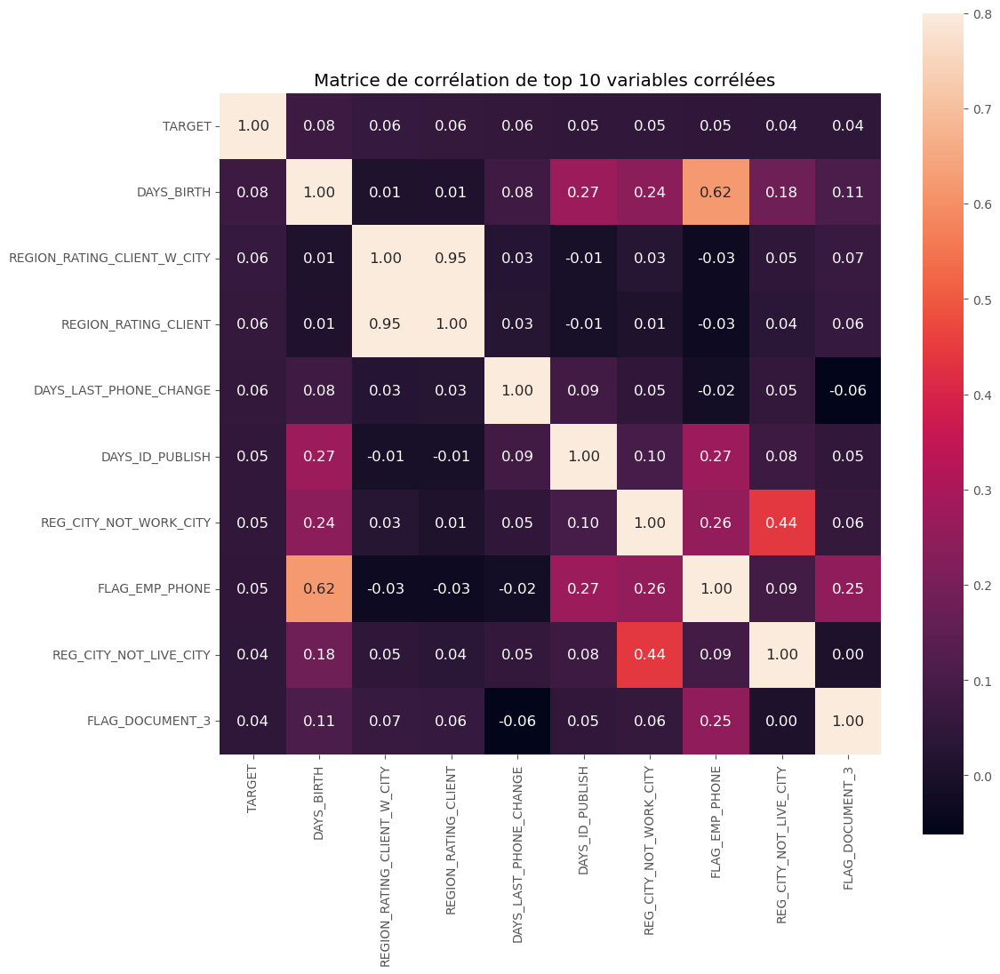

In [51]:
# top 10 variables corélées 

corrmat = application_train.corr()
top10_cols = corrmat.nlargest(10, 'TARGET')['TARGET'].index
corrmat_top10 = application_train[top10_cols].corr()
fig1, ax1 = plt.subplots(figsize=(12, 12))
sns.heatmap(corrmat_top10, vmax=.8, square=True, ax=ax1,
            annot=True, fmt='.2f', annot_kws={'size': 12})
plt.title('Matrice de corrélation de top 10 variables corrélées  ')

### Analyse de varibale catégorielle 

#### Distribution de la variable catégorielle NAME_CONTRACT_TYPE



- Cette variable contient des informations sur le type de prêt pour le demandeur donné :


      - prêt cash,
      - prêt revolving.
      
- Selon la documentation fournie par Home Credit, il existe deux types de prêts, à savoir les prêts renouvelables et les prêts en espèces.

In [12]:
# let us first see the unique categories of 'NAME_CONTRACT_TYPE'
fctUtiles.print_unique_categories(application_train, 'NAME_CONTRACT_TYPE')

# plotting the Pie Plot for the column
fctUtiles.plot_categorical_variables_pie(
    application_train, 'NAME_CONTRACT_TYPE', hole=0.5)
print('-'*100)

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'NAME_CONTRACT_TYPE' sont :
['Cash loans' 'Revolving loans']
-------------------------------------------------------------------------------


----------------------------------------------------------------------------------------------------


- **Observations et conclusions :**

- A partir du premier subplot, c'est-à-dire la distribution globale : On peut voir que la plupart des prêts que les clients prennent sont des prêts cash.

####  Distribution de la variable catégorielle NAME_INCOME_TYPE



Cette colonne contient des informations sur le type de revenu des clients (homme d'affaires, travail, congé de maternité...)

In [13]:
# let us first see the unique categories of 'NAME_INCOME_TYPE'
fctUtiles.print_unique_categories(application_train, 'NAME_INCOME_TYPE')

# plotting the Pie Plot for the column
fctUtiles.plot_categorical_variables_pie(application_train, 'NAME_INCOME_TYPE', hole=0.5)
print('-'*100)

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'NAME_INCOME_TYPE' sont :
['Working' 'State servant' 'Commercial associate' 'Pensioner' 'Unemployed'
 'Student' 'Businessman' 'Maternity leave']
-------------------------------------------------------------------------------


----------------------------------------------------------------------------------------------------


- **Observations et conclusions :**

- Le premier graphique général montre que :


     - la majorité des demandeurs sont des travailleurs (52%),
     - 23% de commerciaux, 18% de retraités et 7 % des vendeurs.
     - très peu de type de revenus passifs : non salariés, étudiants, hommes d'affaires et en congés de maternité : autour de 0%.
     
     
- Concernant les défaillants, les pourcentages du graphique général ne sont pas respectés :



     - la majorité des demandeurs ayant le taux de défaillance le plus élevé sont les catégories les plus rares du graphique général : les congés de maternité et les non salariés (près de 40%),
    -  seulement 10% de la classe majoritaire des travailleurs et 5% de la classe des commerciaux.
    - Seulement 5% des 7% des retraités ne remboursent pas leurs dettes.
    

- Le type de revenu du demandeur pourra donc avoir une influence sur la défaillance du demandeur.

####  Distribution de la variable catégorielle CODE_GENDER



Cette colonne contient des informations sur le sexe du client/demandeur. Ici, M signifie Masculin et F signifie Féminin.

In [14]:
# let us first see the unique categories of 'CODE_GENDER'
fctUtiles.print_unique_categories(application_train, 'CODE_GENDER', show_counts=True)

# plotting the Pie Plot for the Column
fctUtiles.plot_categorical_variables_pie(application_train, 'CODE_GENDER', hole=0.5)
print('-'*100)

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'CODE_GENDER' sont :
['M' 'F' 'XNA']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64
-------------------------------------------------------------------------------


----------------------------------------------------------------------------------------------------


- **Observations et conclusions :**

La distribution de la fonction CODE_GENDER semble intéressante. Voici quelques points de discussion :


- Le premier point à observer est qu'il y a 4 lignes dans la table application_train qui ont des genres "XNA", ce qui n'a pas beaucoup de sens, et peut être compté comme des valeurs NaN. Puisqu'elles ne sont que 4 en nombre et n'appartiennent qu'à la catégorie des non défaillants. Nous pouvons donc éliminer ces lignes sans trop d'hésitation.
- Dans le subplot 1, nous constatons que pour l'ensemble de données donné, il y a plus de candidats féminins (65,8 %) que de candidats masculins (34,2 %).
- Cependant, contrairement au nombre de candidates, nous constatons, à partir du deuxième subplot, que les candidats masculins ont tendance à être plus défaillants (10,14%) que les candidates féminines (7%).



- Ainsi, on peut dire que les hommes ont plus tendance à ne pas payer leurs dettes que les femmes selon l'ensemble de données donné.

####  Distribution de la variable catégorielle FLAG_EMP_PHONE



Cette colonne est une colonne booléenne, qui indique si le client a fourni ou non son numéro de téléphone au travail.
Ici, 1 signifie Oui et 0 signifie Non.

In [15]:
# let us first see the unique categories of 'FLAG_EMP_PHONE'
fctUtiles.print_unique_categories(application_train, 'FLAG_EMP_PHONE')

# plotting the Pie Plot for the Column
fctUtiles.plot_categorical_variables_pie(
    application_train, column_name='FLAG_EMP_PHONE', hole=0.5)
print('-'*100)

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'FLAG_EMP_PHONE' sont :
[1 0]
-------------------------------------------------------------------------------


----------------------------------------------------------------------------------------------------


- **Observations et conclusions :**


- Cette fonction contient deux catégories, à savoir si le client a fourni son numéro de téléphone au travail pendant la procédure d'enregistrement/de demande ou non.



- D'après le premier subplot, nous constatons que la plupart des demandeurs ne fournissent pas leur numéro de téléphone professionnel (82 %) et que seulement 18 % ont fourni leur numéro de téléphone professionnel. On peut également constater que la tendance par défaut pour ceux qui fournissent leur numéro de téléphone au travail est plus élevée que pour ceux qui ne le fournissent pas. Cette caractéristique pourrait être attribuée au fait que les défaillants pourraient fournir leurs numéros de téléphone professionnels afin de ne pas être dérangés sur leur téléphone personnel.

####   Distribution de la variable catégorielle REGION_RATING_CLIENT_W_CITY



Cette caractéristique est la notation fournie par le Crédit immobilier à la région de chaque client sur la base des enquêtes qu'ils ont pu effectuer. Cette notation tient également compte de la ville dans laquelle le client vit.
La prise en compte de la ville est importante car même si certaines régions ont une bonne note dans une ville particulière, mais que cette ville n'a pas une note élevée, alors le candidat se verrait attribuer une note moyenne et non une note élevée.
Il contient des valeurs comprises entre 1 et 3.

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'REGION_RATING_CLIENT_W_CITY' sont :
[2 1 3]
-------------------------------------------------------------------------------


----------------------------------------------------------------------------------------------------


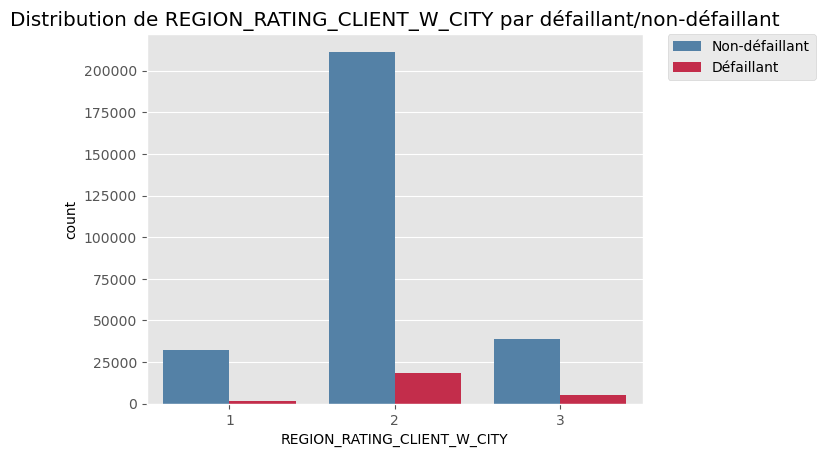

In [16]:
# let us first see the unique categories of 'REGION_RATING_CLIENT_W_CITY'
fctUtiles.print_unique_categories(application_train, 'REGION_RATING_CLIENT_W_CITY')

# plotting the Pie Plot for the Column
fctUtiles.plot_categorical_variables_pie(
    application_train, column_name='REGION_RATING_CLIENT_W_CITY')
print('-'*100)
# Distribution par défaillants/non-défaillants
fctUtiles.plot_barplot_comp_target(application_train,
                                'REGION_RATING_CLIENT_W_CITY')

- **Observations et conclusions :**

Les tracés ci-dessus nous permettent de tirer les conclusions suivantes :

- Dès le premier subplot, nous voyons que la plupart des clients (74,6 %) ont une note de 2 pour la région, ce qui correspond à la valeur moyenne pour la plupart des demandeurs.
Très peu de demandeurs ont une note de 1 pour la région (seulement 11,1 %) et certains ont une note de 3 (14,3 %).

- Cela montre que la note 3 pourrait être un attribut important pour prendre une décision sur les caractéristiques par défaut.

####   Distribution de la variable catégorielle NAME_HOUSING_TYPE



Cette fonction indique quelle est la situation du client en matière de logement (location, vie avec les parents, ...)

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'NAME_HOUSING_TYPE' sont :
['House / apartment' 'Rented apartment' 'With parents'
 'Municipal apartment' 'Office apartment' 'Co-op apartment']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
House / apartment      272868
With parents            14840
Municipal apartment     11183
Rented apartment         4881
Office apartment         2617
Co-op apartment          1122
Name: NAME_HOUSING_TYPE, dtype: int64
-------------------------------------------------------------------------------
Nombre de catégories uniques pour NAME_HOUSING_TYPE = 6


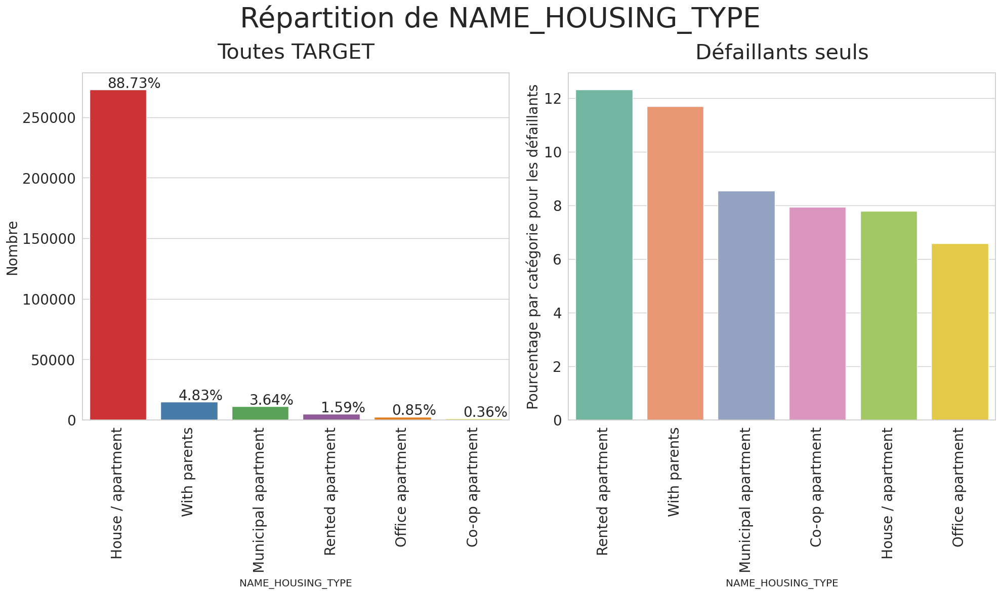

----------------------------------------------------------------------------------------------------


In [17]:
# let us first see the unique categories of 'NAME_HOUSING_TYPE'
fctUtiles.print_unique_categories(
    application_train, 'NAME_HOUSING_TYPE', show_counts=True)

# plotting the Bar Plot for the Column
fctUtiles.plot_categorical_variables_bar(
    application_train, column_name='NAME_HOUSING_TYPE', figsize=(20, 12),
                                   rotation=90, horizontal_adjust=0.25,
                                   fontsize_percent=20)
print('-'*100)

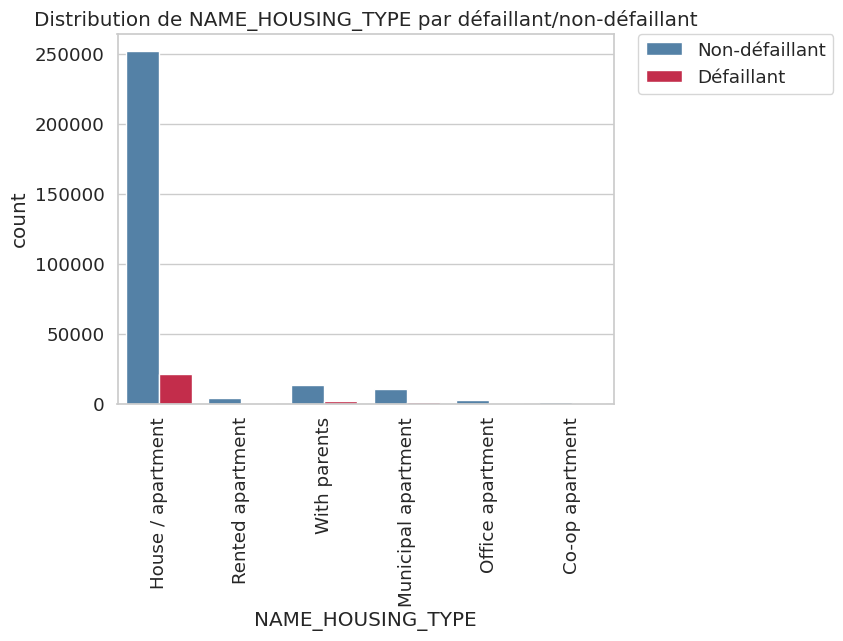

In [18]:
# Distribution par défaillants/non-défaillants
fctUtiles.plot_barplot_comp_target(application_train,
                                              'NAME_HOUSING_TYPE',
                                              rotation=90)

- **Observations et conclusions :**

- Le premier graphique général montre :



      - que la majorité (89%)des demandeurs sont propriétaires d'une maison ou d'un appartement.
      - que 5% des demandeurs vivent chez leurs parents.
      - et les 5 autres pourcent concernent les appartements de location, municipaux ou les co-locations.
   
- Le second graphique, qui effectue un zoom sur les défaillants, montre que les personnes qui ont le taux de défaillance le plus élevé, font partie des 5% restant du graphique général : la majorité loue un appartement ou habitent chez leurs parents mais ne sont pas propriétaire.




- La situation du logement du demandeur pourra donc avoir une influence sur la défaillance potentielle du demandeur.

####    - Distribution de la variable catégorielle OCCUPATION_TYPE



Cette fonction indique le type d'activité professionnelle du client. Il peut s'agir d'une caractéristique très importante qui pourrait décrire les caractéristiques par défaut d'un client.

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'OCCUPATION_TYPE' sont :
['Laborers' 'Core staff' 'Accountants' 'Managers' nan 'Drivers'
 'Sales staff' 'Cleaning staff' 'Cooking staff' 'Private service staff'
 'Medicine staff' 'Security staff' 'High skill tech staff'
 'Waiters/barmen staff' 'Low-skill Laborers' 'Realty agents' 'Secretaries'
 'IT staff' 'HR staff']
-------------------------------------------------------------------------------
Nombre de catégories uniques pour OCCUPATION_TYPE = 19


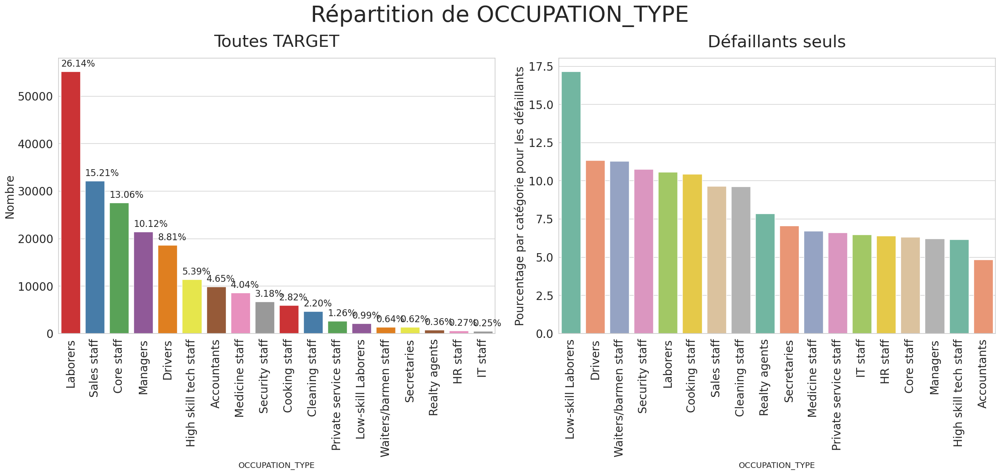

----------------------------------------------------------------------------------------------------


In [19]:
# let us first see the unique categories of 'OCCUPATION_TYPE'
fctUtiles.print_unique_categories(application_train, 'OCCUPATION_TYPE')

# plotting the Bar Plot for the Column
fctUtiles.plot_categorical_variables_bar(
    application_train, column_name='OCCUPATION_TYPE', figsize=(25, 12), rotation=90,
                                   fontsize_percent=16)
print('-'*100)

- **Observations et conclusions :**


A partir des graphiques du secteur d'activité, nous pouvons tirer les observations suivantes :

- parmi les demandeurs, le type d'emploi le plus courant est celui des ouvriers, qui représente près de 26 % des demandes. La deuxième profession la plus fréquente est celle du personnel de vente, suivie du personnel de base et des cadres.

- Le taux de défaillance des travailleurs peu qualifiés est le plus élevé parmi tous les types de professions (~17,5 %). Il est suivi par les chauffeurs, les serveurs, le personnel de sécurité, les ouvriers, le personnel de cuisine, etc. Tous ces emplois sont des emplois de bas niveau. Tous les emplois sont des emplois de bas niveau. Cela montre que les personnes occupant des emplois de bas niveau ont tendance à avoir un taux de défaillance plus élevé.


- Les taux de défaillance les plus faibles concernent les comptables, le personnel de base, les gestionnaires, le personnel technique hautement qualifié, le personnel des ressources humaines, etc. qui occupent des postes de niveau moyen à élevé.
On peut donc conclure que les travailleurs de bas niveau ont une plus grande tendance à la défaillance que les travailleurs de niveau moyen à élevé.

####   - Distribution de la variable catégorielle ORGANIZATION_TYPE




Tout comme le type de profession, le secteur d'activité auquel le client appartient peut également être une caractéristique importante pour prédire le risque de défaillance de ce client.

Nombre de catégorie de la variable ORGANIZATION_TYPE = 58


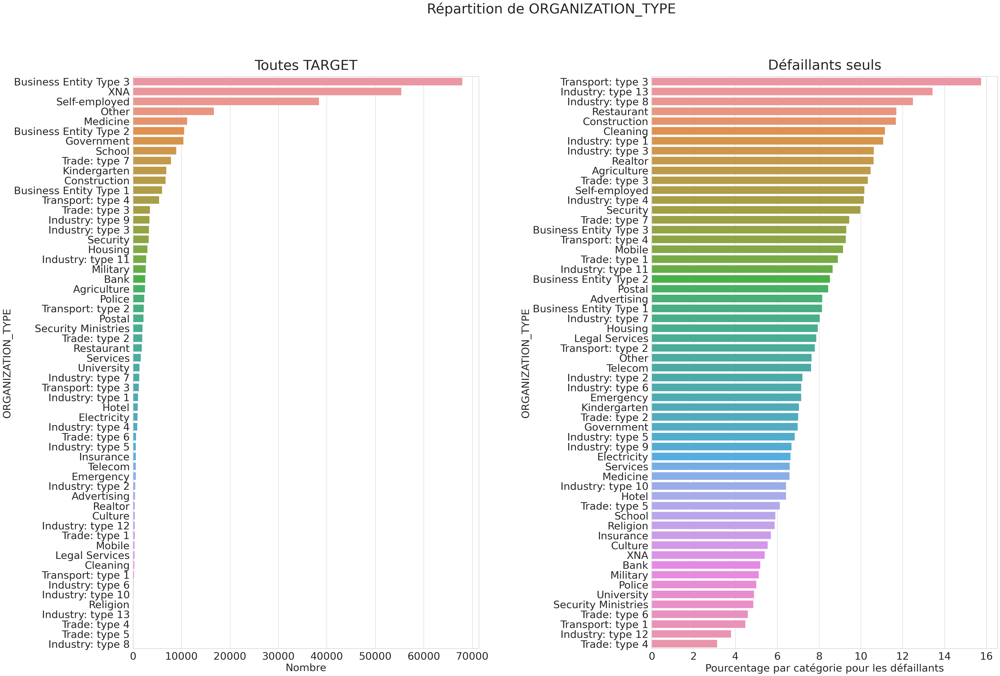

In [20]:
print(f"Nombre de catégorie de la variable ORGANIZATION_TYPE = \
{len(application_train.ORGANIZATION_TYPE.unique())}")

plt.figure(figsize=(45, 30))
sns.set(style='whitegrid', font_scale=1.2)
plt.subplots_adjust(wspace=0.5)

plt.subplot(1, 2, 1)
count_organization = application_train.ORGANIZATION_TYPE.value_counts() \
    .sort_values(ascending=False)
sns.barplot(x=count_organization, y=count_organization.index)
plt.title('Toutes TARGET', pad=20, fontsize=40)
plt.xlabel('Nombre', fontsize=30)
plt.ylabel('ORGANIZATION_TYPE', fontsize=30)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

plt.subplot(1, 2, 2)
percentage_default_per_organization = \
    application_train[application_train.TARGET == 1].ORGANIZATION_TYPE. \
    value_counts() * 100 / count_organization
percentage_default_per_organization = \
    percentage_default_per_organization.dropna(). \
    sort_values(ascending=False)
sns.barplot(x=percentage_default_per_organization,
            y=percentage_default_per_organization.index)
plt.title('Défaillants seuls', pad=20, fontsize=40)
plt.xlabel('Pourcentage par catégorie pour les défaillants', fontsize=30)
plt.ylabel('ORGANIZATION_TYPE', fontsize=30)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

plt.suptitle(f'Répartition de ORGANIZATION_TYPE', fontsize=40)
plt.show()

- **Observations et conclusions :**


Il existe de nombreux types d'organisations auxquelles le client appartient, 58 pour être précis. Les graphiques ci-dessus donnent les observations suivantes :

- Dès le premier graphique, nous constatons que la plupart des demandeurs travaillent dans des organisations de type "entité commerciale de type 3", "XNA" ou "travailleur indépendant". Le type d'organisation "XNA" pourrait probablement désigner une organisation non classée TYPE.
- À partir du deuxième graphique, nous constatons que les candidats appartenant à "Transport : type 3" ont la plus forte tendance à la défaillance par rapport aux autres. Ils sont suivis par les organisations de type : "Industrie : type 13", "Industrie : type 8", "Restaurant", "Construction", etc.
- Les organisations qui affichent les taux de défaillance les plus faibles sont "Commerce : type 4", "Industrie : type 12", etc.



Ces numéros de type en diraient également plus sur l'Organisation, cependant, nous n'avons aucune information à ce sujet, nous nous en tiendrons donc à la dénomination qui nous a été fournie.

####  -  Distribution de la variable catégorielle REG_CITY_NOT_LIVE_CITY, REG_CITY_NOT_WORK_CITY, LIVE_CITY_NOT_WORK_CITY

- REG_CITY_NOT_LIVE_CITY, REG_CITY_NOT_WORK_CITY:
Ces colonnes comprennent des flags indiquant si l'adresse permanente du client correspond ou non à son adresse de contact donnée pour le prêt ou à son adresse professionnelle au niveau de la région

        - 1 pour des adresses différentes,
        - 0 pour des adresses identiques.

- LIVE_CITY_NOT_WORK_CITY Cette colonne indique si l'adresse permanente du client correspond ou non à son adresse de contact donnée pour le prêt au niveau de la ville. Ici, 1 indique des adresses différentes et 0 indique les mêmes adresses.


         - 1 pour des adresses différentes,
         - 0 pour des adresses identiques.

----------------------------------------------------------------------------------------------------
Nombre de catégories uniques pour REG_CITY_NOT_LIVE_CITY = 2


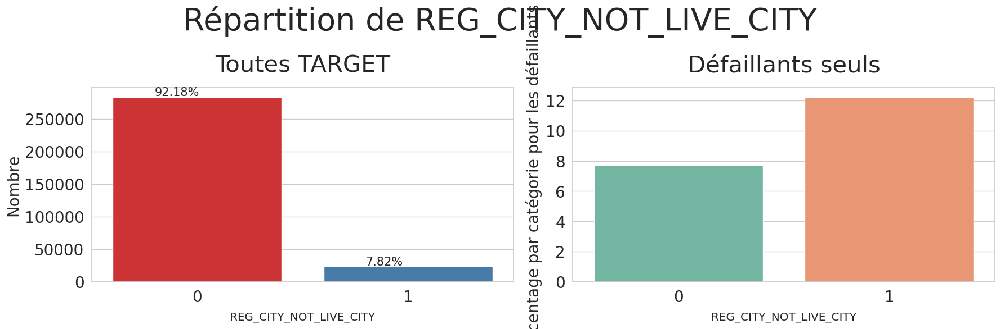

----------------------------------------------------------------------------------------------------
Nombre de catégories uniques pour REG_CITY_NOT_WORK_CITY = 2


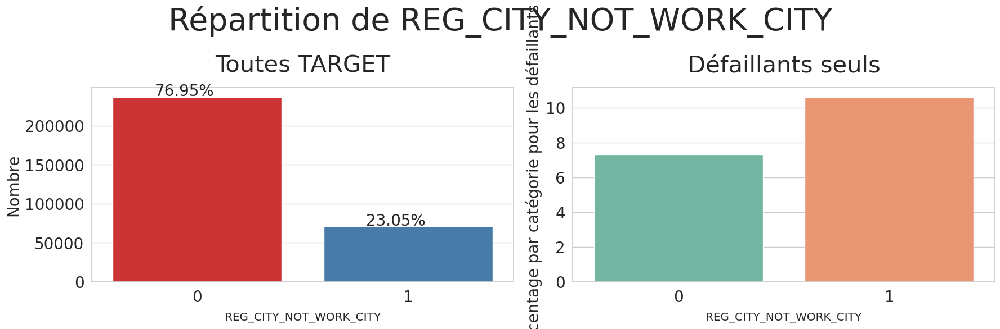

----------------------------------------------------------------------------------------------------
Nombre de catégories uniques pour LIVE_CITY_NOT_WORK_CITY = 2


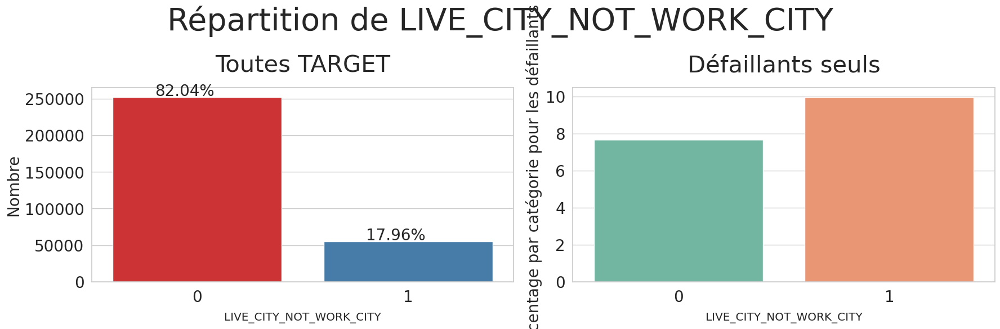

----------------------------------------------------------------------------------------------------


In [21]:
print('-'*100)
fctUtiles.plot_categorical_variables_bar(
    application_train, column_name='REG_CITY_NOT_LIVE_CITY', figsize=(18, 6), horizontal_adjust=0.20, fontsize_percent=15,)
print('-'*100)
fctUtiles.plot_categorical_variables_bar(
    application_train, column_name='REG_CITY_NOT_WORK_CITY', figsize=(18, 6), horizontal_adjust=0.20, fontsize_percent=20,)
print('-'*100)
fctUtiles.plot_categorical_variables_bar(
    application_train, column_name='LIVE_CITY_NOT_WORK_CITY', figsize=(18, 6), horizontal_adjust=0.20, fontsize_percent=20,)
print('-'*100)

- **Observations et conclusions :**


Les trois graphiques ci-dessus permettent de tirer les conclusions suivantes :

- De tous les candidats, il n'y a qu'une minorité de candidats dont les adresses ne correspondent pas.


      - Tout d'abord, 7,52 % seulement des personnes ont une adresse permanente différente de leur adresse de contact au niveau de la région.
      - De plus, environ 23,05 % des personnes ont une adresse permanente différente de leur adresse professionnelle au niveau régional. Ce chiffre plus élevé s'explique par le fait qu'il est possible qu'elles travaillent dans une région différente de celle de leur adresse permanente.
      - Enfin, environ 17,96% des personnes ont une adresse permanente différente de leur adresse de contact au niveau de la ville.
      
- Si nous examinons les caractéristiques par défaut, nous constatons qu'il y a une tendance maximale à la défaillance des personnes dont l'adresse permanente et l'adresse de contact sont différentes au niveau de la région, qui est suivie par une adresse permanente et une adresse de travail différentes et enfin une adresse permanente et une adresse de contact différentes au niveau de la ville.

- Dans tous les cas, on constate que la tendance par défaut des personnes qui ont des adresses différentes est plus élevée que celle des personnes qui ont la même adresse. Cela signifie que, quelque part, cette différence d'adresse peut suggérer un risque de défaillance.

####   - Distribution de la variable catégorielle  FLAG_DOCUMENT_3


Cette colonne contient le flag d'un document qui devait être présenté par le demandeur. Sa valeur est de 0 si le client a fourni le document et de 1 si ce n'est pas le cas.

Nombre de catégories uniques pour FLAG_DOCUMENT_3 = 2


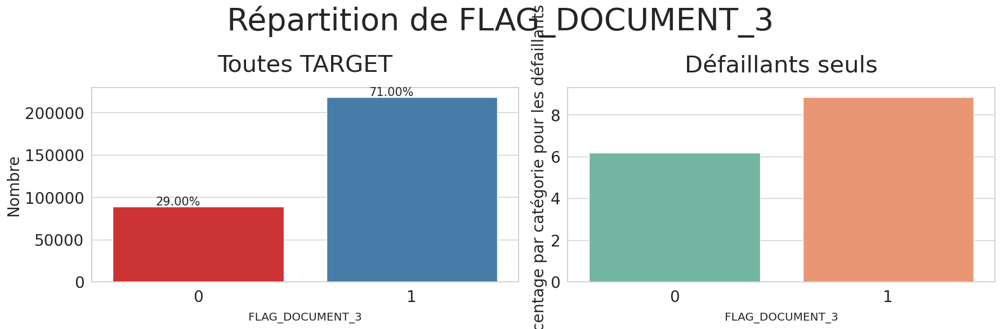

In [22]:
fctUtiles.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_3', figsize=(18, 6),  horizontal_adjust=0.20, fontsize_percent=15)

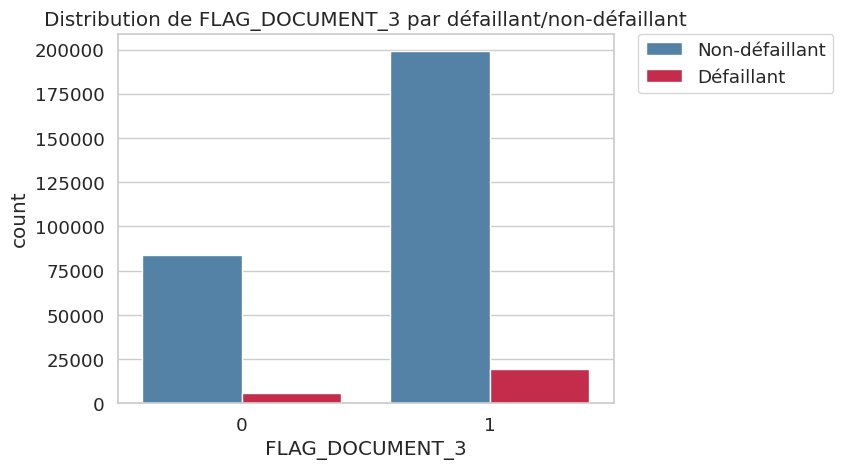

In [23]:
# Distribution par défaillants/non-défaillants
fctUtiles.plot_barplot_comp_target(application_train,'FLAG_DOCUMENT_3')

- **Observations et conclusions :**

D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la plupart des demandeurs n'ont pas fourni ce document (~71%) et que seulement 29% l'ont fait.
- Dans le deuxième sous-graphe, nous constatons que ceux qui ont fourni ce document ont un taux de défaillance plus élevé que ceux qui ne l'ont pas fourni. Cela signifie que les demandeurs qui ont fourni le Document_3 ont tendance à manquer à leurs engagements plus que ceux qui ne l'ont pas fait.


Il pourrait peut-être s'agir d'un certificat BPL ou autre, mais nous n'avons pas reçu cette information et nous ne pouvons donc rien dire sur le type de ce document.

### Analyse de varibale numérique

####   - Distribution de l'âge variable continu du candidat


L'âge est indiqué en jours, ce qui peut être plus difficile à interpréter. Nous allons donc créer une variable latente pour stocker les âges en années, ce qui sera plus facile à analyser et à interpréter.

- Les chiffres de la colonne DAYS_BIRTH sont négatifs car ils
sont enregistrés par rapport à la demande de prêt en cours.

- Pour voir ces statistiques en années, nous pouvons les
multiplier par -1 et les diviser par le nombre de jours dans une année

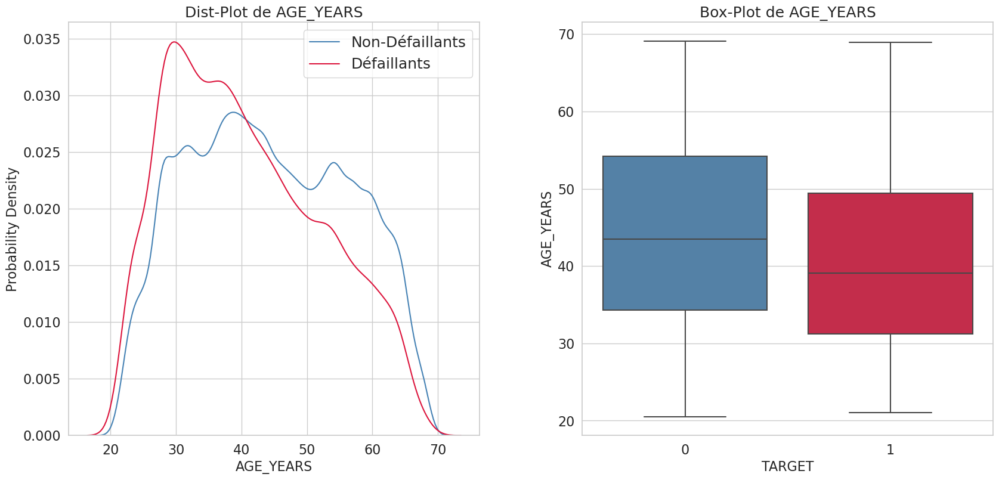

In [26]:
application_train['AGE_YEARS'] = application_train['DAYS_BIRTH'] * -1 / 365
fctUtiles.plot_continuous_variables(application_train, 'AGE_YEARS', plots=['distplot', 'box'])
_ = application_train.pop('AGE_YEARS')

- **Observations et conclusions :**


Les deux graphiques ci-dessus nous permettent de tirer des conclusions importantes.

- Du dist-Plot, nous pouvons observer le pic d'âge des personnes qui se rapprochent par défaut de 30 ans. En outre, à ce stade, les personnes qui ne sont pas en défaut ont une PDF beaucoup plus petite. Une autre chose à noter est que la PDF de l'âge pour les défaillants commence un peu à gauche de celle des non défaillants, et est également un peu à travers toute la gamme. Cela signifie que les défendeurs sont généralement plus jeunes que les non défendeurs.
- De la même façon, on peut mieux visualiser la même chose avec les box-plots. L'âge des défaillants est généralement inférieur à celui des non défaillants. Tous les quantiles d'âge des défaillants sont inférieurs à ceux des non défaillants. La valeur du 75e centile des non défaillants se situe autour de 54 ans, tandis que pour les défaillants, elle est proche de 49 ans. Ces observations impliquent que les défaillants sont généralement plus jeunes que les non défaillants.

####   - Distribution of Continuous Variables with DAYS features

- **DAYS_EMPLOYED**
Cette variable indique le nombre de jours à partir du jour de la demande où le demandeur a été employé. Pour faciliter l'interprétation, nous allons convertir les jours en années.

-------------------------------------------------------------------------------
Pecentiles de la variable DAYS_EMPLOYED
Pecentile 0 = -17912.0
Pecentile 25 = -2760.0
Pecentile 50 = -1213.0
Pecentile 75 = -289.0
Pecentile 90 = 365243.0
Pecentile 92 = 365243.0
Pecentile 94 = 365243.0
Pecentile 96 = 365243.0
Pecentile 98 = 365243.0
Pecentile 100 = 365243.0
-------------------------------------------------------------------------------


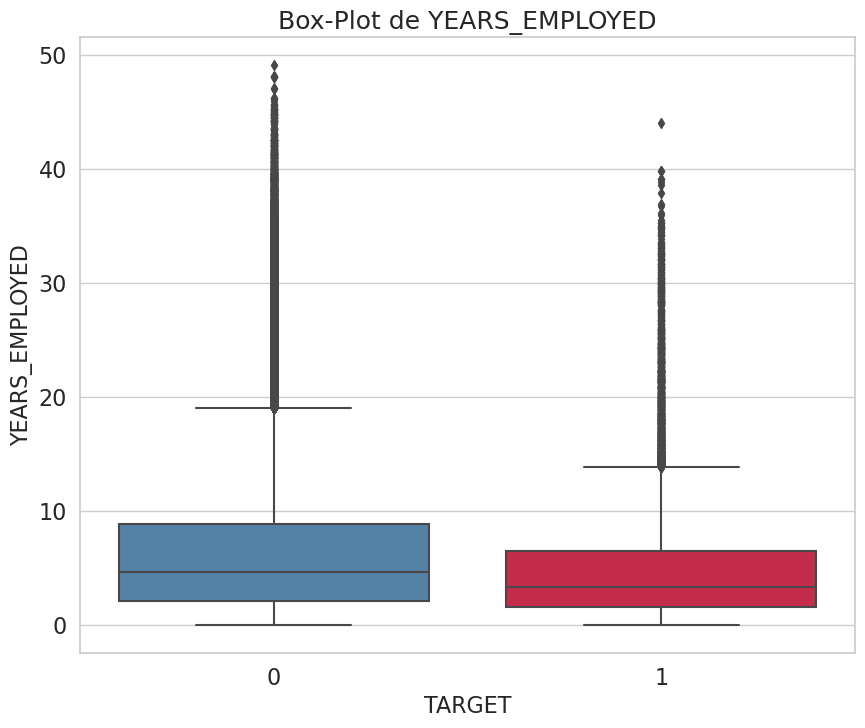

In [27]:
application_train['YEARS_EMPLOYED'] = application_train.DAYS_EMPLOYED * -1 / 365
fctUtiles.print_percentiles(application_train, 'DAYS_EMPLOYED')
fctUtiles.plot_continuous_variables(application_train, 'YEARS_EMPLOYED', plots=[
                          'box'], scale_limits=[0, 70], figsize=(10, 8))
_ = application_train.pop('YEARS_EMPLOYED')

- **Observations et conclusions :**
- Nous constatons que la colonne DAYS_EMPLOYED contient des points de données erronés avec les valeurs 365243. Ces valeurs semblent être erronées.
- Sur le box-plot, nous observons que les défaillants semblent avoir moins d'années d'emploi que les non défaillants. Les 25e, 50e et 75e quantiles des défaillants sont tous inférieurs à ceux des non défaillants.

- **DAYS_ID_PUBLISH**


Cette colonne indique combien de jours, à partir du jour de l'enregistrement, le client a modifié son document d'identité avec lequel il a demandé un prêt.

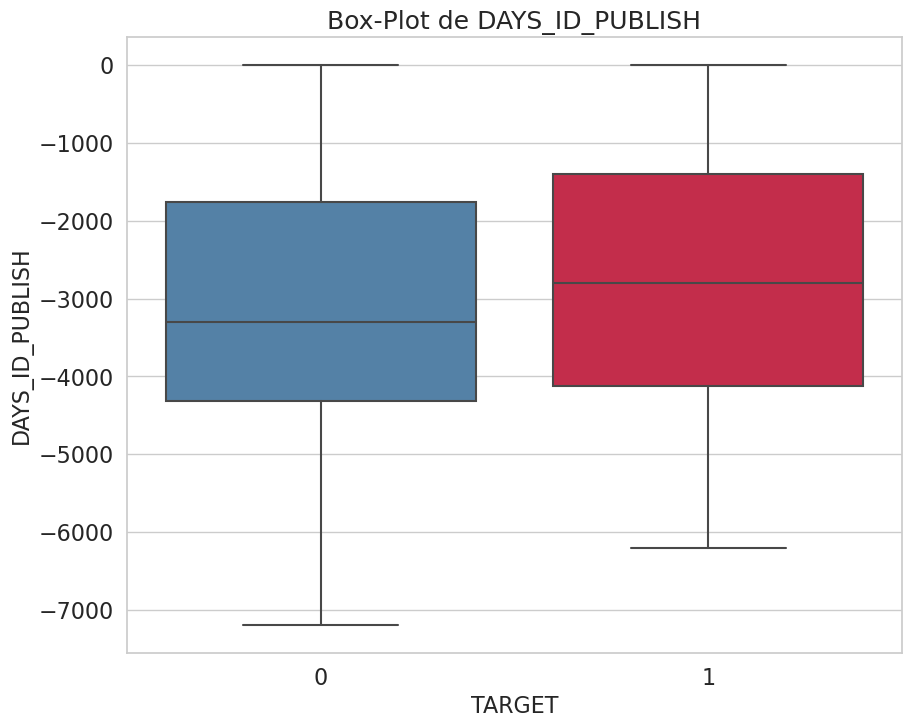

In [28]:
fctUtiles.plot_continuous_variables(application_train, 'DAYS_ID_PUBLISH', plots=['box'], figsize=(10, 8))

- **Observations et conclusions :**


Le graphique ci-dessus montre une tendance similaire à celle de DAYS_REGISTRATION, où le nombre de jours écoulés depuis le changement d'identité des défaillants est généralement inférieur. Les non défaillants affichent un nombre de jours plus élevé pour tous les quantiles depuis qu'ils ont changé leur document d'identité.

####   - Distribution de EXT_SOURCES


Voici trois colonnes **EXT_SOURCES**, qui contiennent des valeurs entre 0 et 1. Il s'agit de scores normalisés provenant de différentes sources

----------------------------------------------------------------------------------------------------


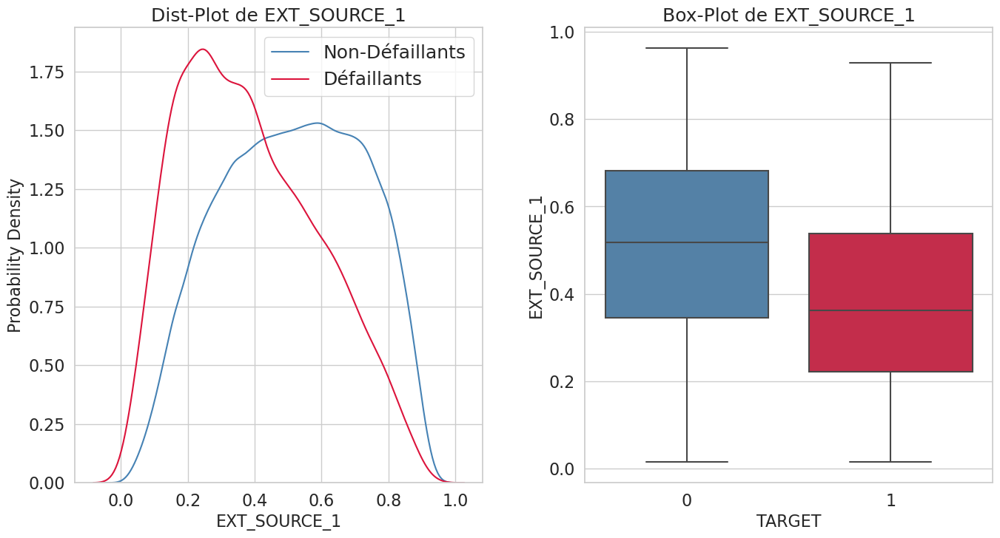

----------------------------------------------------------------------------------------------------


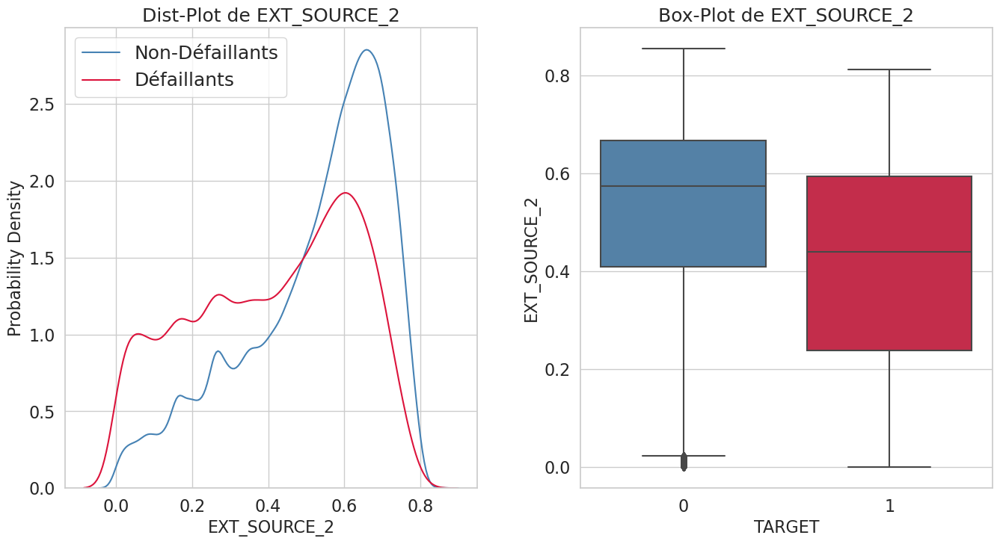

----------------------------------------------------------------------------------------------------


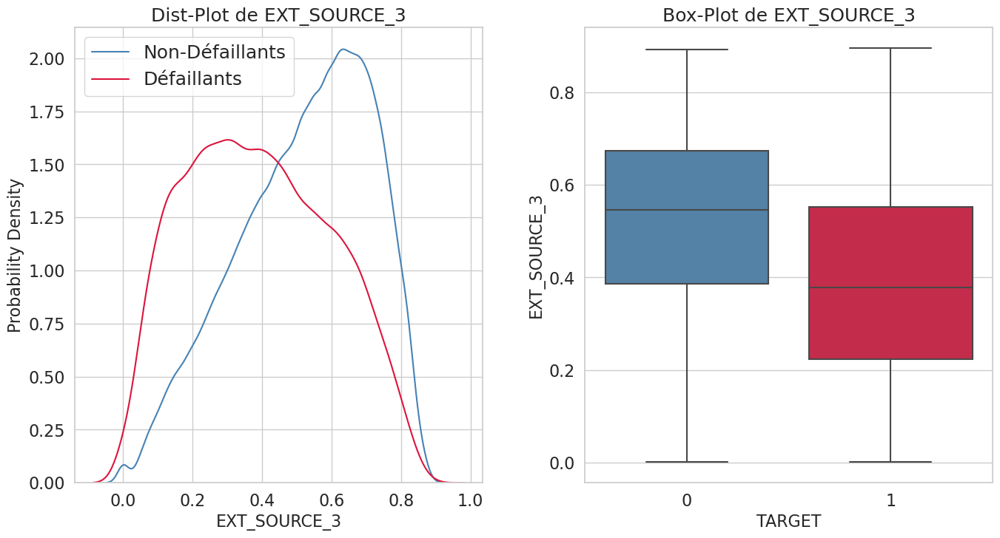

----------------------------------------------------------------------------------------------------


In [29]:
print('-'*100)
fctUtiles.plot_continuous_variables(application_train, 'EXT_SOURCE_1', plots=[
                          'distplot', 'box'], figsize=(16, 8))
print('-'*100)
fctUtiles.plot_continuous_variables(application_train, 'EXT_SOURCE_2', plots=[
                          'distplot', 'box'], figsize=(16, 8))
print('-'*100)
fctUtiles.plot_continuous_variables(application_train, 'EXT_SOURCE_3', plots=[
                          'distplot', 'box'], figsize=(16, 8))
print('-'*100)

- **Observations et conclusions :**

Les trois graphiques ci-dessus nous permettent de tirer les conclusions suivantes :

- Si nous examinons les graphiques en boîte, nous pouvons clairement voir une tendance similaire pour les trois colonnes EXT_SOURCE, c'est-à-dire que les valeurs par défaut ont tendance à être considérablement plus faibles.
- Cette tendance peut également être observée pour les PDF. Les non défaillants présentent un pic plus élevé pour les valeurs EXT_SOURCE élevées, et les densités de probabilité sont très faibles pour les valeurs faibles. Cela implique que les Non-défaillants ont généralement des valeurs élevées de ces scores.
- Il est intéressant de noter que la valeur médiane pour les défaillants est presque égale ou inférieure aux valeurs du 25e percentile des non défaillants.

- Les colonnes EXT_SOURCE_1 et EXT_SOURCE_3 tendent à montrer une meilleure discrimination/séparabilité par rapport à EXT_SOURCE_2. Ces 3 caractéristiques semblent être les meilleures pour séparer linéairement les défaillants et les non-défaillants parmi toutes les caractéristiques jusqu'à présent.

Text(0.5, 1.0, 'Correlation Heatmap')

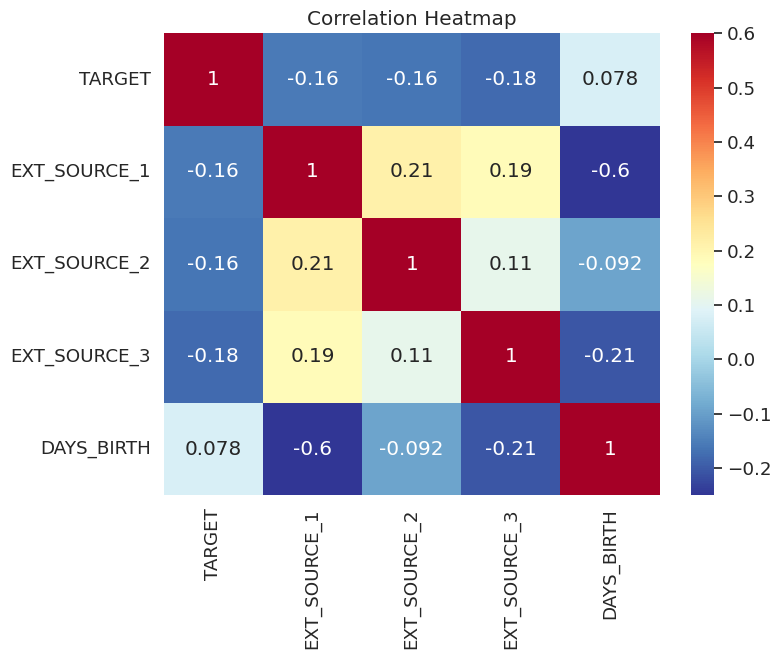

In [69]:
ext_data =application_train[['TARGET', 'EXT_SOURCE_1',
                              'EXT_SOURCE_2', 'EXT_SOURCE_3','DAYS_BIRTH']]
ext_data_corrs = ext_data.corr()

# afficher la matrice de corélation 

plt.figure(figsize=(8,6))
sns.heatmap(ext_data_corrs, cmap=plt.cm.RdYlBu_r,
            vmin=-0.25, annot=True, vmax=0.6)
plt.title('Correlation Heatmap')

Les trois caractéristiques EXT_SOURCE ont des corrélations négatives
avec la cible, ce qui indique que plus la valeur de l'EXT_SOURCE
augmente, plus le client est susceptible de rembourser le prêt.
Nous pouvons également voir que DAYS_BIRTH est positivement corrélé
avec EXT_SOURCE_1, ce qui indique que l'un des facteurs de ce score
est peut-être l'âge du client.

####   -  Distribution de FLOORSMAX_AVG et FLOORSMIN_MODE


Ces colonnes décrivent les scores normalisés de la moyenne du nombre maximum d'étages et du mode du nombre minimum d'étages dans le bâtiment du demandeur

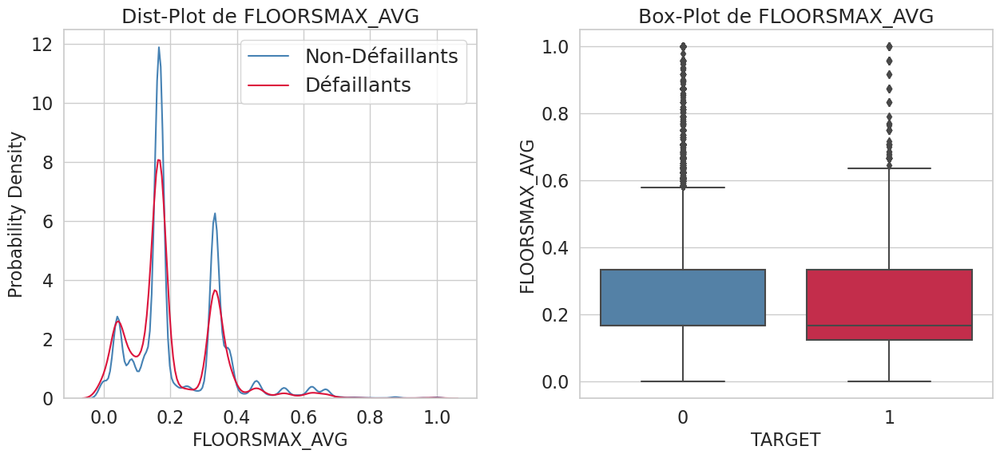

In [30]:
# Boxplot de FLOORSMAX_AVG
fctUtiles.plot_continuous_variables(application_train,'FLOORSMAX_AVG',plots=['distplot', 'box'],figsize=(15, 6))

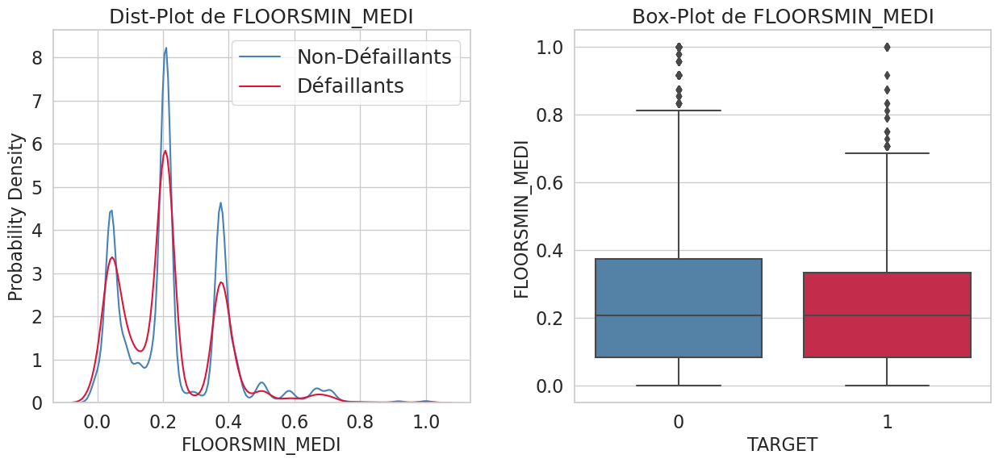

In [31]:
# Boxplot de FLOORSMIN_MEDI
fctUtiles.plot_continuous_variables(application_train,'FLOORSMIN_MEDI', plots=['distplot', 'box'], figsize=(15, 6))

- **Observations et conclusions :**

- Le boxplot montre que les défaillants ont une valeur médiane de la caractéristique FLOORSMAX_AVG inférieure à celle des non-défaillants.
- Les valeurs du 75e percentile des défaillants et des non-défaillants sont plus ou moins les mêmes, mais la valeur du 25e percentile des non-défaillants est presque supérieure à la médiane des défaillants.



Cette variable pourrait être une variable importante pour départager les défaillants des non-défaillants.

# 2 - bureau

Données concernant les crédits antérieurs du client auprès d'autres institutions financières. Chaque ligne concerne un crédit antérieur identifié par la variable **SK_ID_BUREAU**.

In [72]:
application_train = pd.read_csv('data/application_train.csv')
application_test = pd.read_csv('data/application_test.csv')
bureau = pd.read_csv('data/bureau.csv')

In [73]:
#Séparer les variables selon leurs types
df_object, df_int, df_float,df_bool = fctUtiles.get_types_objects(bureau)

In [74]:
df_float.describe()

,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,AMT_ANNUITY
count,1.610875e+06,1.082775e+06,5.919400e+05,1.716415e+06,1.458759e+06,1.124648e+06,1.716428e+06,4.896370e+05
mean,5.105174e+02,-1.017437e+03,3.825418e+03,3.549946e+05,1.370851e+05,6.229515e+03,3.791276e+01,1.571276e+04
std,4.994220e+03,7.140106e+02,2.060316e+05,1.149811e+06,6.774011e+05,4.503203e+04,5.937650e+03,3.258269e+05
min,-4.206000e+04,-4.202300e+04,0.000000e+00,0.000000e+00,-4.705600e+06,-5.864061e+05,0.000000e+00,0.000000e+00
25%,-1.138000e+03,-1.489000e+03,0.000000e+00,5.130000e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
50%,-3.300000e+02,-8.970000e+02,0.000000e+00,1.255185e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
75%,4.740000e+02,-4.250000e+02,0.000000e+00,3.150000e+05,4.015350e+04,0.000000e+00,0.000000e+00,1.350000e+04
max,3.119900e+04,0.000000e+00,1.159872e+08,5.850000e+08,1.701000e+08,4.705600e+06,3.756681e+06,1.184534e+08


In [75]:
df_int.describe()

,SK_ID_CURR,SK_ID_BUREAU,DAYS_CREDIT,CREDIT_DAY_OVERDUE,CNT_CREDIT_PROLONG,DAYS_CREDIT_UPDATE
count,1.716428e+06,1.716428e+06,1.716428e+06,1.716428e+06,1.716428e+06,1.716428e+06
mean,2.782149e+05,5.924434e+06,-1.142108e+03,8.181666e-01,6.410406e-03,-5.937483e+02
std,1.029386e+05,5.322657e+05,7.951649e+02,3.654443e+01,9.622391e-02,7.207473e+02
min,1.000010e+05,5.000000e+06,-2.922000e+03,0.000000e+00,0.000000e+00,-4.194700e+04
25%,1.888668e+05,5.463954e+06,-1.666000e+03,0.000000e+00,0.000000e+00,-9.080000e+02
50%,2.780550e+05,5.926304e+06,-9.870000e+02,0.000000e+00,0.000000e+00,-3.950000e+02
75%,3.674260e+05,6.385681e+06,-4.740000e+02,0.000000e+00,0.000000e+00,-3.300000e+01
max,4.562550e+05,6.843457e+06,0.000000e+00,2.792000e+03,9.000000e+00,3.720000e+02


In [76]:
df_object.describe()

,CREDIT_ACTIVE,CREDIT_CURRENCY,CREDIT_TYPE
count,1716428,1716428,1716428
unique,4,4,15
top,Closed,currency 1,Consumer credit
freq,1079273,1715020,1251615


In [ ]:
#Visualison des Nan dans une Heatmap
plt.figure(figsize=(20,10))
sns.heatmap(bureau.isna(), cbar=True)

<Axes: >

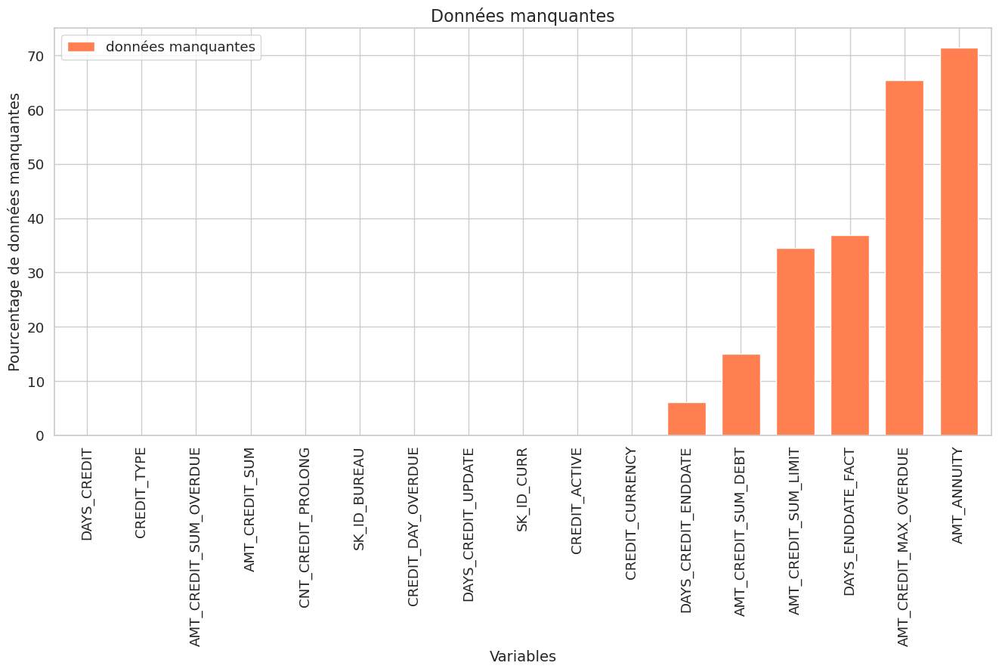

In [32]:
#Visualisation graphique
fctUtiles.visuliser_nan(bureau)

In [33]:
print('-'*100)
print(
    f'Number of unique SK_ID_BUREAU in bureau.csv are: {len(bureau.SK_ID_BUREAU.unique())}')
print(
    f'Number of unique SK_ID_CURR in bureau.csv are: {len(bureau.SK_ID_CURR.unique())}')
print(
    f'Number of overlapping SK_ID_CURR in application_train.csv and bureau.csv are: {len(set(application_train.SK_ID_CURR.unique()).intersection(set(bureau.SK_ID_CURR.unique())))}')
print(
    f'Number of overlapping SK_ID_CURR in application_test.csv and bureau.csv are: {len(set(application_test.SK_ID_CURR.unique()).intersection(set(bureau.SK_ID_CURR.unique())))}')
print('-'*100)

----------------------------------------------------------------------------------------------------
Number of unique SK_ID_BUREAU in bureau.csv are: 1716428
Number of unique SK_ID_CURR in bureau.csv are: 305811
Number of overlapping SK_ID_CURR in application_train.csv and bureau.csv are: 263491
Number of overlapping SK_ID_CURR in application_test.csv and bureau.csv are: 42320
----------------------------------------------------------------------------------------------------


- **Observations et conclusions:**

1. Sur 17 variables, 7 contiennent des valeurs de NaN.
2. Les valeurs de NaN les plus élevées sont observées dans la colonne AMT_ANNUITY qui comporte plus de 70 % de valeurs manquantes.
3. Le fichier bureau.csv contient près de 1,7 millions de points de données, avec 17 caractéristiques. Sur ces 17 caractéristiques, deux sont SK_ID_CURR et SK_ID_BUREAU.
 -  SK_ID_BUREAU est l'identifiant du prêt précédent du client auprès d'autres institutions financières. Il peut y avoir plusieurs prêts précédents correspondant à un seul SK_ID_CURR, qui dépend du profil d'emprunt du client.
 - SK_ID_CURR est l'identifiant du prêt actuel du client avec Home Credit.
  - Il y a 305k SK_ID_CURR unique en bureau dont :
   - Il y a 263k SK_ID_CURR au bureau qui sont présents dans application_train sur un total de 307k de SK_ID_CURR uniques d'application_train. Cela signifie que certains des demandeurs dans la demande de prêt actuelle avec le Home Credit Group n'ont pas d'antécédents de crédit avec le département du bureau de crédit.

- **Merging the TARGETS from application_train to bureau table**

In [34]:
print("-"*100)
print("Merging TARGET with bureau Table")
bureau_merged = application_train.iloc[:, :2].merge(
    bureau, on='SK_ID_CURR', how='left')
print("-"*100)
print( bureau_merged.shape)

----------------------------------------------------------------------------------------------------
Merging TARGET with bureau Table
----------------------------------------------------------------------------------------------------
(1509345, 18)


### Matrice Phi-K 

-------------------------------------------------------------------------------


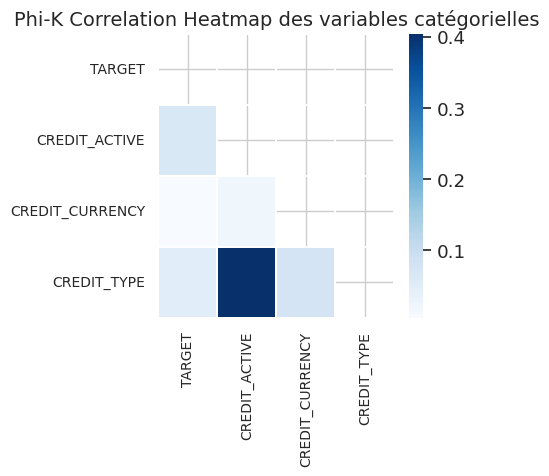

-------------------------------------------------------------------------------
Les catégories présentant les valeurs les plus élevées de la corrélation Phi-K avec la variable cible sont les suivantes :


Variable,Phik-Correlation
CREDIT_ACTIVE,0.064481
CREDIT_TYPE,0.049954
CREDIT_CURRENCY,0.004993


-------------------------------------------------------------------------------


In [35]:
cols_for_phik = ['TARGET', 'CREDIT_ACTIVE', 'CREDIT_CURRENCY', 'CREDIT_TYPE']
fctUtiles.plot_phik_matrix(bureau_merged, cols_for_phik,  figsize=(5, 5))

### Matrice de corrélation 

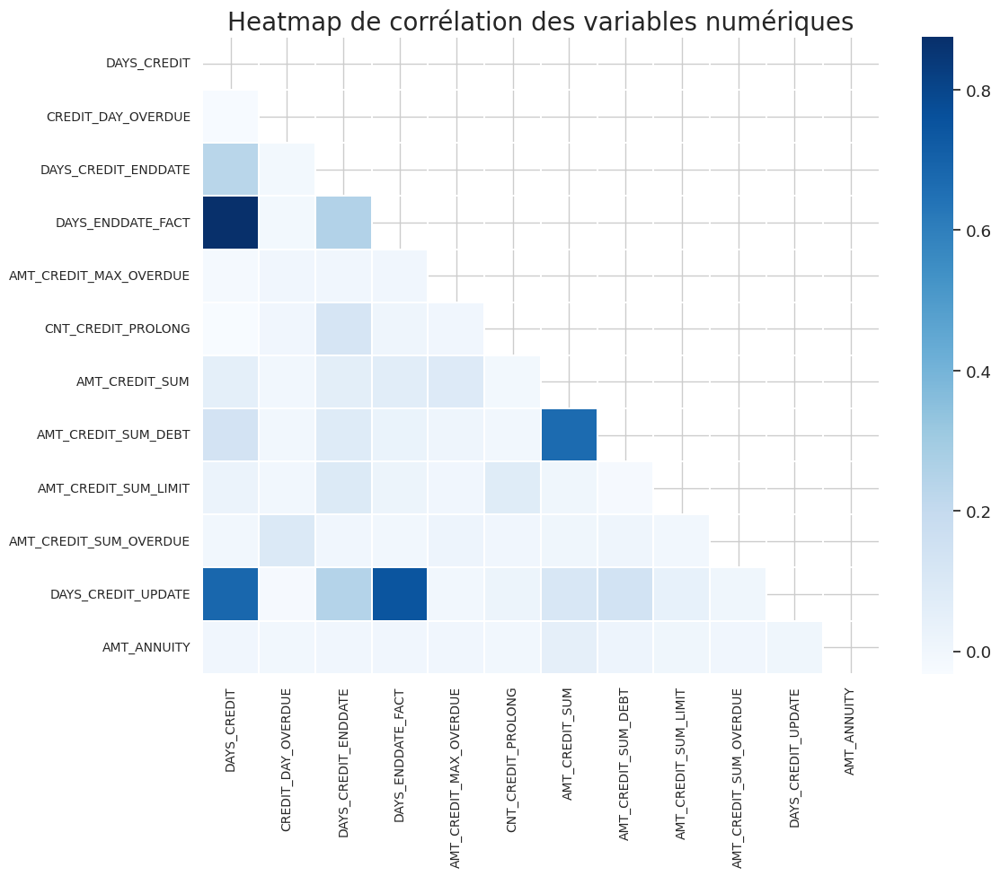

In [36]:
corr_mat = fctUtiles.correlation_matrix(bureau_merged, ['SK_ID_CURR', 'SK_ID_BUREAU'], cmap='Blues', figsize=(12, 10))
corr_mat.plot_correlation_matrix()

- **Observations et conclusions :**
1. La carte thermique ci-dessus montre les valeurs de la corrélation Phi-K entre les valeurs catégorielles.

- À partir du coefficient de corrélation Phi-K, nous voyons que la variable CREDIT_TYPE présente une certaine association avec la variable CREDIT_ACTIVE.
- Nous constatons que les variables catégorielles ne sont pas vraiment associées à la variable TARGET, en particulier la fonction CREDIT_CURRENCY.

2. On peut observer que la plupart des cartes thermiques ont des couleurs claires, ce qui montre peu ou pas de corrélation.
 - Cependant, nous pouvons voir quelques nuances sombres qui représentent une forte corrélation.
 - La corrélation élevée est particulièrement observée pour les caractéristiques :
     - DAYS_CREDIT et DAYS_CREDIT_UPDATE
     - DAYS_ENDDATE_FACT et DAYS_CREDIT_UPDATE
     - AMT_CREDIT_SUM et AMT_CREDIT_SUM_DEBT
     - DAYS_ENDDATE_FACT et DAYS_CREDIT
     
     
     
Nous pouvons également constater que les fonctions ne présentent pas particulièrement de corrélation bonne/élevée avec Target en tant que tel, à l'exception de la fonction DAYS_CREDIT. Cela signifie qu'il n'y a pas de relation linéaire directe entre Target et les variables.

- **Distribution de Categorical Variable CREDIT_ACTIVE**


Cette colonne décrit l'état du prêt précédent signalé par le bureau de crédit.

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'CREDIT_ACTIVE' sont :
['Closed' 'Active' nan 'Sold' 'Bad debt']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
Closed      917733
Active      541919
Sold          5653
Bad debt        20
Name: CREDIT_ACTIVE, dtype: int64
-------------------------------------------------------------------------------
Nombre de catégories uniques pour CREDIT_ACTIVE = 5


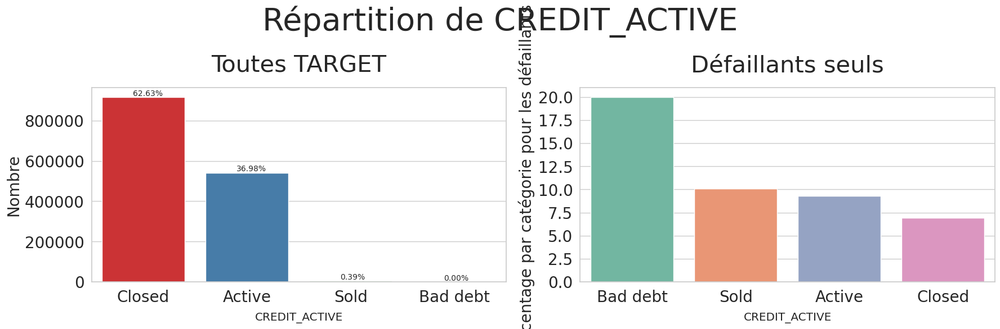

----------------------------------------------------------------------------------------------------


In [37]:
# let us first see the unique categories of 'CREDIT_ACTIVE'
fctUtiles.print_unique_categories(bureau_merged, 'CREDIT_ACTIVE', show_counts=True)

# plotting the Bar Plot for the Column
fctUtiles.plot_categorical_variables_bar(
    bureau_merged, column_name='CREDIT_ACTIVE', horizontal_adjust=0.3, fontsize_percent='x-small')
print('-'*100)

- **Observations et conclusions :**


Du graphique ci-dessus, nous pouvons tirer les conclusions suivantes :

- A partir du premier subplot, nous voyons qu'une majorité des prêts précédents d'autres institutions financières sont des prêts fermés (62,63%), suivis par 36,98% de prêts actifs. Les prêts vendus et les prêts pour créances douteuses sont très peu nombreux.
- Si l'on examine le pourcentage de défaillants par catégorie, on constate qu'environ 20 % des personnes de Bad-Debt ont fait défaut, ce qui est le taux de défaillance le plus élevé. Viennent ensuite les prêts vendus et les prêts actifs. Le taux de défaillance le plus faible concerne les prêts fermés, qui présentent un bon historique de clients. La tendance observée ici est donc tout à fait logique et attendue.

- **Distribution de Variable avec DAYS ( jour) Features**

**DAYS_CREDIT**

Cette colonne décrit le nombre de jours avant la demande actuelle lorsque le client a fait une demande de crédit auprès d'un bureau de crédit. Pour faciliter l'interprétation, nous allons convertir ces jours en années.

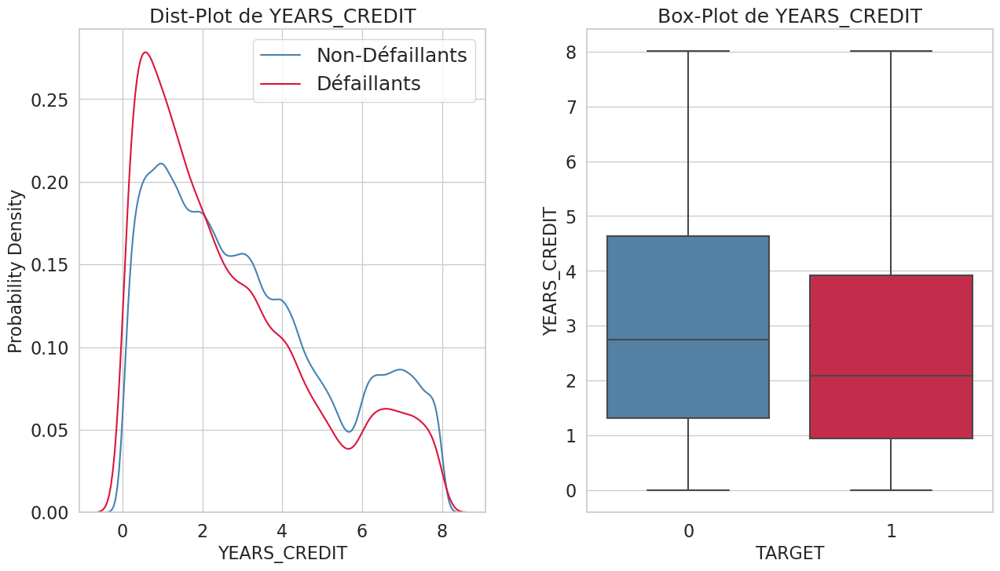

In [38]:
bureau_merged['YEARS_CREDIT'] = bureau_merged['DAYS_CREDIT'] / -365
fctUtiles.plot_continuous_variables(bureau_merged, 'YEARS_CREDIT', plots=[
                          'distplot', 'box'], figsize=(15, 8))
_ = bureau_merged.pop('YEARS_CREDIT')

- **Observations et conclusions :**


C'est ce que l'on constate à partir des tracés ci-dessus :

-  nous voyons que les défaillants ont tendance à avoir des pics plus élevés que les non défaillants lorsque le nombre d'années est inférieur.. Cela implique que les demandeurs qui ont demandé des prêts au Bureau de crédit récemment ont montré une tendance à la défaillance plus importante que ceux qui ont demandé un prêt il y a longtemps. Le PDF des défaillants est également un peu plus à gauche que celui des non défaillants.
- En examinant le graphique, on constate que les défaillants ont généralement moins d'ANNÉES_CRÉDIT que les non défaillants.

**DAYS_CREDIT_ENDDATE**


Cette rubrique renseigne sur la durée restante du crédit du Bureau de crédit au moment de la demande de prêt au Crédit immobilier.

-------------------------------------------------------------------------------
Pecentiles de la variable DAYS_CREDIT_ENDDATE
Pecentile 0 = -42060.0
Pecentile 2 = -2487.0
Pecentile 4 = -2334.0
Pecentile 6 = -2202.0
Pecentile 8 = -2073.9199999999983
Pecentile 10 = -1939.0
Pecentile 25 = -1144.0
Pecentile 50 = -334.0
Pecentile 75 = 473.0
Pecentile 100 = 31199.0
-------------------------------------------------------------------------------


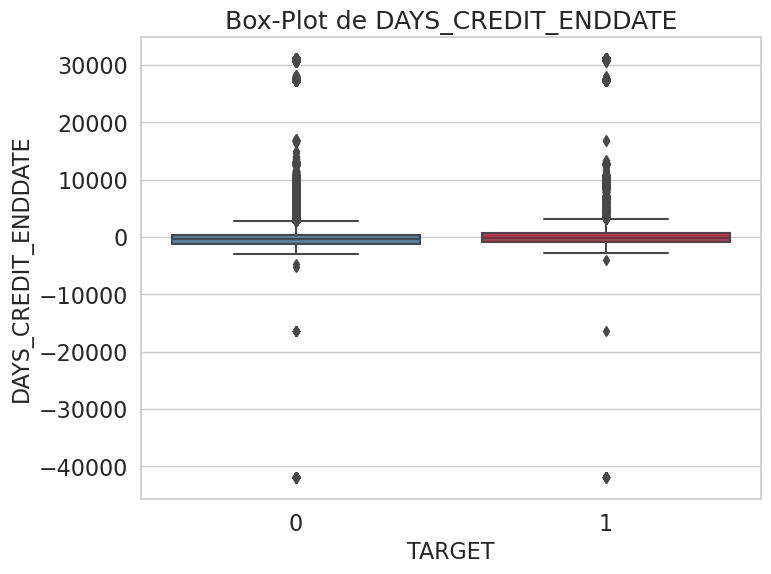

----------------------------------------------------------------------------------------------------


In [39]:
fctUtiles.print_percentiles(bureau_merged, 'DAYS_CREDIT_ENDDATE',
                  percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
fctUtiles.plot_continuous_variables(bureau_merged, 'DAYS_CREDIT_ENDDATE', plots=[
                          'box'], figsize=(8, 6))
print('-'*100)

- **Observations et conclusions :**


D'après les valeurs de percentile ci-dessus, et en regardant le box-plot, nous constatons qu'il semble y avoir une valeur erronée pour DAYS_CREDIT_ENDDATE, où la valeur du 0e percentile remonte à aussi longtemps que 42060 jours ou 115 ans. Cela n'a pas beaucoup de sens, car cela implique que le prêt précédent du client remonte à 115 ans. Il pourrait s'agir d'un prêt hérité également, mais nous ne pouvons pas faire de commentaires aussi sûrs à ce sujet. Nous essaierions de supprimer ces valeurs lors de la phase de prétraitement des données

**DAYS_ENDDATE_FACT**


Cette colonne indique le nombre de jours écoulés depuis la fin du crédit du Bureau de crédit au moment de la demande de prêt au Crédit immobilier. Ces valeurs ne concernent que les crédits fermés.

-------------------------------------------------------------------------------
Pecentiles de la variable DAYS_ENDDATE_FACT
Pecentile 0 = -42023.0
Pecentile 2 = -2561.0
Pecentile 4 = -2450.0
Pecentile 6 = -2351.0
Pecentile 8 = -2265.0
Pecentile 10 = -2173.0
Pecentile 25 = -1503.0
Pecentile 50 = -900.0
Pecentile 75 = -427.0
Pecentile 100 = 0.0
-------------------------------------------------------------------------------


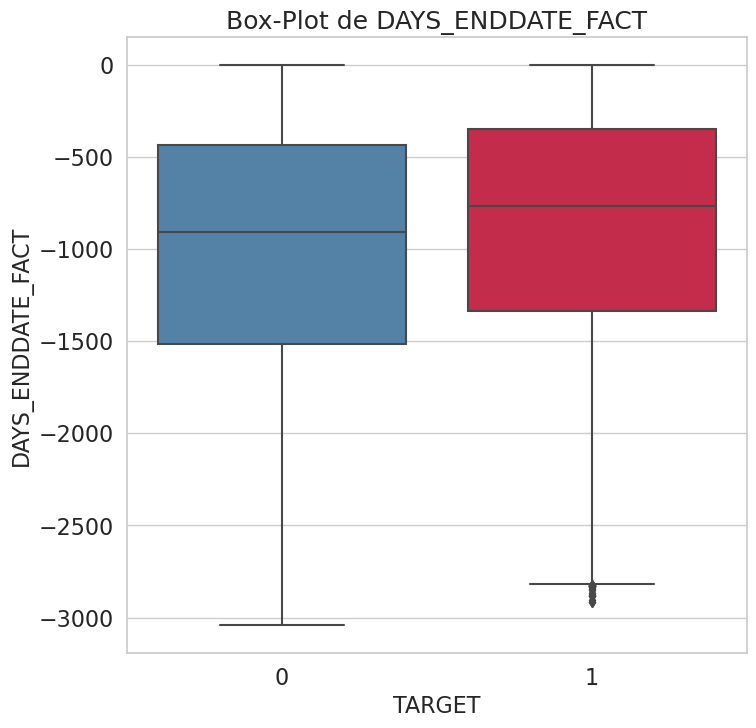

----------------------------------------------------------------------------------------------------


In [40]:
fctUtiles.print_percentiles(bureau_merged, 'DAYS_ENDDATE_FACT',
                  percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
fctUtiles.plot_continuous_variables(bureau_merged, 'DAYS_ENDDATE_FACT', plots=[
                          'box'], figsize=(8, 8), scale_limits=[-40000, 0])
print('-'*100)

- **Observations et conclusions :**




- Comme pour la colonne précédente, nous constatons que le 0ème percentile de cette colonne semble également erroné, qui est de 42023 jours ou ~115 ans. Il faudrait supprimer ces valeurs, car elles n'ont pas beaucoup de sens.
- En regardant le box-plot, on constate que les défaillants ont tendance à avoir moins de jours depuis la fin de leur crédit auprès du bureau de crédit. Les non défaillants ont généralement vu leurs crédits précédents se terminer plus longtemps avant que les défaillants.

**DAYS_CREDIT_UPDATE**


Cette colonne indique le nombre de jours écoulés depuis que les informations du bureau de crédit sont arrivées au moment de la demande de prêt au Crédit immobilier.

-------------------------------------------------------------------------------
Pecentiles de la variable DAYS_CREDIT_UPDATE
Pecentile 0 = -41947.0
Pecentile 2 = -2415.0
Pecentile 4 = -2213.0
Pecentile 6 = -2002.0
Pecentile 8 = -1766.0
Pecentile 10 = -1582.0
Pecentile 25 = -904.0
Pecentile 50 = -406.0
Pecentile 75 = -33.0
Pecentile 100 = 372.0
-------------------------------------------------------------------------------


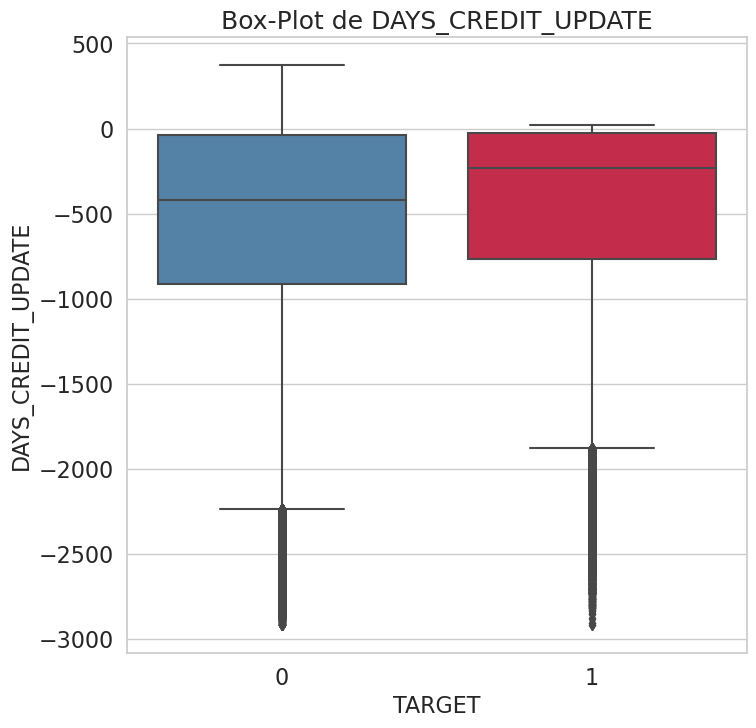

----------------------------------------------------------------------------------------------------


In [41]:
fctUtiles.print_percentiles(bureau_merged, 'DAYS_CREDIT_UPDATE',
                  percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
fctUtiles.plot_continuous_variables(bureau_merged, 'DAYS_CREDIT_UPDATE', plots=[
                          'box'], figsize=(8, 8), scale_limits=[-40000, 400])
print('-'*100)

**Observations et conclusions**:
- La tendance des valeurs erronées est à nouveau très similaire à la colonne des autres jours où cette valeur du 0e percentile semble être erronée. De plus, comme seule la valeur du 0e percentile est si étrange, et que le reste semble correct, cette valeur est définitivement erronée. Nous allons également supprimer cette valeur.
- D'après la représentation graphique, nous pouvons dire que les défaillants ont tendance à avoir un nombre de jours inférieur depuis la réception de leurs informations sur le crédit du bureau de crédit. Leurs valeurs médianes, au 75e centile, sont toutes inférieures à celles des non défaillants.

# 4 - bureau_balance

Données mensuelles sur les crédits antérieurs de bureau. Chaque ligne correspond à un mois d'un crédit antérieur et un crédit antérieur peut avoir plusieurs lignes de données mensuelles, une pour chaque mois de la durée du crédit. Le jeu bureau_balance comprend donc la variable SK_ID_BUREAU (clé secondaire) pour faire le lien avec le jeu de données bureau.

In [ ]:
bureau_balance = pd.read_csv('data/bureau_balance.csv')

In [ ]:
#Séparer les variables selon leurs types
df_object, df_int, df_float,df_bool = fctUtiles.get_types_objects(bureau_balance)

In [ ]:
df_int.describe()

In [ ]:
df_object.describe()

In [ ]:
print('-'*100)
print(
    f'Number of unique values for STATUS are: {len(bureau_balance.STATUS.unique())}')
print(f"Unique values of STATUS are:\n{bureau_balance.STATUS.unique()}")
print('-'*100)

- **Observations et conclusions**



- Le tableau bureau_balance contient environ 27,29M lignes, et 3 colonnes.
- Ce tableau contient le statut mensuel de chacun des prêts précédents pour un demandeur particulier déclarés par le département du bureau de crédit.
- Il y a 8 valeurs uniques pour le STATUT qui sont encodées. Chacune d'entre elles a une signification particulière. C signifie fermé, X signifie statut inconnu, 0 signifie pas de DPD, 1 signifie maximum fait pendant le mois entre 1-30, 2 signifie DPD 31-60,... 5 signifie DPD 120+ ou vendu ou amorti.
- Le solde du mois le plus ancien que nous avons est le statut de 96 mois en arrière, c'est-à-dire que le statut a été fourni jusqu'à 8 ans d'historique pour les prêts pour lesquels ils existent.
- Le tableau bureau_balance ne contient pas des valeurs manquantes

# 5 - credit_card_balance

Données mensuelles sur les précédentes cartes de crédit liées aux précédentes demandes de crédit. Chaque ligne correspond à un mois de solde de carte de crédit et est liée à une précédente demande de crédit, identifiée par la variable **SK_ID_PREV** (clé secondaire).

In [ ]:
del bureau_balance
gc.collect()

In [ ]:
credit_cb = pd.read_csv('data/credit_card_balance.csv')

In [ ]:
#Séparer les variables selon leurs types
df_object, df_int, df_float,df_bool = fctUtiles.get_types_objects(credit_cb)

In [ ]:
df_float.describe()

In [ ]:
df_int.describe()

In [ ]:
df_object.describe()

In [ ]:
#Visualison des Nan dans une Heatmap
plt.figure(figsize=(20,10))
sns.heatmap(credit_cb.isna(), cbar=True)

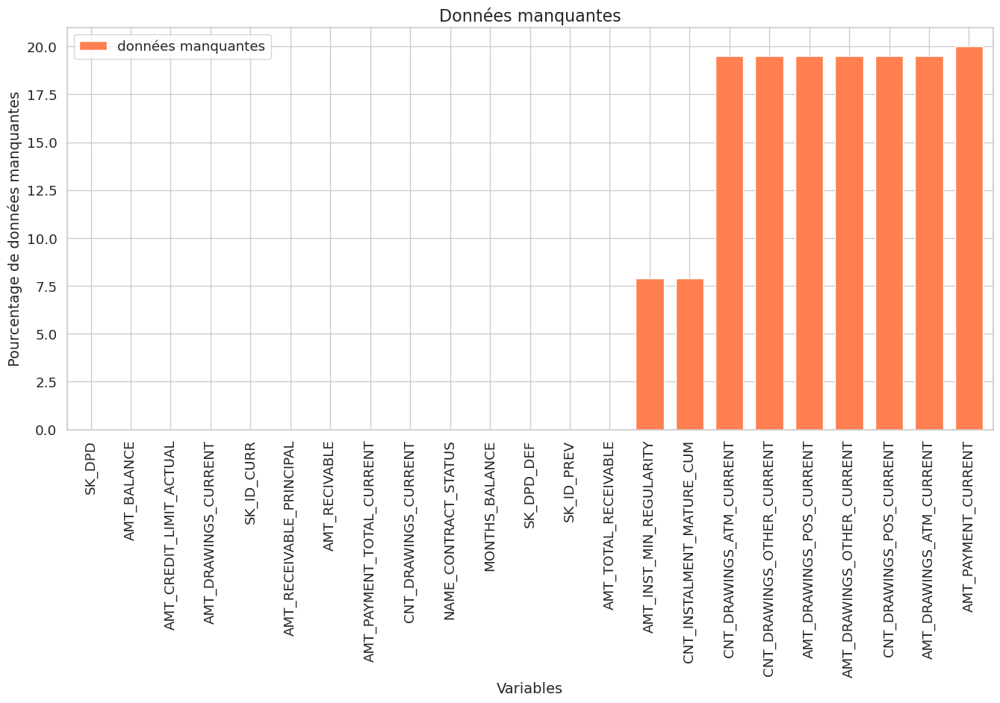

In [42]:
#Visualisation graphique
fctUtiles.visuliser_nan(credit_cb)

In [ ]:
application_train = pd.read_csv('data/application_train.csv')
application_test = pd.read_csv('data/application_test.csv')

In [ ]:
print('-'*100)
print(
    f'Number of unique SK_ID_PREV in credit_card_balance.csv are: {len(credit_cb.SK_ID_PREV.unique())}')
print(
    f'Number of unique SK_ID_CURR in credit_card_balance.csv are: {len(credit_cb.SK_ID_CURR.unique())}')
print('-'*100)
print(
    f'Number of overlapping SK_ID_CURR in application_train.csv and credit_card_balance.csv are: {len(set(application_train.SK_ID_CURR.unique()).intersection(set(credit_cb.SK_ID_CURR.unique())))}')
print(
    f'Number of overlapping SK_ID_CURR in application_test.csv and credit_card_balance.csv are: {len(set(application_test.SK_ID_CURR.unique()).intersection(set(credit_cb.SK_ID_CURR.unique())))}')
print('-'*100)

- **Observations et conclusions**


- Il y a environ 3,84M lignes dans le tableau credit_card_balance.csv, chacune d'entre elles correspondant au statut mensuel de la carte de crédit que le demandeur avait auprès de Home Credit Group. Ce tableau contient 23 caractéristiques qui contiennent les statistiques sur le statut mensuel de la carte de crédit, telles que le montant du solde, le montant des tirages, le nombre de tirages, le statut, etc. De ces 104,3k, il y a 103,5k SK_ID_CURR unique. Cela signifie que la plupart des demandeurs n'avaient qu'une seule carte de crédit sur eux, et que peu d'entre eux en avaient plus d'une. Ces SK_ID_CURR sont les identifiants des demandeurs qui ont actuellement demandé un prêt.
- Sur les 103k de SK_ID_CURR unique, 86,9k de ces candidats appartiennent à l'ensemble de formation, et 16,6k à l'ensemble d'application test.
- Sur les 307k de demandeurs dans le tableau application_train, seuls 86,9k d'entre eux avaient une carte de crédit auparavant auprès de Home Credit Group.
- Sur les 23 caractéristiques, 9 d'entre elles contiennent des valeurs de NaN.
- 7 de ces caractéristiques ont des valeurs proches de 20 % de NaN. Ces caractéristiques sont principalement liées aux montants des tirages et aux nombres de tirages. Deux autres de ces caractéristiques sont liées aux statistiques sur les versements.

**Merging the TARGETS from application_train to credit_card_balance table**

In [44]:
print("-"*100)
print("Merging TARGET with credit_card_balance Table")
credit_card_balance_merged = application_train.iloc[:, :2].merge(
    credit_cb, on='SK_ID_CURR', how='left')
print("-"*100)

----------------------------------------------------------------------------------------------------
Merging TARGET with credit_card_balance Table
----------------------------------------------------------------------------------------------------


### Matrice de corrélation

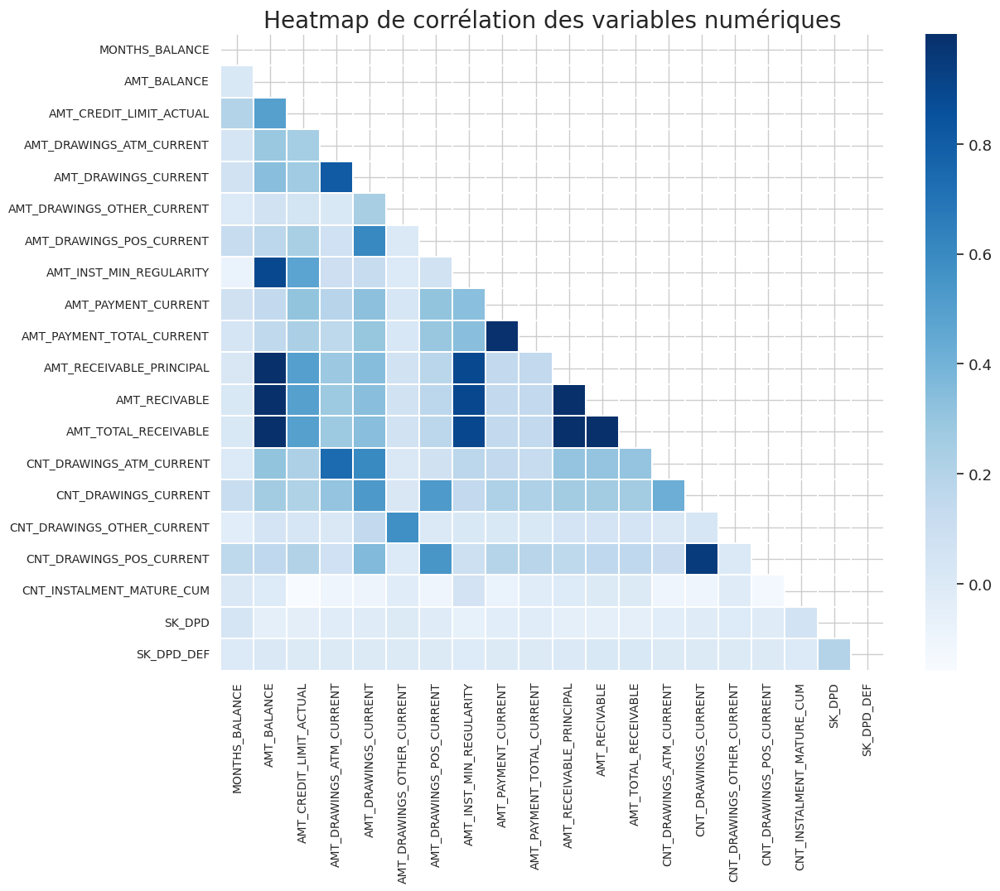

In [45]:
corr_mat = fctUtiles.correlation_matrix(
    credit_card_balance_merged, ['SK_ID_CURR', 'SK_ID_PREV'], figsize=(13, 11))
corr_mat.plot_correlation_matrix()

- **Observations et conclusions :**
1. La carte de chaleur ci-dessus montre visuellement la corrélation entre les caractéristiques du tableau "solde de la carte de crédit".
2. De la carte thermique de la matrice de corrélation, nous voyons quelques couples de caractéristiques fortement corrélées. Ce sont :
    - AMT_RECEIVABLE_PRINCIPE, AMT_RECIVABLE, AMT_TOTAL_RECEIVABLE et AMT_BALANCE
    - Nous observons également une forte corrélation entre ces 3 colonnes AMT_RECEIVABLE
    - AMT_PAYMENT_TOTAL_CURRENT et AMT_PAYMENT_CURRENT
3. Les ensembles de 2ème et 3ème éléments corrélés sont compréhensibles car ils correspondent plus ou moins au même récit.
4. La corrélation des caractéristiques avec la variable Target n'est pas perceptible, ce qui montre l'absence de relation linéaire entre la caractéristique et la variable Target.

### Distribution des Variables 

Tout d'abord, nous allons regrouper par le champ **"SK_ID_PREV"** et agréger avec la moyenne, de façon à obtenir une ligne moyenne pour chacun des prêts précédents que le client a obtenus.

In [46]:
cc_balance_merged =credit_card_balance_merged.groupby('SK_ID_PREV').mean()

- **Distribution de l'AMT_BALANCE**

Cette colonne indiquait le montant moyen du solde qu'une personne avait habituellement sur son compte de prêt de carte de crédit pour un prêt précédent

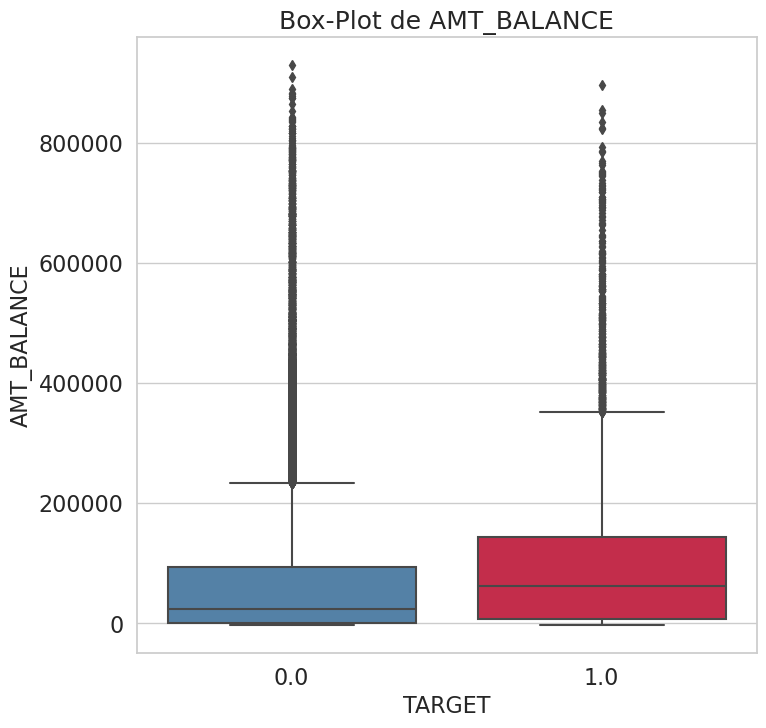

In [47]:
fctUtiles.plot_continuous_variables(cc_balance_merged, 'AMT_BALANCE', plots=['box'], figsize=(8, 8))

- **Observations et conclusions**
1. Sur le graphique ci-dessus, on peut voir que les défaillants ont une valeur de AMT_BALANCE plus élevée que les non défaillants. Ils affichent des valeurs plus élevées pour tous les quantiles et même pour les moustaches. Cela pourrait signifier que le montant du crédit pour les défaillants pourrait également être relativement plus élevé par rapport aux non défaillants.


2. Nous constatons que les défaillants semblent ici aussi avoir un versement minimum plus élevé chaque mois par rapport aux non défaillants. Cela renseigne généralement sur les habitudes de dépense et d'emprunt des personnes. Les défaillants ont des habitudes de dépenses et d'emprunt plus élevées que les non défaillants.

- **Distribution de l' Distribution des AMT_TOTAL_RECEIVABLE** 


Cette colonne décrit la moyenne du montant total à recevoir sur le crédit précédent.

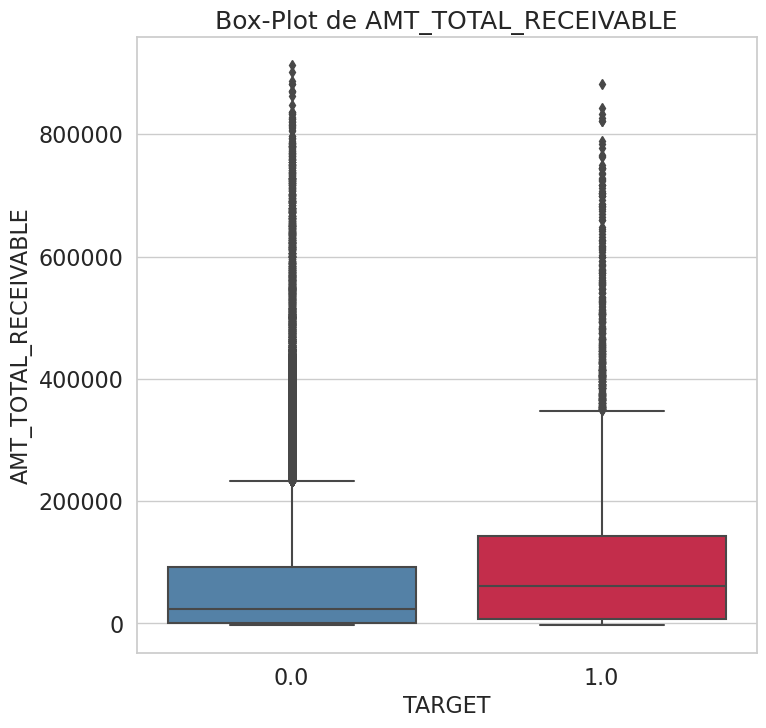

In [48]:
fctUtiles.plot_continuous_variables(cc_balance_merged, 'AMT_TOTAL_RECEIVABLE', plots=['box'], figsize=(8, 8))

- **Observations et conclusions**


Si l'on examine le box plot de AMT_TOTAL_RECEIVABLE, on constate un comportement similaire à celui observé avec d'autres montants, à savoir que les défaillants avaient généralement un montant à recevoir plus élevé sur leur crédit précédent, ce qui peut impliquer les montants de crédits plus élevés qu'ils ont pu prendre. Le PDF montre également un pic très élevé à des montants plus faibles pour les non défaillants par rapport aux défaillants.

- **Distribution des CNT_INSTALMENT_MATURE_CUM en continu**


La colonne décrit à peu près le nombre moyen de versements effectués sur les crédits précédents

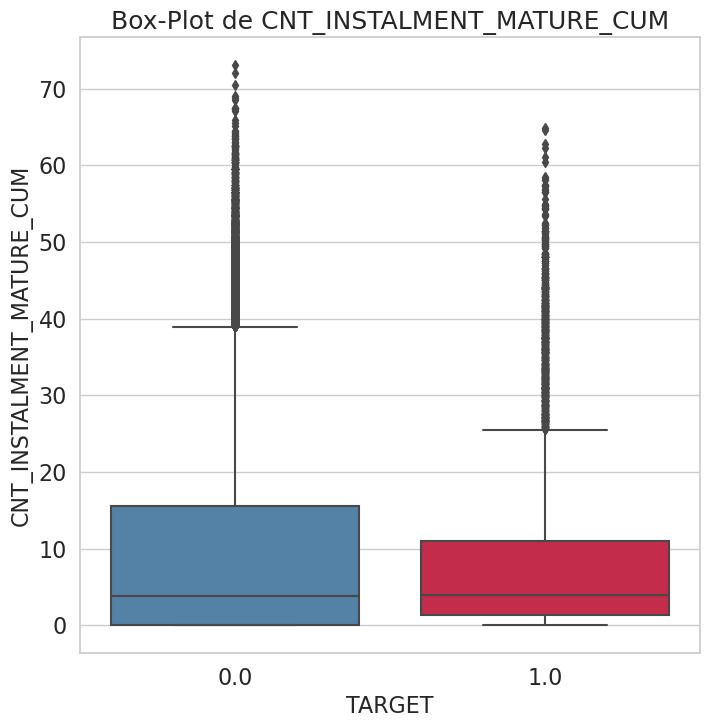

In [49]:
fctUtiles.plot_continuous_variables(cc_balance_merged, 'CNT_INSTALMENT_MATURE_CUM', plots=['box'], figsize=(8, 8))

- **Observations et conclusions**


Du graphique ci-dessus, nous voyons un comportement très intéressant. Ce graphique montre que les non défaillants ont généralement une fourchette de valeurs plus élevée pour le nombre de versements payés que les défaillants. Cela pourrait indiquer le comportement des défaillants, qui, en règle générale, paient moins de versements sur leur crédit précédent.

# 6 - installments_payments

Historique des paiements pour les précédentes demandes de crédit. Les lignes contiennent les informations relatives aux paiements effectués et aux paiements manqués.

In [ ]:
del credit_cb, cc_balance_merged , credit_card_balance_merged
gc.collect()

In [ ]:
ins_payments = pd.read_csv('data/installments_payments.csv')

In [ ]:
#Séparer les variables selon leurs types
df_object, df_int, df_float,df_bool = fctUtiles.get_types_objects(ins_payments)

In [ ]:
df_float.describe()

In [ ]:
df_int.describe()

In [ ]:
application_train = pd.read_csv('data/application_train.csv')
application_test = pd.read_csv('data/application_test.csv')

In [ ]:
print('-'*100)
print(
    f'Number of unique SK_ID_PREV in installments_payments.csv are: {len(ins_payments.SK_ID_PREV.unique())}')
print(
    f'Number of unique SK_ID_CURR in installments_payments.csv are: {len(ins_payments.SK_ID_CURR.unique())}')
print('-'*100)
print(
    f'Number of overlapping SK_ID_CURR in application_train.csv and installments_payments.csv are: {len(set(application_train.SK_ID_CURR.unique()).intersection(set(ins_payments.SK_ID_CURR.unique())))}')
print(
    f'Number of overlapping SK_ID_CURR in application_test.csv and installments_payments.csv are: {len(set(application_test.SK_ID_CURR.unique()).intersection(set(ins_payments.SK_ID_CURR.unique())))}')
print('-'*100)

- **Observations et conclusions**
1. Il y a environ 13,6 millions de points de données dans le tableau installments_payments.csv. Chaque ligne représente l'historique de chaque versement lié à un prêt particulier que le client avait précédemment contracté auprès de Home Credit Group.
2. Il y a 997k de prêts antérieurs uniques dans les versements. Ils appartiennent à 339 000 SK_ID_CURR uniques, qui sont les identifiants des demandeurs du prêt actuel.
3. De ces 339k SK_ID_CURR, 291k appartiennent à l'ensemble de données de formation, et 47,9k à l'ensemble de données de test. Cela signifie que presque sur les 307k SK_ID_CURR uniques dans application_train, 291k avaient auparavant une forme de prêt avec Home Credit. De même, sur les 48,7 k de l'ensemble de données de test, 47,9 k avaient déjà bénéficié d'un prêt avec le Crédit immobilier.
4. Le tableau comporte 8 caractéristiques uniques, dont 6 décrivent les statistiques de chaque versement pour le prêt précédent.
5. Il n'y a que 2 colonnes qui contiennent les valeurs NaN des 8 colonnes de installments_payments.
6. Ces colonnes contiennent également une proportion très minime de valeurs de NaN, à savoir seulement 0,02%, ce qui n'est pas très préoccupant.

- **Merging the TARGETS from application_train to installments_payments table**

In [50]:
#Merging the TARGETS from application_train to installments_payments table

print("-"*100)
print("Merging TARGET with installments_payments Table")
installments_merged = application_train.iloc[:, :2].merge(
    ins_payments, on='SK_ID_CURR', how='left')
print("-"*100)

----------------------------------------------------------------------------------------------------
Merging TARGET with installments_payments Table
----------------------------------------------------------------------------------------------------


### Matrice de corrélation

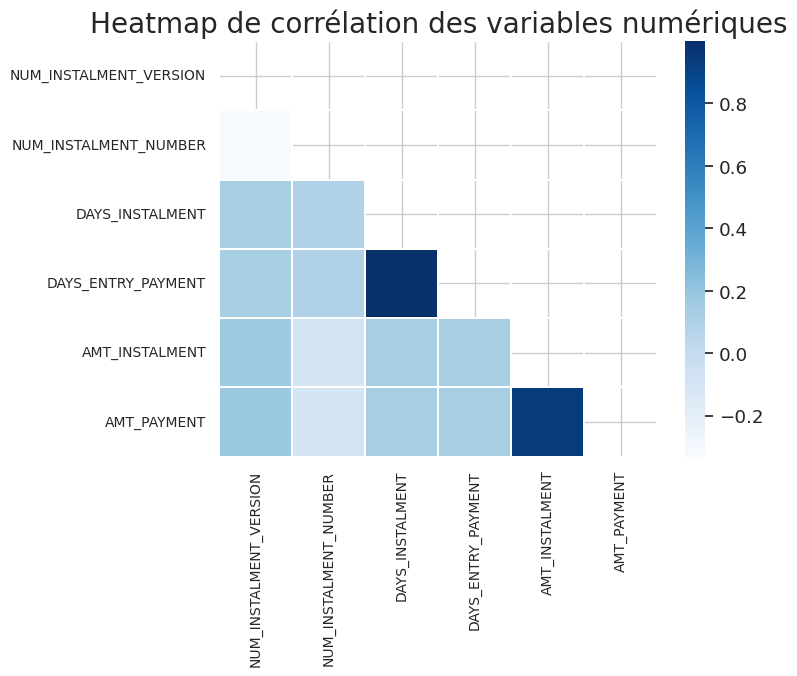

In [51]:
corr_mat = fctUtiles.correlation_matrix(installments_merged, ['SK_ID_CURR', 'SK_ID_PREV'], figsize=(8, 7))
corr_mat.plot_correlation_matrix()

- **Observations et conclusions :**


 De la carte thermique de la matrice de corrélation, nous voyons quelques caractéristiques fortement corrélées. Ce sont :
 
     -  AMT_INSTALMENT and AMT_PAYMENT
     -  DAYS_INSTALMENT and DAYS_ENTRY_PAYMENT
1. Ces deux ensembles de caractéristiques corrélées sont compréhensibles, car il s'agit en fait des caractéristiques relatives à la date à laquelle le versement devait être effectué par rapport à la date à laquelle il a été effectué, ainsi que du montant dû par rapport au montant payé.
2. Ces caractéristiques seront utiles pour créer de nouveaux ensembles de caractéristiques totalement non corrélées.
3. La corrélation des caractéristiques avec la variable Target n'est pas perceptible, ce qui montre l'absence de relation linéaire entre la caractéristique et la variable Target.

### Distribution des Variables 

Tout d'abord, nous allons regrouper par le champ **"SK_ID_PREV"** et agréger avec la moyenne, de façon à obtenir une ligne moyenne pour chacun des prêts précédents que le client a obtenus.

In [52]:
installments_merged = installments_merged.groupby('SK_ID_PREV').mean()

- **Distribution of Continuous Vairable DAYS_INSTALMENT**


Cette colonne indique les jours où le versement du crédit précédent devait être payé.

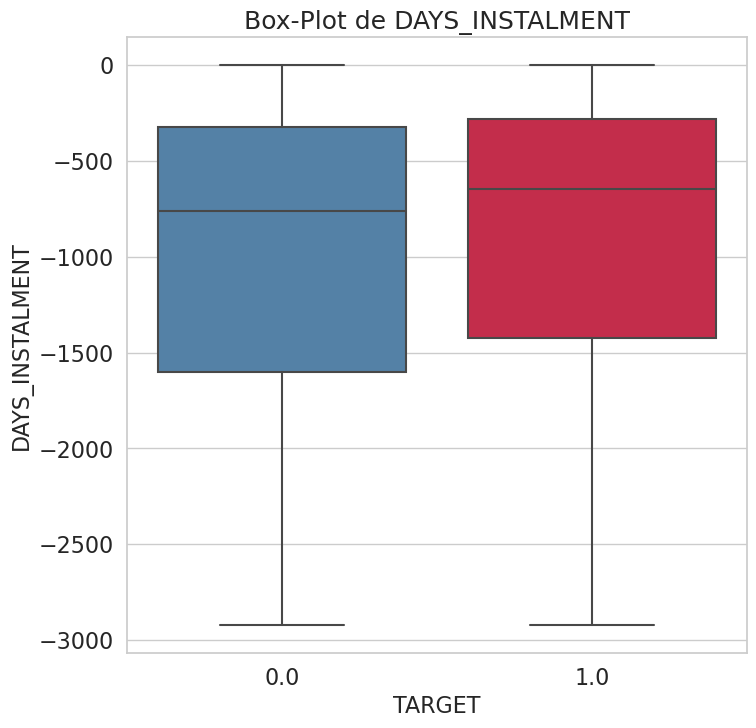

In [53]:
fctUtiles.plot_continuous_variables(installments_merged, 'DAYS_INSTALMENT', plots=['box'], figsize=(8, 8))

- **Distribution of Continuous Vairable DAYS_ENTRY_PAYMENT**


Cette colonne indique les jours où le versement du crédit précédent a été effectivement payé.

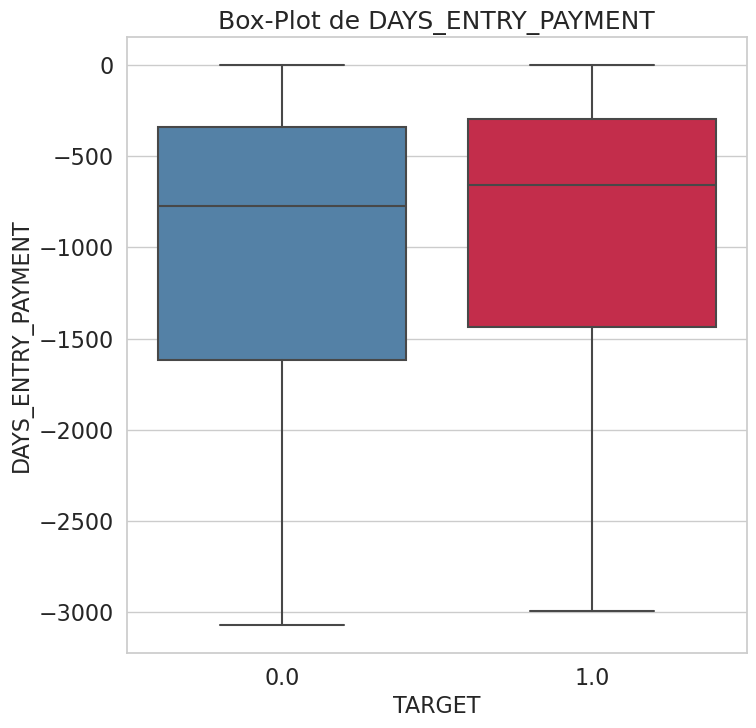

In [54]:
fctUtiles.plot_continuous_variables(installments_merged, 'DAYS_ENTRY_PAYMENT', plots=['box'], figsize=(8, 8))

- **Observations et conclusions**


Les deux graphiques ci-dessus montrent une tendance similaire, à savoir que les défaillants ont tendance à avoir moins de jours depuis leur dernier paiement, tandis que les non défaillants ont plus de jours depuis leur dernier paiement. Tous les quantiles des défaillants ont plus de jours récents que ceux des non défaillants. Ainsi, les non défaillants ont généralement plus d'écart dans leurs paiements depuis le jour de la demande que les défaillants.

# 7 - POS_CASH_balance

Données mensuelles de prêts en espèces relatives aux précédentes demandes de crédits. Chaque ligne correspond à une précédente demande de crédit, identifiée par la variable **SK_ID_PREV** (clé secondaire).

In [ ]:
del installments_merged, ins_payments
gc.collect()

In [ ]:
pos_cash_balance = pd.read_csv('data/POS_CASH_balance.csv')

In [ ]:
#Séparer les variables selon leurs types
df_object, df_int, df_float,df_bool = fctUtiles.get_types_objects(pos_cash_balance)

In [ ]:
df_float.describe()

In [ ]:
df_int.describe()

In [ ]:
df_object.describe()

In [10]:
print('-'*100)
print(
    f'Number of unique SK_ID_PREV in POS_CASH_balance.csv are: {len(pos_cash_balance.SK_ID_PREV.unique())}')
print(
    f'Number of unique SK_ID_CURR in POS_CASH_balance.csv are: {len(pos_cash_balance.SK_ID_CURR.unique())}')
print('-'*100)
print(
    f'Number of overlapping SK_ID_CURR in application_train.csv and POS_CASH_balance.csv are: {len(set(application_train.SK_ID_CURR.unique()).intersection(set(pos_cash_balance.SK_ID_CURR.unique())))}')
print(
    f'Number of overlapping SK_ID_CURR in application_test.csv and POS_CASH_balance.csv are: {len(set(application_test.SK_ID_CURR.unique()).intersection(set(pos_cash_balance.SK_ID_CURR.unique())))}')
print('-'*100)

----------------------------------------------------------------------------------------------------
Number of unique SK_ID_PREV in POS_CASH_balance.csv are: 936325
Number of unique SK_ID_CURR in POS_CASH_balance.csv are: 337252
----------------------------------------------------------------------------------------------------
Number of overlapping SK_ID_CURR in application_train.csv and POS_CASH_balance.csv are: 289444
Number of overlapping SK_ID_CURR in application_test.csv and POS_CASH_balance.csv are: 47808
----------------------------------------------------------------------------------------------------


- **Observations et conclusions**
1. Ce tableau contient environ 10M points de données, où chaque ligne correspond à l'instantané mensuel de l'état du précédent point de vente et du prêt en espèces que le client a eu avec Home Credit Group. Il se compose de 8 colonnes, dont deux sont SK_ID_CURR et SK_ID_PREV.
2. Il y a 936k d'identifiants uniques de prêts précédents dans le tableau, qui correspondent à 337k de demandeurs actuels uniques (SK_ID_CURR).
3. De ces 337k SK_ID_CURR, 289k appartiennent à l'ensemble de formation et 47,8k à l'ensemble de test.
4. Il n'y a que 2 colonnes qui contiennent les valeurs NaN des 8 colonnes de POS_CASH_balance. Ces colonnes sont le décompte des versements restants et la durée du prêt.
5. Ces colonnes contiennent également une proportion très minime de valeurs de NaN, à savoir seulement 0,26%%, ce qui n'est pas non plus très préoccupant.

- **Merging the TARGETS from application_train to POS_CASH_balance tables**

In [11]:
#Merging the TARGETS from application_train to POS_CASH_balance tables
print("-"*100)
print("Merging TARGET with POS_CASH_balance Table")
pos_cash_merged = application_train.iloc[:, :2].merge(
    pos_cash_balance, on='SK_ID_CURR', how='left')
print("-"*100)

----------------------------------------------------------------------------------------------------
Merging TARGET with POS_CASH_balance Table
----------------------------------------------------------------------------------------------------


### Matrice de corrélation 

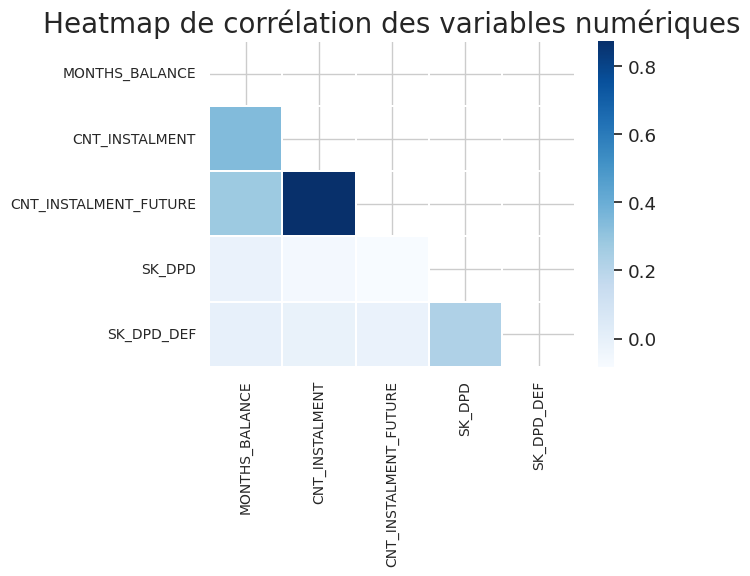

In [56]:
corr_mat = fctUtiles.correlation_matrix(
    pos_cash_merged, ['SK_ID_CURR', 'SK_ID_PREV'], figsize=(7, 6))
corr_mat.plot_correlation_matrix()

### Distribution des Variables 

Tout d'abord, nous allons regrouper par le champ **"SK_ID_PREV"** et agréger avec la moyenne, de façon à obtenir une ligne moyenne pour chacun des prêts précédents que le client a obtenus.

In [57]:
pos_cash_merged = pos_cash_merged.groupby('SK_ID_PREV').mean()

- **Distribution de CNT_INSTALMENT_FUTUR en continu**


Cette colonne décrit le nombre de versements qu'il reste à payer sur le crédit précédent.

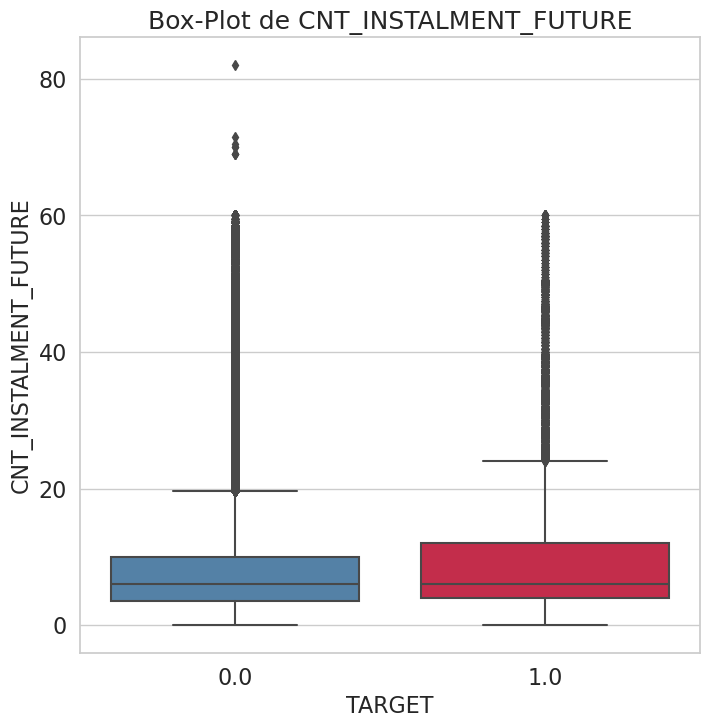

In [58]:
fctUtiles.plot_continuous_variables(pos_cash_merged, 'CNT_INSTALMENT_FUTURE', plots=['box'], figsize=(8, 8))

- **Observations et conclusions**



Si l'on examine le graphique ci-dessus pour CNT_INSTALMENT_FUTURE, on constate que les valeurs du percentile > 50 % pour les défaillants sont généralement plus élevées que celles des non défaillants. Même la limite supérieure de la moustache pour les défaillants est plus élevée que celle des non défaillants. Cela suggère que les défaillants ont tendance à avoir un plus grand nombre de versements restant sur leurs crédits précédents que les non défaillants.

# 8 - previous_application

Précédentes demandes de crédit. Chaque ligne concerne une précédente demande de crédit identifiée par la variable **SK_ID_PREV** (clé primaire). Chaque crédit en cours (application_train) peut être lié à plusieurs crédits précédents. Le jeu previous_application comprend donc la variable **SK_ID_CURR** (clé secondaire) pour faire le lien avec le jeu de données application_train.

In [ ]:
del pos_cash_merged, pos_cash_balance
gc.collect()

In [ ]:
application_train = pd.read_csv('data/application_train.csv')
application_test = pd.read_csv('data/application_test.csv')

In [ ]:
previous = pd.read_csv('data/previous_application.csv')

In [ ]:
#Séparer les variables selon leurs types
df_object, df_int, df_float,df_bool = fctUtiles.get_types_objects(previous)

In [ ]:
df_float.describe()

In [ ]:
df_int.describe()

In [ ]:
df_object.describe()

In [ ]:
#Visualison des Nan dans une Heatmap
plt.figure(figsize=(20,10))
sns.heatmap(previous.isna(), cbar=True)

In [ ]:
#Visualisation graphique
visuliser_nan(previous)

In [12]:
print('-'*100)
print(
    f'Number of unique SK_ID_PREV in previous_application.csv are: {len(previous.SK_ID_PREV.unique())}')
print(
    f'Number of unique SK_ID_CURR in previous_application.csv are: {len(previous.SK_ID_CURR.unique())}')
print('-'*100)
print(
    f'Number of overlapping SK_ID_CURR in application_train.csv and previous_application.csv are: {len(set(application_train.SK_ID_CURR.unique()).intersection(set(previous.SK_ID_CURR.unique())))}')
print(
    f'Number of overlapping SK_ID_CURR in application_test.csv and previous_application.csv are: {len(set(application_test.SK_ID_CURR.unique()).intersection(set(previous.SK_ID_CURR.unique())))}')
print('-'*100)

----------------------------------------------------------------------------------------------------
Number of unique SK_ID_PREV in previous_application.csv are: 1670214
Number of unique SK_ID_CURR in previous_application.csv are: 338857
----------------------------------------------------------------------------------------------------
Number of overlapping SK_ID_CURR in application_train.csv and previous_application.csv are: 291057
Number of overlapping SK_ID_CURR in application_test.csv and previous_application.csv are: 47800
----------------------------------------------------------------------------------------------------


- **Observations et conclusions :**
1. La table previous_application.csv est composé de 1,67M lignes au total. Chaque ligne correspond à chacun des prêts précédents que le client a contractés précédemment auprès de Home Credit Group. Il est possible pour un seul client de la demande actuelle d'avoir plusieurs prêts antérieurs avec Home Credit Group.
2. Il y a 37 colonnes dans previous_application.csv, qui contiennent les détails sur le prêt précédent.
3. Il y a 338k de SK_ID_CURR uniques dans la demande_précédente, dont 291k correspondent aux SK_ID_CURR du train d'application et 47,8k correspondent aux SK_ID_CURR de l'application_test.
4. Il y a 16 colonnes sur les 37 colonnes qui contiennent des valeurs de NaN.
5. Deux de ces colonnes ont 99,64% de valeurs manquantes, ce qui est très élevé, et nous devrons trouver un moyen intelligent de gérer des valeurs de NaN aussi élevées. Nous ne pouvons pas directement écarter une quelconque caractéristique à ce stade.

- **Merging the TARGETS from application_train to previous_application table**

In [13]:
# Merging the TARGETS from application_train to previous_application table
print("-"*100)
print("Merging TARGET with previous_application Table")
prev_merged = application_train.iloc[:, :2].merge(
    previous, on='SK_ID_CURR', how='left')
print("-"*100)

----------------------------------------------------------------------------------------------------
Merging TARGET with previous_application Table
----------------------------------------------------------------------------------------------------


### Matrice de corrélation 

-------------------------------------------------------------------------------


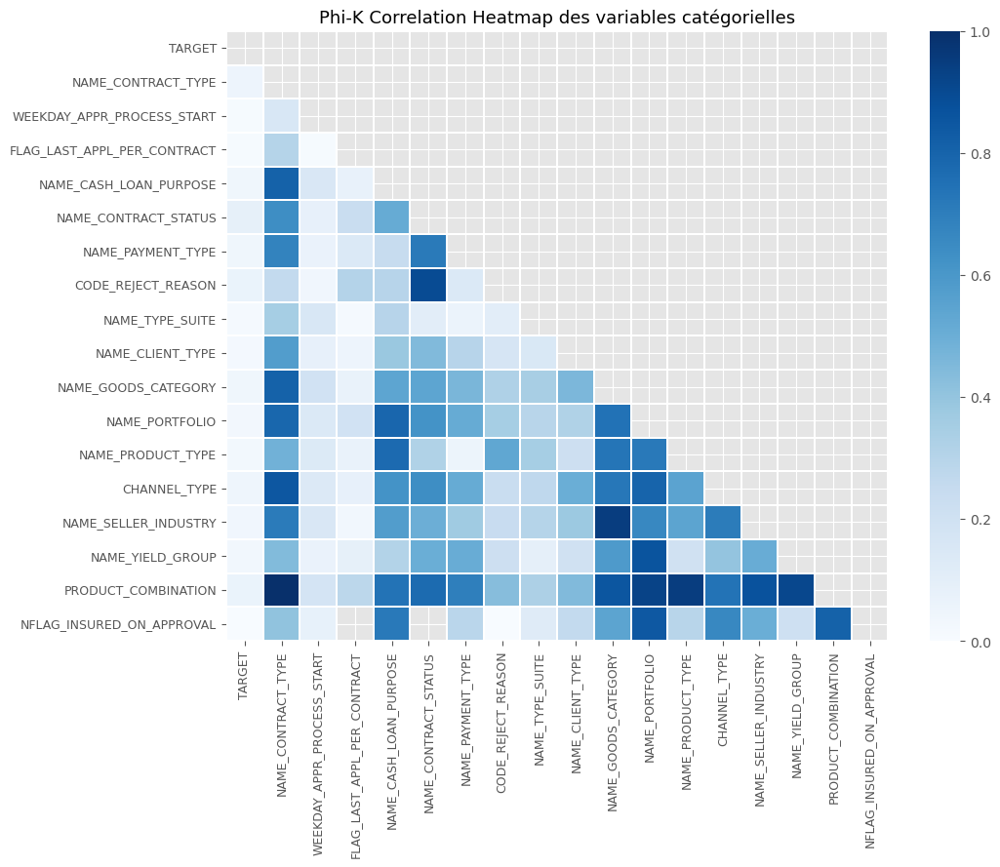

-------------------------------------------------------------------------------
Les catégories présentant les valeurs les plus élevées de la corrélation Phi-K avec la variable cible sont les suivantes :


Variable,Phik-Correlation
NAME_CONTRACT_STATUS,0.088266
PRODUCT_COMBINATION,0.063839
CODE_REJECT_REASON,0.062771
NAME_CONTRACT_TYPE,0.050859
CHANNEL_TYPE,0.050302
NAME_GOODS_CATEGORY,0.042951
NAME_CASH_LOAN_PURPOSE,0.040305
NAME_PAYMENT_TYPE,0.039752
NAME_SELLER_INDUSTRY,0.038077
NAME_YIELD_GROUP,0.034626


-------------------------------------------------------------------------------


In [14]:
# Phi-K Matrix pour variables catégoriels

cols_for_phik = ['TARGET'] + prev_merged.dtypes[prev_merged.dtypes ==
                                                'object'].index.tolist() + ['NFLAG_INSURED_ON_APPROVAL']
fctUtiles.plot_phik_matrix(prev_merged, cols_for_phik, cmap='Blues',
                 figsize=(11, 9), fontsize=9)

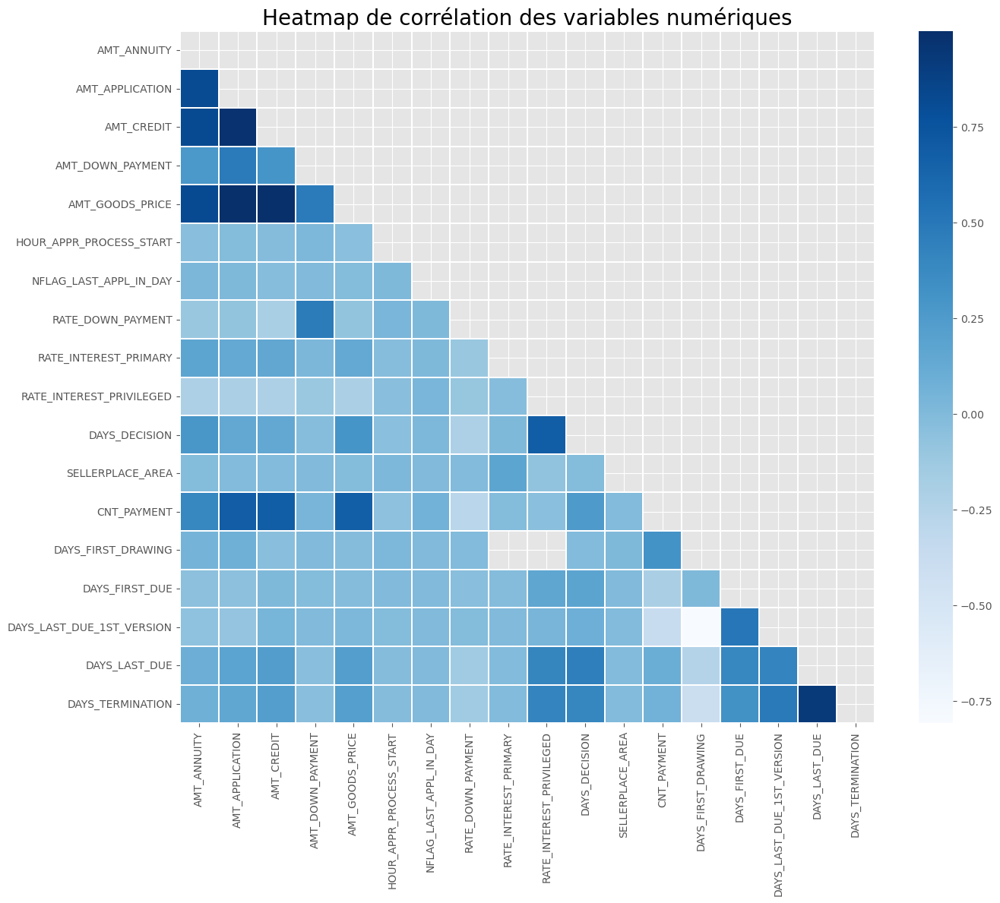

In [15]:
#Correlation Matrix of Features
corr_mat = fctUtiles.correlation_matrix(prev_merged, [
                              'SK_ID_CURR', 'SK_ID_PREV', 'NFLAG_INSURED_ON_APPROVAL'], cmap='Blues', figsize=(14, 12))
corr_mat.plot_correlation_matrix()

- **Observations et conclusions :**


1. La carte thermique ci-dessus des valeurs du coefficient Phi-K pour les caractéristiques catégorielles nous permet d'observer que

     -  La caractéristique PRODUCT_COMBINATION montre une association avec de nombreuses autres caractéristiques telles que NOM_TYPE_CONTRACT, NOM_TYPE_PRODUIT, NOM_PORTEFEUILLE, etc.
     - La fonction NOM_BONNES_CATEGORIE est également fortement associée à NOM_VENDEUR_INDUSTRIE
     - Si nous examinons l'association avec la variable TARGET, nous constatons que les caractéristiques NAME_CONTRACT_STATUS, PRODUCT_COMBINATION, CODE_REJECT_REASON font partie des caractéristiques associées les plus élevées, et nécessiteraient un examen plus approfondi
     
2. La carte thermique ci-dessus montre la corrélation entre chaque caractéristique du tableau previous_application et le reste des caractéristiques.
 
    - La corrélation élevée est particulièrement observée pour les caractéristiques :
        - DATE_TERMINATION et JOURS_DERNIERS_DATE
        - AMT_CREDIT et AMT_APPLICATION
        - AMT_APPLICATION et AMT_GOODS_PRICE
        - AMT_CREDIT et AMT_ANNUITY 
        - AMT_ANNUITY et AMT_CREDIT
        - AMT_CREDIT et AMT_GOODS_PRICE


   - Nous pouvons également constater que les caractéristiques ne présentent pas particulièrement de corrélation bonne/élevée avec Target en tant que tel. Cela implique qu'il n'y a pas vraiment de relation linéaire directe entre Target et les caractéristiques.

### Distribution des Variables

- **Distribution de  Variable NAME_CONTRACT_TYPE**


Cette colonne décrit le type de contrat du prêt précédent avec le Home Credit Group.

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'NAME_CONTRACT_TYPE' sont :
['Consumer loans' 'Cash loans' 'Revolving loans' nan 'XNA']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
Cash loans         626764
Consumer loans     625256
Revolving loans    161368
XNA                   313
Name: NAME_CONTRACT_TYPE, dtype: int64
-------------------------------------------------------------------------------
Nombre de catégories uniques pour NAME_CONTRACT_TYPE = 5


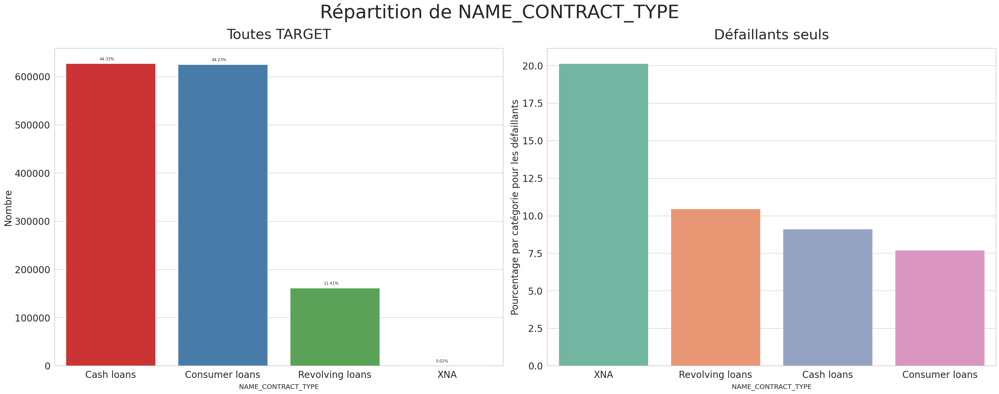

----------------------------------------------------------------------------------------------------


In [16]:
# let us first see the unique categories of 'NAME_CONTRACT_TYPE'
fctUtiles.print_unique_categories(prev_merged, 'NAME_CONTRACT_TYPE', show_counts=True)

# plotting the Bar Plot for the Column
fctUtiles.plot_categorical_variables_bar(
    prev_merged, 'NAME_CONTRACT_TYPE', horizontal_adjust=0.3, figsize=(30, 12))
print('-'*100)

- **Observations et conclusions :**


A partir des tracés ci-dessus, nous pouvons observer ce qui suit :

 1. A partir du premier subplot, nous constatons que la plupart des prêts précédents ont été soit des prêts cash, soit des prêts à la consommation, ce qui correspond à environ 44 % des prêts chacun. Les 11,41 % restants correspondent à des prêts revolving, et il y a quelques prêts nommés XNA dont les types ne sont en fait pas connus, mais ils sont très peu nombreux.
 
 
 2. En examinant le deuxième subplot, on constate que le pourcentage de défaillants pour les prêts de type XNA est le plus élevé, avec un taux de défaillance de 20 %. Le taux de défaillance suivant le plus élevé est celui des prêts revolvings, qui est proche de 10,5 %.
Les prêts cash ont des taux de défaillance plus faibles, environ 9 %, tandis que les prêts à la consommation ont tendance à avoir le plus faible pourcentage de défaillances, qui est proche de 7,5 %.

- **Distribution de la variable catégorielle NAME_CONTRACT_STATUS**


Cette colonne décrit l'état du contrat du prêt précédent avec le Crédit immobilier, c'est-à-dire s'il est actif ou fermé, etc.

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'NAME_CONTRACT_STATUS' sont :
['Approved' 'Canceled' 'Refused' nan 'Unused offer']
-------------------------------------------------------------------------------
Nombre de catégories uniques pour NAME_CONTRACT_STATUS = 5


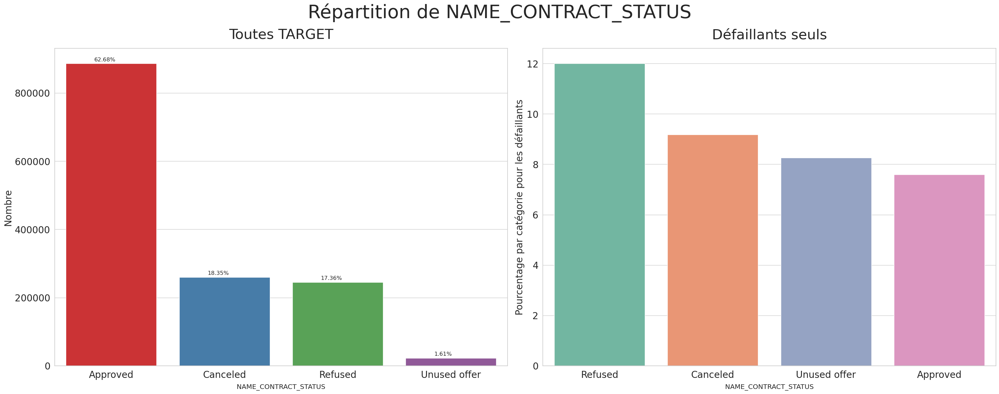

----------------------------------------------------------------------------------------------------


In [17]:
# let us first see the unique categories of 'NAME_CONTRACT_STATUS'
fctUtiles.print_unique_categories(prev_merged, 'NAME_CONTRACT_STATUS')

# plotting the Bar Plot for the Column
fctUtiles.plot_categorical_variables_bar(prev_merged, 'NAME_CONTRACT_STATUS',
                               horizontal_adjust=0.25, figsize=(30, 12), fontsize_percent='small')
print('-'*100)

- **Observations et conclusions :**


C'est ce que l'on constate à partir des tracés ci-dessus :

1. Le type de statut de contrat le plus courant est le statut approuvé. Environ 63 % des crédits précédents ont un statut approuvé. Les deux statuts suivants sont Annulé et Refusé, qui correspondent tous deux à environ 18% des prêts. Cela signifie que la plupart des prêts sont approuvés et que seule une partie d'entre eux ne le sont pas. Le type de statut de contrat le moins fréquent est Offre non utilisée, qui correspond à seulement 1,61 % de l'ensemble des prêts.
2. En examinant le deuxième sublot pour le pourcentage de mauvais payeurs, nous constatons que les prêts qui avaient auparavant le statut de refus ont tendance à être les plus mauvais payeurs des prêts actuels. Ils correspondent à environ 12 % des défaillants de cette catégorie. Ils sont suivis par les prêts dont le statut a été annulé, qui correspondent à près de 9 % du taux de défaillance. Ce comportement est tout à fait logique, car ces personnes ont dû être refusées parce qu'elles n'avaient pas le profil adéquat. Le taux de défaillance le plus faible est observé pour le statut de contrat Approuvé.

- **Distribution de la variable catégorielle CODE_REJECT_REASON**



Cette colonne décrit la raison du rejet d'un prêt précédemment demandé dans le groupe de crédit immobilier.

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'CODE_REJECT_REASON' sont :
['XAP' 'LIMIT' nan 'HC' 'SCO' 'SCOFR' 'VERIF' 'CLIENT' 'XNA' 'SYSTEM']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
XAP       1145533
HC         145984
LIMIT       47773
SCO         32636
CLIENT      22771
SCOFR       10875
XNA          4378
VERIF        3079
SYSTEM        672
Name: CODE_REJECT_REASON, dtype: int64
-------------------------------------------------------------------------------
Nombre de catégories uniques pour CODE_REJECT_REASON = 10


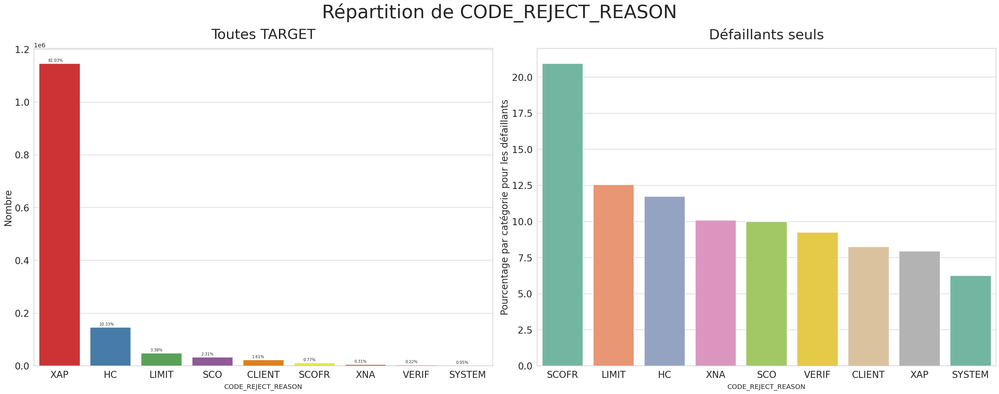

----------------------------------------------------------------------------------------------------


In [18]:
# let us first see the unique categories of 'CODE_REJECT_REASON'
fctUtiles.print_unique_categories(prev_merged, 'CODE_REJECT_REASON', show_counts=True)

# plotting the Bar Plot for the Column
fctUtiles.plot_categorical_variables_bar(
    prev_merged, 'CODE_REJECT_REASON', horizontal_adjust=0.18, figsize=(30,12))
print('-'*100)

- **Observations et conclusions :**


Le graphique ci-dessus montre la distribution de la variable catégorielle CODE_REJECT_REASON. Les observations suivantes peuvent être générées à partir du graphique ci-dessus :

1. Le type de motif de rejet le plus courant est le XAP, qui est d'environ ~81%. Les autres raisons ne représentent qu'une petite partie des motifs de rejet. HC est le deuxième motif de rejet le plus fréquent avec seulement 10,33% des occurrences.
2. La distribution du pourcentage de défaillants pour chaque catégorie de CODE_REJECT_REASON est assez intéressante. Les demandeurs dont les demandes précédentes ont été rejetées par le Code SCOFT ont le pourcentage le plus élevé de défaillants parmi eux (~21%). Ils sont suivis par LIMIT et HC qui ont environ 12,5 % et 12 % de défaillants.
3. Le motif de rejet le plus courant XAP ne correspond qu'à 7,5% des défaillants, et est le deuxième pourcentage le plus faible de défaillants après le code SYSTEME.

- **Distribution de la variable catégorielle CHANNEL_TYPE**


Cette colonne décrit le canal par lequel le client a été acquis pour le prêt précédent dans le cadre du crédit immobilier.

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'CHANNEL_TYPE' sont :
['Stone' 'Credit and cash offices' 'Country-wide' 'Regional / Local'
 'AP+ (Cash loan)' 'Contact center' nan 'Channel of corporate sales'
 'Car dealer']
-------------------------------------------------------------------------------
Nombre de catégories uniques pour CHANNEL_TYPE = 9


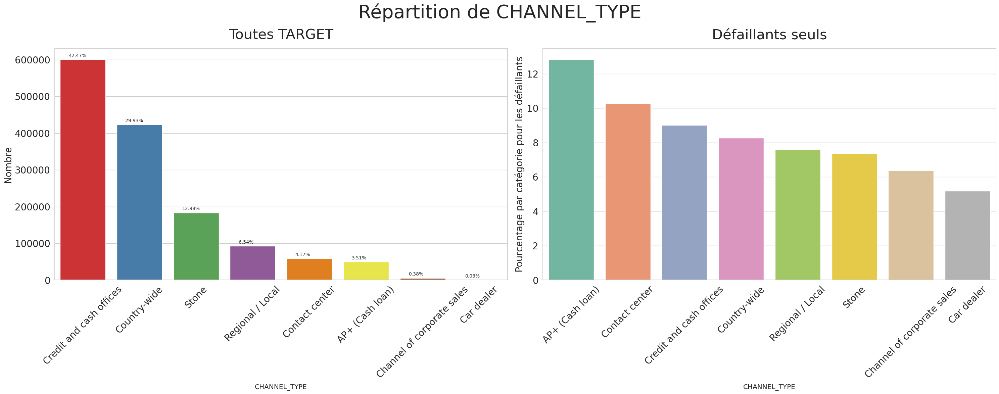

----------------------------------------------------------------------------------------------------


In [19]:
# let us first see the unique categories of 'CHANNEL_TYPE'
fctUtiles.print_unique_categories(prev_merged, 'CHANNEL_TYPE')

# plotting the Bar Plot for the Column
fctUtiles.plot_categorical_variables_bar(prev_merged, 'CHANNEL_TYPE', horizontal_adjust=0.15,
                               rotation=45, figsize=(30, 12), fontsize_percent='x-small')
print('-'*100)

- **Observations et conclusions**


Les deux graphiques ci-dessus montrent la distribution de CHANNEL_TYPE pour les prêts précédents dans le domaine du crédit immobilier.

1. A partir du premer subplot, nous voyons que la plupart des demandes ont été acquises par le biais des bureaux de crédit et de la caisse, soit environ 42,47% de demandes, qui ont été suivies par le canal national correspondant à 29,93% de demandes. Les autres types de canaux ne correspondent qu'à un nombre limité de demandes.
2. Le pourcentage de défaillances le plus élevé a été observé parmi les demandes qui avaient un type de canal AP+ (prêt en espèces) qui correspondait à environ 13% de défaillances dans cette catégorie. Les autres chaînes avaient des pourcentages de défaut plus faibles que celle-ci. La chaîne Car Dealer a enregistré le plus faible pourcentage de mauvais payeurs dans cette catégorie (seulement 5 %).

- **Distribution de la variable catégorielle PRODUCT_COMBINATION**


Cette colonne donne des détails sur la combinaison de produits des demandes précédentes.

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'PRODUCT_COMBINATION' sont :
['POS other with interest' 'Cash X-Sell: low' 'POS industry with interest'
 'POS household with interest' 'POS mobile without interest' 'Card Street'
 'Card X-Sell' 'Cash X-Sell: high' 'Cash' 'Cash Street: high'
 'Cash X-Sell: middle' 'POS mobile with interest'
 'POS household without interest' 'POS industry without interest'
 'Cash Street: low' nan 'Cash Street: middle'
 'POS others without interest']
-------------------------------------------------------------------------------
Nombre de catégories uniques pour PRODUCT_COMBINATION = 18


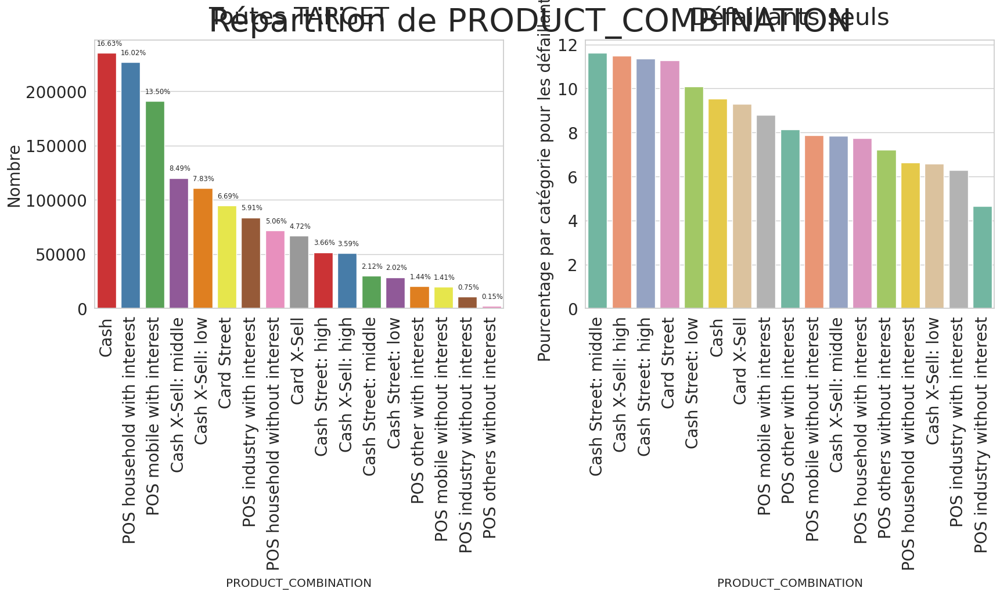

----------------------------------------------------------------------------------------------------


In [22]:
# let us first see the unique categories of 'PRODUCT_COMBINATION'
fctUtiles.print_unique_categories(prev_merged, 'PRODUCT_COMBINATION')

# plotting the Bar Plot for the Column
fctUtiles.plot_categorical_variables_bar(
    prev_merged, 'PRODUCT_COMBINATION', rotation=90, figsize=(20, 6))
print('-'*100)

- **Observations et conclusions**


La distribution de PRODUCT_COMBINATION nous permet de dégager les enseignements suivants :

1. Les 3 types de combinaison de produits les plus courants sont l'argent liquide, les points de vente domestiques avec intérêts et les points de vente mobiles avec intérêts. Ils correspondent à environ 50 % de toutes les applications.
2. En examinant le graphique du pourcentage de mauvais payeurs par catégorie, on constate une tendance à la hausse des mauvais payeurs parmi les catégories Cash Street : mobile, Cash X-sell : high, Cash Street : high et Card Street qui sont toutes proches de 11-11,5% de mauvais payeurs par catégorie. Le pourcentage le plus faible de défaillants se trouve dans la catégorie "secteur des points de vente sans intérêt", qui correspond à environ 4,5 % de défaillants.

 - **Distribution de * Variable avec DAYS (jours) Features**

**DAYS_DECISION**



Cette colonne indique le nombre de jours relatifs à la demande en cours lorsque la décision a été prise sur la demande précédente.

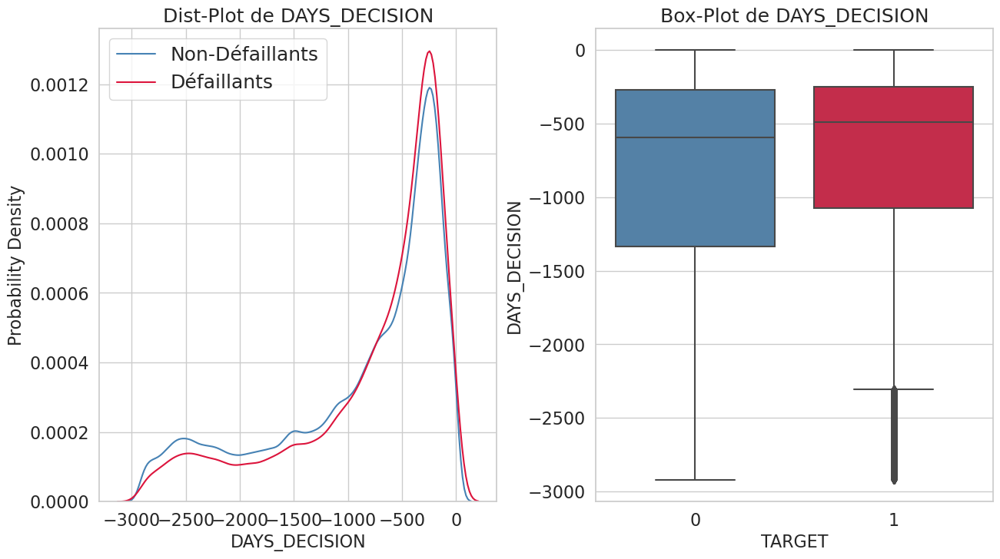

In [23]:
fctUtiles.plot_continuous_variables(prev_merged, 'DAYS_DECISION', plots=[
                          'distplot', 'box'], figsize=(15, 8))

- **Observations et conclusions**


D'après le graphique ci-dessus, nous constatons que pour les défaillants, le nombre de jours à partir desquels la décision a été prise est un peu moins élevé que pour les non défaillants. Cela signifie que les défaillants ont généralement reçu la décision relative à leurs demandes antérieures plus récemment que les non défaillants.

**DAYS_FIRST_DRAWING**



Cette colonne indique le nombre de jours écoulés depuis la demande actuelle jusqu'à ce que le premier versement de la demande précédente ait été effectué.

-------------------------------------------------------------------------------
Pecentiles de la variable DAYS_FIRST_DRAWING
Pecentile 0 = -2922.0
Pecentile 1 = -2451.0
Pecentile 2 = -1179.0
Pecentile 3 = -674.0
Pecentile 4 = -406.0
Pecentile 5 = -262.0
Pecentile 6 = -156.0
Pecentile 7 = 365243.0
Pecentile 8 = 365243.0
Pecentile 9 = 365243.0
Pecentile 10 = 365243.0
Pecentile 20 = 365243.0
Pecentile 40 = 365243.0
Pecentile 60 = 365243.0
Pecentile 80 = 365243.0
Pecentile 100 = 365243.0
-------------------------------------------------------------------------------


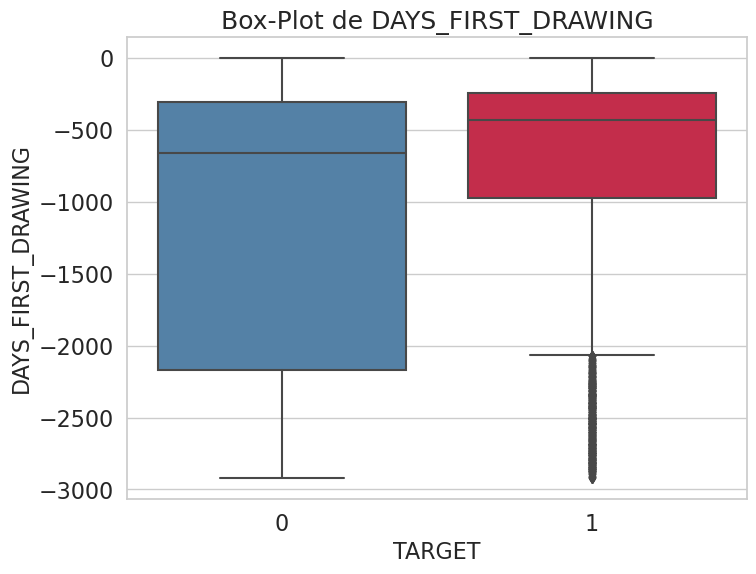

----------------------------------------------------------------------------------------------------


In [24]:
fctUtiles.print_percentiles(prev_merged, 'DAYS_FIRST_DRAWING',
                  percentiles=list(range(0, 11)) + list(range(20, 101, 20)))
fctUtiles.plot_continuous_variables(prev_merged, 'DAYS_FIRST_DRAWING', plots=[
                          'box'], figsize=(8, 6), scale_limits=[-3000, 0])
print('-'*100)

- **Observations et conclusions :**


1. En regardant les valeurs de percentile de DAYS_FIRST_DRAWING, il semble que la plupart des valeurs soient erronées, à partir du 7e percentile lui-même. Ces valeurs erronées devront être supprimées.
2. Si nous essayons d'analyser la distribution de cette colonne en supprimant les ponts erronés, nous constatons que la plupart des défaillants ont eu leur premier tirage sur un crédit antérieur plus récemment que les non défaillants. La valeur du 75e percentile pour les défaillants est également nettement inférieure à celle des non défaillants.

**DAYS_FIRST_DUE, DAYS_LAST_DUE_1ST_VERSION, DAYS_LAST_DUE, and DAYS_TERMINATION**



Ces colonnes décrivent également le nombre de jours écoulés depuis l'application actuelle pendant lesquels certaines activités ont eu lieu

In [25]:
print('-'*100)
print("Percentile Values for DAYS_FIRST_DUE")
fctUtiles.print_percentiles(prev_merged, 'DAYS_FIRST_DUE', percentiles=list(
    range(0, 11, 2)) + [20, 40, 60, 80, 100])
print("Percentile Values for DAYS_LAST_DUE_1ST_VERSION")
fctUtiles.print_percentiles(prev_merged, 'DAYS_LAST_DUE_1ST_VERSION',
                  percentiles=list(range(0, 11, 2)) + [20, 40, 60, 80, 100])
print("Percentile Values for DAYS_LAST_DUE")
fctUtiles.print_percentiles(prev_merged, 'DAYS_LAST_DUE', percentiles=list(
    range(0, 11, 2)) + [20, 40, 60, 80, 100])
print("Percentile Values for DAYS_TERMINATION")
fctUtiles.print_percentiles(prev_merged, 'DAYS_TERMINATION', percentiles=list(
    range(0, 11, 2)) + [20, 40, 60, 80, 100])

----------------------------------------------------------------------------------------------------
Percentile Values for DAYS_FIRST_DUE
-------------------------------------------------------------------------------
Pecentiles de la variable DAYS_FIRST_DUE
Pecentile 0 = -2892.0
Pecentile 2 = -2759.0
Pecentile 4 = -2648.0
Pecentile 6 = -2555.0
Pecentile 8 = -2471.0
Pecentile 10 = -2388.0
Pecentile 20 = -1882.0
Pecentile 40 = -1070.0
Pecentile 60 = -647.0
Pecentile 80 = -329.0
Pecentile 100 = 365243.0
-------------------------------------------------------------------------------
Percentile Values for DAYS_LAST_DUE_1ST_VERSION
-------------------------------------------------------------------------------
Pecentiles de la variable DAYS_LAST_DUE_1ST_VERSION
Pecentile 0 = -2801.0
Pecentile 2 = -2516.0
Pecentile 4 = -2380.0
Pecentile 6 = -2267.0
Pecentile 8 = -2159.0
Pecentile 10 = -2045.0
Pecentile 20 = -1498.0
Pecentile 40 = -644.0
Pecentile 60 = -146.0
Pecentile 80 = 273.0
Pecentile 10

- **Observations et conclusions**



A partir de toutes les valeurs de percentile ci-dessus, nous nous rendons compte que toutes les colonnes de Days ont ces valeurs erronées quelque part. Ces valeurs doivent donc être remplacées afin que notre modèle ne soit pas affecté par celles-ci.

# Conclusions de l'EDA

L'analyse exhaustive des données d'exportation que nous avons effectuée nous permet de tirer des conclusions de haut niveau sur notre ensemble de données.

1. Premièrement, l'ensemble des données devra être fusionné avec une méthode ingénieuse pour que les données fusionnées aient un sens.
2. Certaines catégories sont très bien discriminatoires entre les défaillants et les non défaillants, ce qui pourrait être important aux fins de la classification.
3. Il y a peu de variables numériques continues qui contiennent des points erronés, nous devrions traiter ces points.
4. Nous avons également remarqué certaines caractéristiques corrélées, qui ne feraient qu'augmenter la dimensionnalité des données, sans grande valeur ajoutée. Nous voudrions supprimer ces caractéristiques.
5. L'ensemble des données est globalement déséquilibré et nous devrions trouver des techniques pour gérer ce déséquilibre.
6. Pour la prévision du risque de défaillance, les défaillants ont généralement tendance à avoir un comportement qui n'est pas normal, et nous ne pouvons donc pas supprimer les valeurs aberrantes ou les points éloignés, car ils peuvent suggérer une importante tendance à la défaillance.
7. Avec tous ces éléments, nous allons passer au cleaning et au feature engineering.

### Fin